In [102]:
!pip install shap
!pip install lime
!pip install streamlit

import pandas as pd

df = pd.read_csv(
    r'C:/Users/adriano/Downloads/tcc_karina/output.csv',
    encoding='latin1',
    sep=';',
    low_memory=False
)
df.head()


,Unnamed: 0,Unnamed: 1,DT_REFER,DENOM_CIA,CD_CVM,RECUPERACAO,1::Ativo Total,2::Passivo Total,6.01::Caixa Líquido Atividades Operacionais,6.01.01::Caixa Gerado nas Operações,...,1.02.01.10::Outros Ativos Não Circulantes,1.02.01.10.01::Ativos Não-Correntes a Venda,1.02.01.10.02::Ativos de Operações Descontinuadas,1.02.02.01.04::Participações em Controladas em Conjunto,1.02.02.01.05::Outros Investimentos,1.02.03.02::Direito de Uso em Arrendamento,2.01.04.03::Financiamento por Arrendamento,2.02.01.03::Financiamento por Arrendamento,1.02.01.07.01::Imposto de Renda e Contribuição Social Diferidos,6.01.02.02::Estoques
0,00.000.000/0001-91,2015-12-31,2015-12-31,BCO BRASIL S.A.,1023,FALSO,1388864529,1388864529,28068706.0,19533413.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,2016-12-31,2016-12-31,BCO BRASIL S.A.,1023,FALSO,1387215686,1387215686,4385042.0,49785745.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,2017-12-31,2017-12-31,BCO BRASIL S.A.,1023,FALSO,1353075042,1353075042,-46925241.0,41046831.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,2018-12-31,2018-12-31,BCO BRASIL S.A.,1023,FALSO,1396507474,1396507474,28442399.0,38655376.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,2019-12-31,2019-12-31,BCO BRASIL S.A.,1023,FALSO,1452266807,1452266807,58542666.0,40007958.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Descrição: O arquivo principal é o output.csv, que será utilizado como base.
Explicação: É importante validar se o arquivo foi lido corretamente e se os dados fazem sentido (checar separador, encoding, etc).

In [3]:
# Remover duplicatas
df = df.drop_duplicates()

# Padronizar nomes de colunas
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Exemplo: Conversão de datas (se houver)
# df['data'] = pd.to_datetime(df['data'], errors='coerce')


Descrição: Remover duplicatas, corrigir inconsistências e padronizar colunas.
Explicação: A padronização e limpeza facilitam futuras análises e evitam erros em processamento.

In [5]:
# Verificar dados ausentes
df.isnull().sum()

# Exemplo de imputação:
# df['coluna'] = df['coluna'].fillna(df['coluna'].median())


unnamed:_0                                                         3452
unnamed:_1                                                            0
dt_refer                                                              0
denom_cia                                                             0
cd_cvm                                                                0
                                                                   ... 
1.02.03.02::direito_de_uso_em_arrendamento                         1164
2.01.04.03::financiamento_por_arrendamento                         1442
2.02.01.03::financiamento_por_arrendamento                         1442
1.02.01.07.01::imposto_de_renda_e_contribuição_social_diferidos    1305
6.01.02.02::estoques                                               2990
Length: 303, dtype: int64

Descrição: Identificar e tratar valores faltantes.
Explicação: A escolha da estratégia de imputação deve considerar o tipo de variável e impacto no modelo.

In [7]:
for col in df.columns:
    if df[col].dtype == 'object':
        print(f"Coluna: {col}")
        print(df[col].unique()[:30])
        print('-'*40)


Coluna: unnamed:_0
['00.000.000/0001-91' nan '00.000.208/0001-00' '00.001.180/0001-26'
 '00.070.698/0001-11' '00.336.701/0001-04' '00.354.053/0001-00'
 '00.622.416/0001-41' '00.743.065/0001-27' '00.776.574/0001-56'
 '00.864.214/0001-06' '00.994.533/0001-36' '01.027.058/0001-91'
 '01.083.200/0001-18' '01.545.826/0001-07' '01.608.571/0001-76'
 '01.838.723/0001-27' '01.917.705/0001-30' '01.917.818/0001-36'
 '01.938.783/0001-11' '01.971.614/0001-83' '02.105.040/0001-23'
 '02.149.205/0001-69' '02.193.750/0001-52' '02.302.101/0001-42'
 '02.351.144/0001-18' '02.365.069/0001-44' '02.373.517/0001-51'
 '02.387.241/0001-60' '02.429.144/0001-93']
----------------------------------------
Coluna: unnamed:_1
['2015-12-31' '2016-12-31' '2017-12-31' '2018-12-31' '2019-12-31'
 '2020-12-31' '2021-12-31' '2022-12-31' '2023-12-31' '2024-12-31'
 '2015-06-30' '2016-06-30' '2017-06-30' '2018-06-30' '2019-06-30'
 '2020-06-30' '2021-06-30' '2022-06-30' '2023-06-30' '2024-06-30'
 '2015-03-31' '2016-03-31' '2017-

In [8]:
# Primeiro, crie um dicionário para mapear empresas para segmentos
mapeamento_segmento = {
    # Setor Financeiro
    'BCO BRASIL S.A. (Banco do Brasil)': 'Financeiro',
    'BRB BANCO DE BRASILIA S.A.': 'Financeiro',
    'CIELO S.A.': 'Financeiro',
    'PORTO SEGURO S.A.': 'Financeiro',
    'VIRGO II COMPANHIA DE SECURITIZACAO': 'Financeiro',
    # Energia
    'CENTRAIS ELET BRAS S.A. - ELETROBRAS': 'Energia',
    'COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB': 'Energia',
    'STATKRAFT ENERGIAS RENOVAVEIS S.A.': 'Energia',
    # ...continue para os demais setores
    'BRF S.A. (Brasil Foods)': 'Alimentos',
    'AMERICANAS S.A.': 'Varejo',
    # Adicione todos os demais conforme a lista acima...
}

# Função para mapear o nome para o segmento
def obter_segmento(nome):
    return mapeamento_segmento.get(nome, 'Outro')

# Criar coluna de segmento
df['segmento'] = df['denom_cia'].apply(obter_segmento)


In [9]:
indicador_map = {
    'Liquidez Corrente': ['Ativo Circulante'],
    'Liquidez Seca': ['Caixa'],
    'Liquidez Imediata': ['Banco', 'Aplicações', 'Estoques', 'Passivo Circulante', 'PL'],
    'Endividamento Geral': ['Passivo Circulante', 'Passivo Não Circulante', 'Ativo Total'],
    'Composição do Endividamento': ['Passivo Circulante', 'Passivo Não Circulante', 'Endividamento'],
    'Imobilização do Patrimônio Líquido': ['Ativo Não Circulante', 'Patrimônio Líquido'],
    'Margem EBITDA': ['EBITDA', 'Receita Líquida'],
    'Retorno sobre Patrimônio Líquido (ROE)': ['Lucro Líquido', 'Patrimônio Líquido'],
    'Margem Líquida': ['Lucro Líquido', 'Receita Líquida'],
    'Margem Operacional': ['Lucro Operacional', 'Receita Líquida'],
    'Giro do Ativo': ['Receita Líquida', 'Ativo Total'],
    'Rentabilidade do Ativo (ROA)': ['Lucro Líquido', 'Ativo Total'],
    'Rentabilidade do Capital Investido (ROIC)': ['Lucro Operacional Após IR', 'Capital Investido'],
    'Liquidez Geral': ['Ativo Circulante', 'Ativo Não Circulante', 'Passivo Circulante', 'Passivo Não Circulante'],
    'Capital de Giro Líquido': ['Ativo Circulante', 'Passivo Circulante'],
    'Participação de Capitais de Terceiros': ['Passivo Circulante', 'Passivo Não Circulante', 'Patrimônio Líquido'],
    'Participação de Capitais Próprios': ['Patrimônio Líquido', 'Ativo Total'],
    'Cobertura de Juros': ['Lucro Antes dos Juros e Impostos (LAJIR)', 'Despesa de Juros'],
    'Prazos Médios de Recebimento': ['Clientes', 'Receita Líquida'],
    'Prazos Médios de Pagamento': ['Fornecedores', 'Custo dos Produtos Vendidos'],
    'Prazos Médios de Estocagem': ['Estoques', 'Custo dos Produtos Vendidos'],
    'Ciclo Operacional': ['Prazos Médios de Recebimento', 'Prazos Médios de Estocagem'],
    'Ciclo Financeiro': ['Ciclo Operacional', 'Prazos Médios de Pagamento'],
    # Adicione outros indicadores conforme a sua planilha,
    # incluindo indicadores setoriais ou customizados conforme projeto.
}


In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lista dos indicadores que realmente existem no seu DataFrame
indicadores_criados = [ind for ind in indicador_map if ind in df.columns]

# Define o número máximo de categorias no eixo x para exibir (para não poluir o gráfico)
max_segmentos = 15

for ind in indicadores_criados:
    plt.figure(figsize=(12, 6))
    # Filtra segmentos com poucos registros, se desejar
    segmentos_unicos = df['segmento'].nunique()
    if segmentos_unicos > max_segmentos:
        top_segmentos = df['segmento'].value_counts().index[:max_segmentos]
        dados_plot = df[df['segmento'].isin(top_segmentos)]
        sns.boxplot(x='segmento', y=ind, data=dados_plot)
    else:
        sns.boxplot(x='segmento', y=ind, data=df)
    plt.title(f'Distribuição de {ind} por Segmento')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [11]:
print(df.columns)
# Lista com todas as colunas envolvidas nos cálculos
cols_numericas = set([col for contas in indicador_map.values() for col in contas])
cols_numericas = [col for col in cols_numericas if col in df.columns]

# Converter todas para numérico (force naN onde não for possível)
for col in cols_numericas:
    df[col] = pd.to_numeric(df[col].str.replace(',','.', regex=False), errors='coerce') if df[col].dtype == 'O' else pd.to_numeric(df[col], errors='coerce')



Index(['unnamed:_0', 'unnamed:_1', 'dt_refer', 'denom_cia', 'cd_cvm',
       'recuperacao', '1::ativo_total', '2::passivo_total',
       '6.01::caixa_líquido_atividades_operacionais',
       '6.01.01::caixa_gerado_nas_operações',
       ...
       '1.02.01.10.01::ativos_não-correntes_a_venda',
       '1.02.01.10.02::ativos_de_operações_descontinuadas',
       '1.02.02.01.04::participações_em_controladas_em_conjunto',
       '1.02.02.01.05::outros_investimentos',
       '1.02.03.02::direito_de_uso_em_arrendamento',
       '2.01.04.03::financiamento_por_arrendamento',
       '2.02.01.03::financiamento_por_arrendamento',
       '1.02.01.07.01::imposto_de_renda_e_contribuição_social_diferidos',
       '6.01.02.02::estoques', 'segmento'],
      dtype='object', length=304)


In [12]:
indicador_map = {
    # Liquidez Corrente = Ativo Total / Passivo Total
    'Liquidez Corrente': ['1::ativo_total', '2::passivo_total'],
    # ROE = Lucro Líquido / Patrimônio Líquido Consolidado
    'ROE': ['5.05.01::lucro_líquido_do_período', '2.03::patrimônio_líquido_consolidado'],
    # Margem Líquida = Lucro Líquido / Receita de Venda de Bens e/ou Serviços
    'Margem Líquida': ['5.05.01::lucro_líquido_do_período', '3.01::receita_de_venda_de_bens_e/ou_serviços'],
    # Margem Operacional = Resultado Antes do Resultado Financeiro e dos Tributos / Receita de Venda
    'Margem Operacional': ['3.05::resultado_antes_do_resultado_financeiro_e_dos_tributos', '3.01::receita_de_venda_de_bens_e/ou_serviços'],
    # Giro do Ativo = Receita de Venda / Ativo Total
    'Giro do Ativo': ['3.01::receita_de_venda_de_bens_e/ou_serviços', '1::ativo_total'],
    # ROA = Lucro Líquido / Ativo Total
    'ROA': ['5.05.01::lucro_líquido_do_período', '1::ativo_total'],
    # Endividamento Geral = Passivo Total / Ativo Total
    'Endividamento Geral': ['2::passivo_total', '1::ativo_total'],
    # Imobilização do Patrimônio Líquido = Ativo Não Circulante / Patrimônio Líquido Consolidado
    'Imobilização do Patrimônio Líquido': ['1.02::ativo_não_circulante', '2.03::patrimônio_líquido_consolidado'],
    # Capital de Giro Líquido = Ativo Circulante - Passivo Circulante
    'Capital de Giro Líquido': ['1.01::ativo_circulante', '2.01::passivo_circulante'],
    # Participação de Capitais de Terceiros = Passivo Total / Patrimônio Líquido Consolidado
    'Participação de Capitais de Terceiros': ['2::passivo_total', '2.03::patrimônio_líquido_consolidado'],
    # Participação de Capitais Próprios = Patrimônio Líquido Consolidado / Ativo Total
    'Participação de Capitais Próprios': ['2.03::patrimônio_líquido_consolidado', '1::ativo_total'],
    # Índice de Estoques = Estoques / Receita de Venda
    'Índice de Estoques': ['1.01.04::estoques', '3.01::receita_de_venda_de_bens_e/ou_serviços'],
    # Liquidez Seca = (Ativo Circulante - Estoques) / Passivo Circulante
    'Liquidez Seca': ['1.01::ativo_circulante', '1.01.04::estoques', '2.01::passivo_circulante'],
}
import numpy as np

# 1. Lista de todas as colunas usadas nos indicadores
cols_numericas = set([col for contas in indicador_map.values() for col in contas])
cols_numericas = [col for col in cols_numericas if col in df.columns]

# 2. Limpeza e conversão robusta
for col in cols_numericas:
    # Remove espaços, substitui vírgula por ponto, elimina caracteres não numéricos exceto ponto e menos
    df[col] = (
        df[col].astype(str)
        .str.strip()
        .str.replace(',', '.', regex=False)
        .str.replace(r'[^\d\.\-]+', '', regex=True)
        .replace('', np.nan)
    )
    df[col] = pd.to_numeric(df[col], errors='coerce')

# 3. Checar tipos convertidos
print(df[cols_numericas].dtypes)


2.03::patrimônio_líquido_consolidado                            float64
1::ativo_total                                                  float64
1.01.04::estoques                                               float64
2::passivo_total                                                  int64
3.05::resultado_antes_do_resultado_financeiro_e_dos_tributos    float64
1.02::ativo_não_circulante                                      float64
1.01::ativo_circulante                                          float64
5.05.01::lucro_líquido_do_período                               float64
3.01::receita_de_venda_de_bens_e/ou_serviços                    float64
2.01::passivo_circulante                                        float64
dtype: object


In [13]:
print(df.columns.tolist())

['unnamed:_0', 'unnamed:_1', 'dt_refer', 'denom_cia', 'cd_cvm', 'recuperacao', '1::ativo_total', '2::passivo_total', '6.01::caixa_líquido_atividades_operacionais', '6.01.01::caixa_gerado_nas_operações', '6.01.02::variações_nos_ativos_e_passivos', '6.01.03::outros', '6.02::caixa_líquido_atividades_de_investimento', '6.03::caixa_líquido_atividades_de_financiamento', '6.04::variação_cambial_s/_caixa_e_equivalentes', '6.05::aumento_(redução)_de_caixa_e_equivalentes', '6.05.01::saldo_inicial_de_caixa_e_equivalentes', '6.05.02::saldo_final_de_caixa_e_equivalentes', '5.01::saldos_iniciais', '5.02::ajustes_de_exercícios_anteriores', '5.03::saldos_iniciais_ajustados', '5.04::transações_de_capital_com_os_sócios', '5.04.01::aumentos_de_capital', '5.04.02::gastos_com_emissão_de_ações', '5.04.03::opções_outorgadas_reconhecidas', '5.04.04::ações_em_tesouraria_adquiridas', '5.04.05::ações_em_tesouraria_vendidas', '5.04.06::dividendos', '5.04.07::juros_sobre_capital_próprio', '5.05::resultado_abrangen

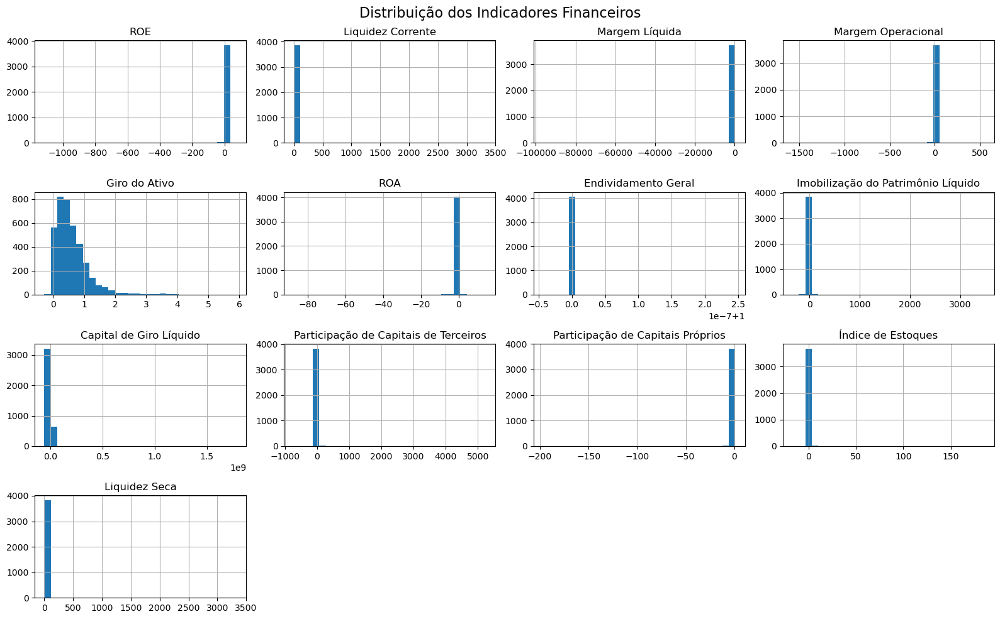

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Exemplo de dicionário de indicadores (ajuste conforme o seu)
indicador_map = {
    'ROE': ['5.05.01::lucro_líquido_do_período', '2.03::patrimônio_líquido_consolidado'],
    'Liquidez Corrente': ['1.01::ativo_circulante', '2.01::passivo_circulante'],
    'Margem Líquida': ['5.05.01::lucro_líquido_do_período', '3.01::receita_de_venda_de_bens_e/ou_serviços'],
    'Margem Operacional': ['3.05::resultado_antes_do_resultado_financeiro_e_dos_tributos', '3.01::receita_de_venda_de_bens_e/ou_serviços'],
    'Giro do Ativo': ['3.01::receita_de_venda_de_bens_e/ou_serviços', '1::ativo_total'],
    'ROA': ['5.05.01::lucro_líquido_do_período', '1::ativo_total'],
    'Endividamento Geral': ['2::passivo_total', '1::ativo_total'],
    'Imobilização do Patrimônio Líquido': ['1.02::ativo_não_circulante', '2.03::patrimônio_líquido_consolidado'],
    'Capital de Giro Líquido': ['1.01::ativo_circulante', '2.01::passivo_circulante'],
    'Participação de Capitais de Terceiros': ['2::passivo_total', '2.03::patrimônio_líquido_consolidado'],
    'Participação de Capitais Próprios': ['2.03::patrimônio_líquido_consolidado', '1::ativo_total'],
    'Índice de Estoques': ['1.01.04::estoques', '3.01::receita_de_venda_de_bens_e/ou_serviços'],
    'Liquidez Seca': ['1.01::ativo_circulante', '1.01.04::estoques', '2.01::passivo_circulante'],
}

# Cálculo dos indicadores de forma robusta
for ind, contas in indicador_map.items():
    try:
        if all(col in df.columns for col in contas):
            if len(contas) == 2:
                if ind == 'Capital de Giro Líquido':
                    df[ind] = pd.to_numeric(df[contas[0]], errors='coerce') - pd.to_numeric(df[contas[1]], errors='coerce')
                else:
                    df[ind] = pd.to_numeric(df[contas[0]], errors='coerce') / pd.to_numeric(df[contas[1]], errors='coerce')
            elif ind == 'Liquidez Seca' and len(contas) == 3:
                df[ind] = (pd.to_numeric(df[contas[0]], errors='coerce') - pd.to_numeric(df[contas[1]], errors='coerce')) / pd.to_numeric(df[contas[2]], errors='coerce')
    except Exception as e:
        print(f"Erro ao calcular {ind}: {e}")

# Seleção e visualização dos indicadores calculados
indicadores_criados = [
    ind for ind in indicador_map.keys()
    if ind in df.columns and pd.api.types.is_numeric_dtype(df[ind]) and df[ind].notna().sum() > 0
]

df[indicadores_criados] = df[indicadores_criados].replace([np.inf, -np.inf], np.nan)

if len(indicadores_criados) > 0:
    df[indicadores_criados].hist(figsize=(16, 10), bins=30)
    plt.suptitle('Distribuição dos Indicadores Financeiros', fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("Nenhum indicador disponível para plotar. Verifique o cálculo e os dados-base dos indicadores.")


Indicador: ROE | NaN: 203, inf: 0, válidos: 3862
Indicador: Liquidez Corrente | NaN: 202, inf: 0, válidos: 3863
Indicador: Margem Líquida | NaN: 341, inf: 0, válidos: 3724
Indicador: Margem Operacional | NaN: 340, inf: 0, válidos: 3725
Indicador: Giro do Ativo | NaN: 229, inf: 0, válidos: 3836
Indicador: ROA | NaN: 10, inf: 0, válidos: 4055
Indicador: Endividamento Geral | NaN: 8, inf: 0, válidos: 4057
Indicador: Imobilização do Patrimônio Líquido | NaN: 202, inf: 0, válidos: 3863
Indicador: Capital de Giro Líquido | NaN: 194, inf: 0, válidos: 3871
Indicador: Participação de Capitais de Terceiros | NaN: 202, inf: 0, válidos: 3863
Indicador: Participação de Capitais Próprios | NaN: 202, inf: 0, válidos: 3863
Indicador: Índice de Estoques | NaN: 340, inf: 0, válidos: 3725
Indicador: Liquidez Seca | NaN: 229, inf: 0, válidos: 3836

Resumo estatístico dos indicadores disponíveis (sem inf/NaN):


,count,mean,std,min,25%,50%,75%,max
ROE,3721.0,-1.903728e-01,1.839983e+01,-1.115101e+03,0.000000,0.087500,1.914621e-01,7.500000e+01
Liquidez Corrente,3721.0,1.980528e+00,3.208217e+00,4.145916e-03,0.979027,1.477500,2.197868e+00,1.134747e+02
Margem Líquida,3721.0,-4.415964e+01,1.638077e+03,-9.635482e+04,-0.019681,0.048252,1.405055e-01,4.009376e+02
Margem Operacional,3721.0,-1.255039e+00,4.006443e+01,-1.577455e+03,0.032979,0.117320,2.365175e-01,5.555259e+02
Giro do Ativo,3721.0,6.008611e-01,5.242573e-01,-2.831919e-01,0.255400,0.481291,8.125347e-01,5.910653e+00
ROA,3721.0,-2.781474e-02,9.313610e-01,-2.964330e+01,-0.008404,0.025969,6.813447e-02,1.453854e+01
Endividamento Geral,3721.0,1.000000e+00,4.022855e-09,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000e+00
Imobilização do Patrimônio Líquido,3721.0,2.869900e+00,5.511892e+01,-2.388115e+02,0.766108,1.417316,2.381400e+00,3.195203e+03
Capital de Giro Líquido,3721.0,4.518766e+06,5.077587e+07,-5.959600e+07,-7574.000000,259585.000000,1.221024e+06,1.786202e+09
Participação de Capitais de Terceiros,3721.0,4.801679e+00,9.130345e+01,-7.310383e+02,1.644585,2.367465,3.687378e+00,5.254589e+03


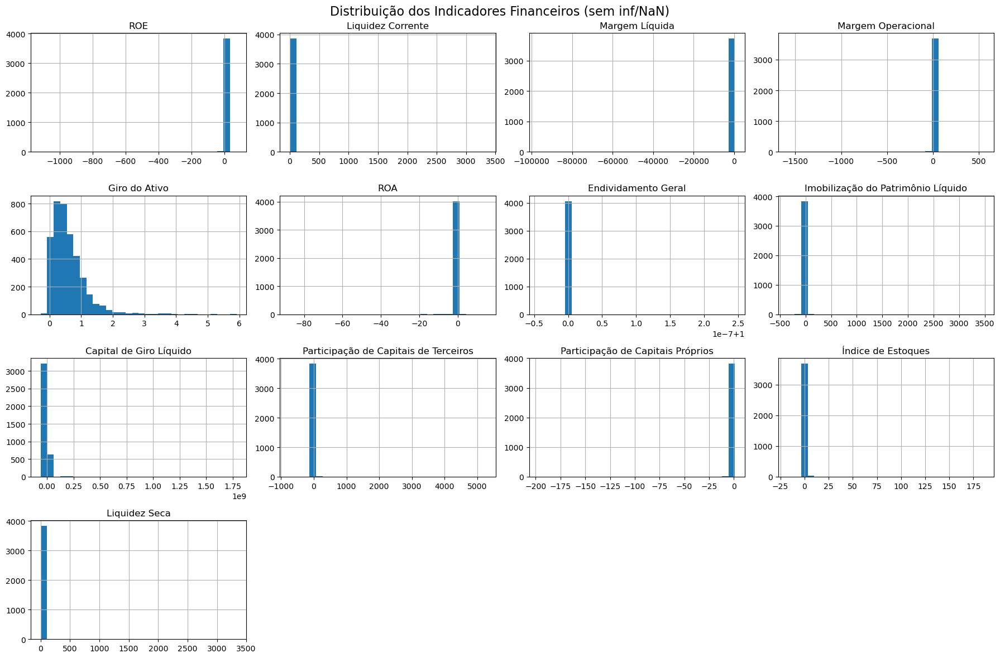

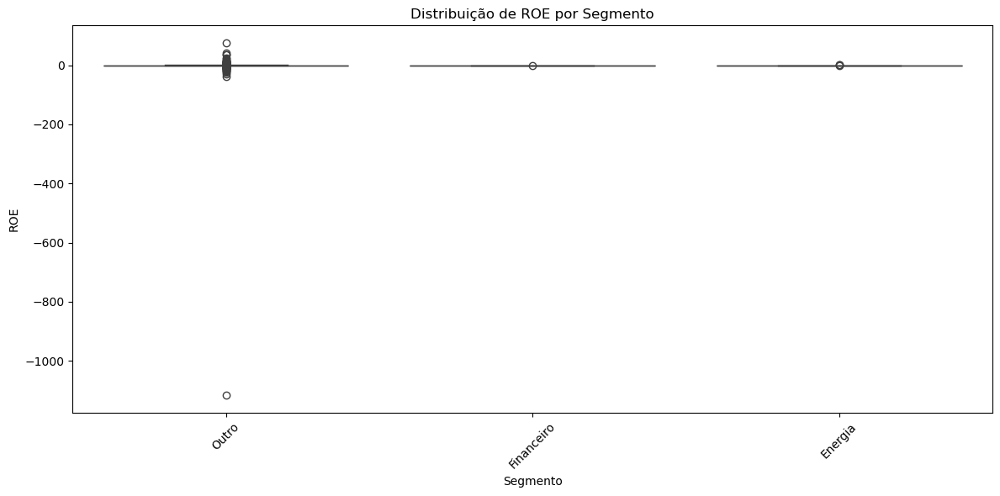

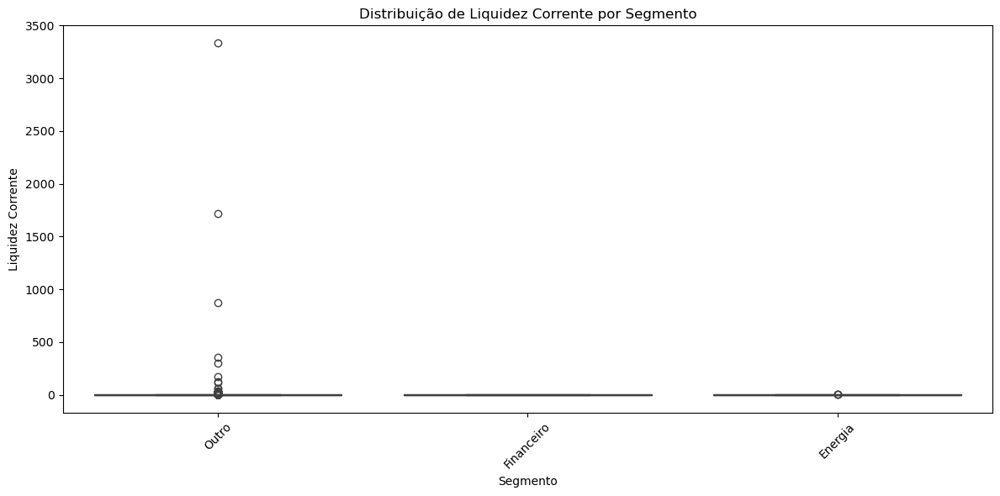

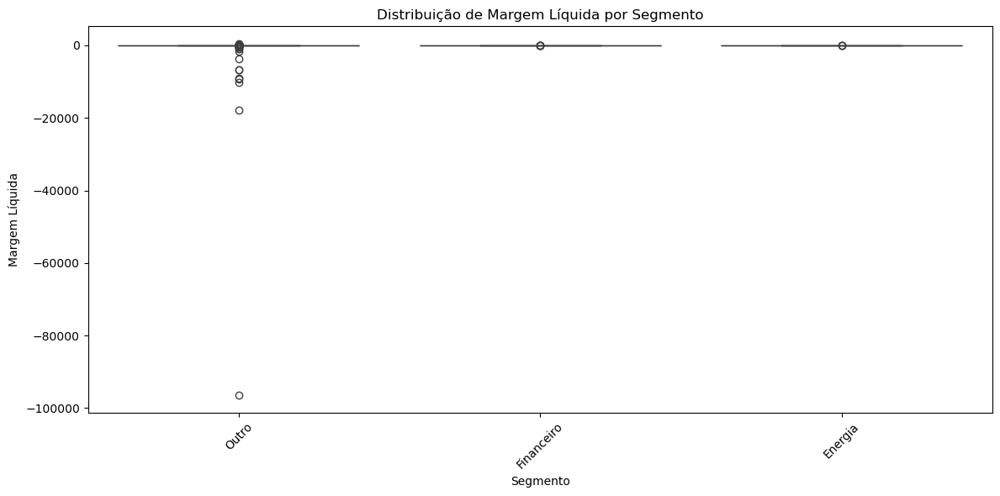

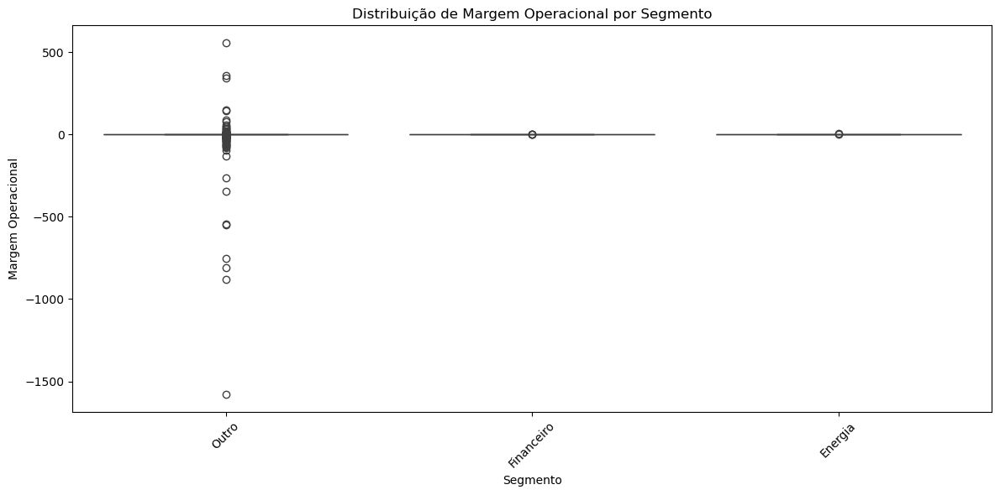

...

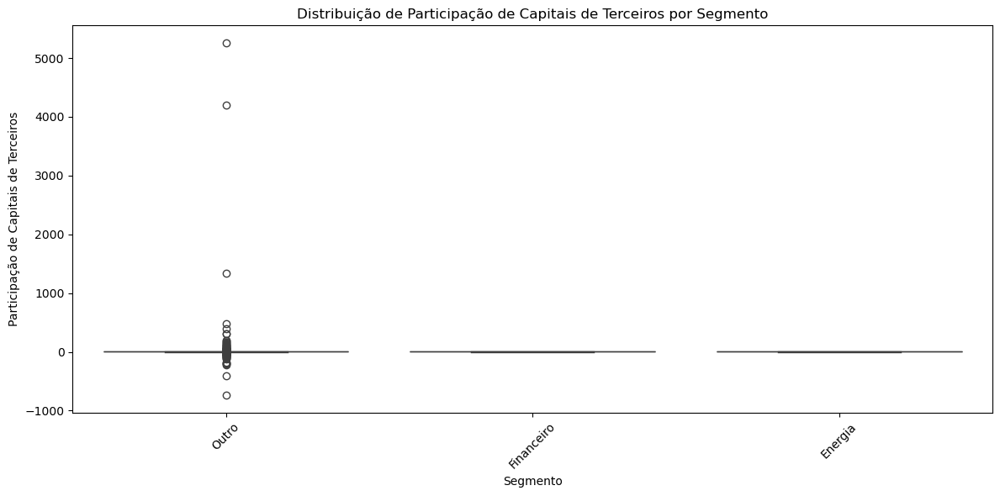

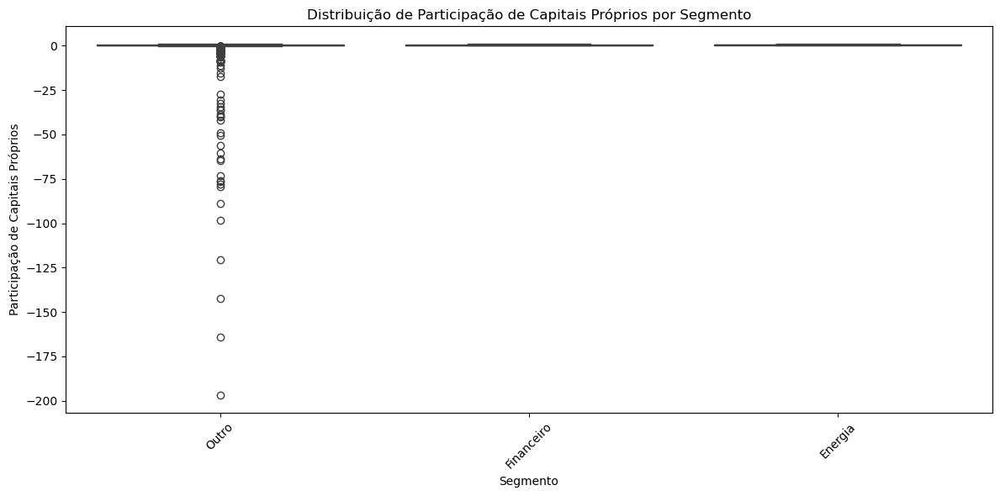

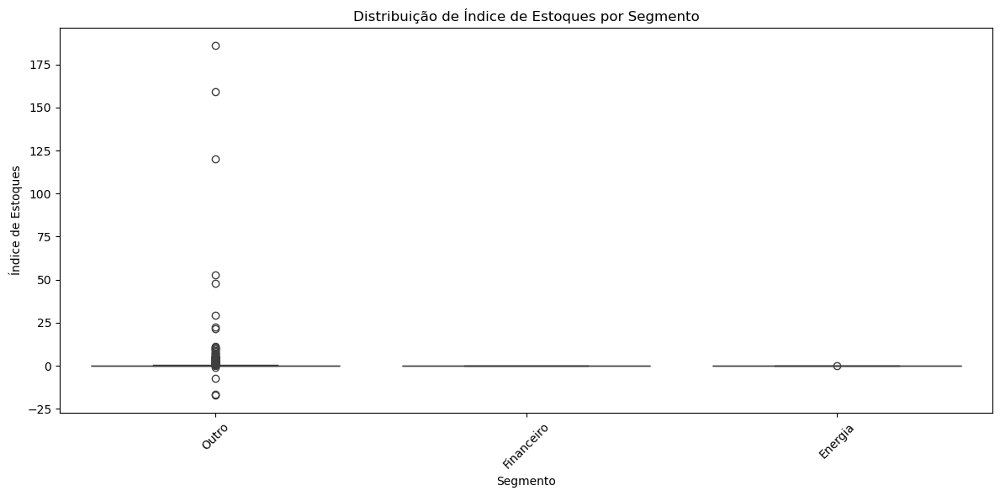

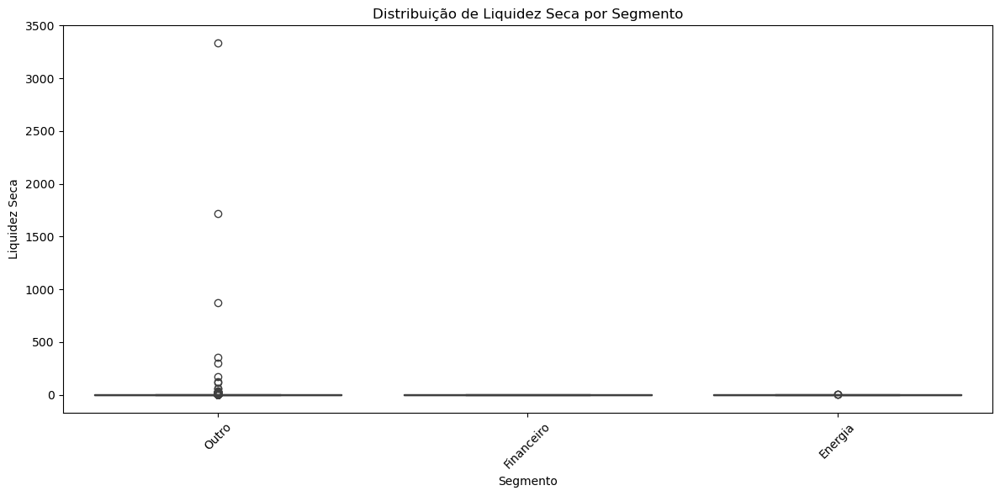

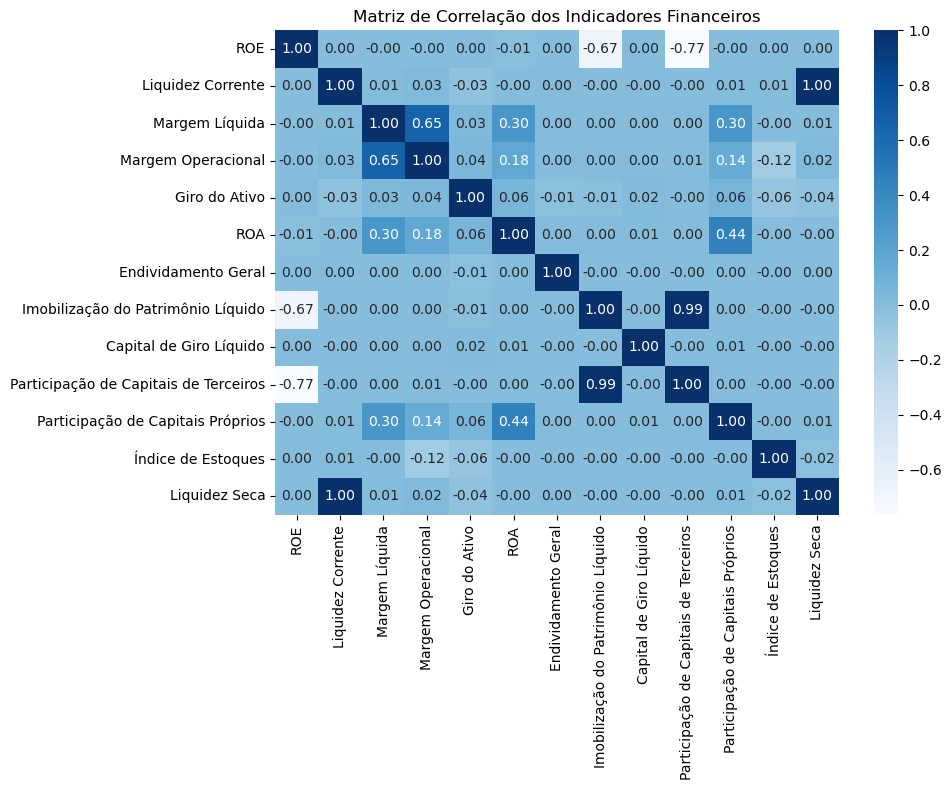

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Limpeza: substituir valores infinitos por NaN
df[indicadores_criados] = df[indicadores_criados].replace([np.inf, -np.inf], np.nan)

# 2. Diagnóstico: Quantidade de casos problemáticos
for ind in indicadores_criados:
    n_nan = df[ind].isna().sum()
    n_inf = np.isinf(df[ind]).sum()
    print(f"Indicador: {ind} | NaN: {n_nan}, inf: {n_inf}, válidos: {df[ind].notna().sum()}")

# 3. Estatísticas descritivas dos indicadores (apenas valores válidos)
print("\nResumo estatístico dos indicadores disponíveis (sem inf/NaN):")
display(df[indicadores_criados].dropna().describe().T)

# 4. Histogramas das distribuições dos indicadores
df[indicadores_criados].hist(figsize=(18, 12), bins=30)
plt.suptitle('Distribuição dos Indicadores Financeiros (sem inf/NaN)', fontsize=16)
plt.tight_layout()
plt.show()

# 5. Boxplot por segmento para cada indicador
for ind in indicadores_criados:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='segmento', y=ind, data=df)
    plt.title(f'Distribuição de {ind} por Segmento')
    plt.xlabel('Segmento')
    plt.ylabel(ind)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 6. Matriz de correlação entre indicadores
plt.figure(figsize=(10, 8))
sns.heatmap(df[indicadores_criados].corr(), annot=True, fmt=".2f", cmap='Blues')
plt.title('Matriz de Correlação dos Indicadores Financeiros')
plt.tight_layout()
plt.show()


Em qual etapa do pipeline estamos?
Pelo que você descreveu e pelos códigos e prints enviados, seu projeto encontra-se na etapa de Análise Exploratória e Diagnóstico dos Indicadores.

Você já realizou:

Cálculo dos principais indicadores financeiros para cada empresa/período.

Diagnóstico e limpeza de dados (valores NaN, inf).

Análise descritiva dos indicadores (estatísticas, histogramas, boxplots por segmento).

Matriz de correlação entre os indicadores.

Essa é uma etapa fundamental para entender a qualidade dos dados, a distribuição dos indicadores e as diferenças entre segmentos/setores.

Quais os próximos passos do pipeline?
1. Análise Setorial/Segmentada Profunda
Comparar os indicadores entre segmentos/setores relevantes (bancos, agro, energia etc).

Identificar outliers por segmento, empresas que fogem do padrão.

Comparar evolução temporal dos indicadores (se há diferentes anos/meses).

Usar gráficos agregados: médias, medianas, boxplots, barras agrupadas.

Opcional: Testes estatísticos para verificar se as diferenças entre setores são significativas (ex: ANOVA, Kruskal-Wallis).

2. Benchmarking e Ranking
Ordenar e rankear empresas por indicador dentro de cada segmento (TOP 5 melhores e piores, por exemplo).

Mostrar as empresas mais eficientes/lucrativas/alavancadas, etc., em cada setor.

3. Clusterização ou Agrupamentos (opcional)
Se desejar aprofundar, realizar clusterização para agrupar empresas com perfis financeiros semelhantes (ex: KMeans, Hierárquico).

Visualizar os clusters versus segmentos oficiais para verificar padrões não triviais.

4. Modelagem ou Predição (opcional/avançado)
Se houver objetivo de prever insolvência, desempenho futuro ou risco, construir modelos supervisionados (árvore, regressão, etc.).

Avaliar variáveis mais importantes para explicar o resultado de interesse (feature importance).

5. Relatórios e Visualizações Avançadas
Criar dashboards ou painéis sintéticos (Power BI, matplotlib, seaborn, plotly).

Exportar resultados principais (indicadores calculados, rankings, gráficos) para Excel ou PDF.

6. Conclusão e Insights
Sintetizar os principais achados para cada setor/segmento.

Apontar riscos, oportunidades, recomendações.

1. Coleta e Limpeza           ✔️
2. Cálculo de Indicadores     ✔️
3. Análise Descritiva         ✔️
4. Comparação por Segmento    ⬅️ (PRÓXIMO)
5. Benchmark/Ranking          ➡️
6. Clusterização (Opcional)   ➡️
7. Modelagem (Opcional)       ➡️
8. Relatório/Conclusão        ➡️


Liquidez Corrente                                  ROE            \
                        mean    median        std count      mean    median   
segmento                                                                      
Energia             1.858662  1.290201   1.624889    29  0.130397  0.085088   
Financeiro          1.966879  1.337633   1.075870    17  0.115579  0.130177   
Outro               3.805660  1.474838  62.915343  3817 -0.175664  0.087661   

                            Margem Líquida            ...  \
                  std count           mean    median  ...   
segmento                                              ...   
Energia      0.252266    29       0.364169  0.124699  ...   
Financeiro   0.068186    17       0.135677  0.076275  ...   
Outro       18.195092  3816     -44.679409  0.047305  ...   

           Participação de Capitais Próprios       Índice de Estoques  \
                                         std count               mean   
segmento                                                                
Energia                             0.202600    29           0.016146   
Financeiro                          0.243320    17           0.000000   
Outro                               6.934271  3817           0.387912   

                                     Liquidez Seca                             
              median       std count          mean    median        std count  
segmento                                                                       
Energia     0.011483  0.017345    29      1.831175  1.285000   1.591244    29  
Financeiro  0.000000  0.000000    17      1.966879  1.337633   1.075870    17  
Outro       0.065662  4.761171  3679      3.475357  1.180816  63.138107  3790  

[3 rows x 52 columns]

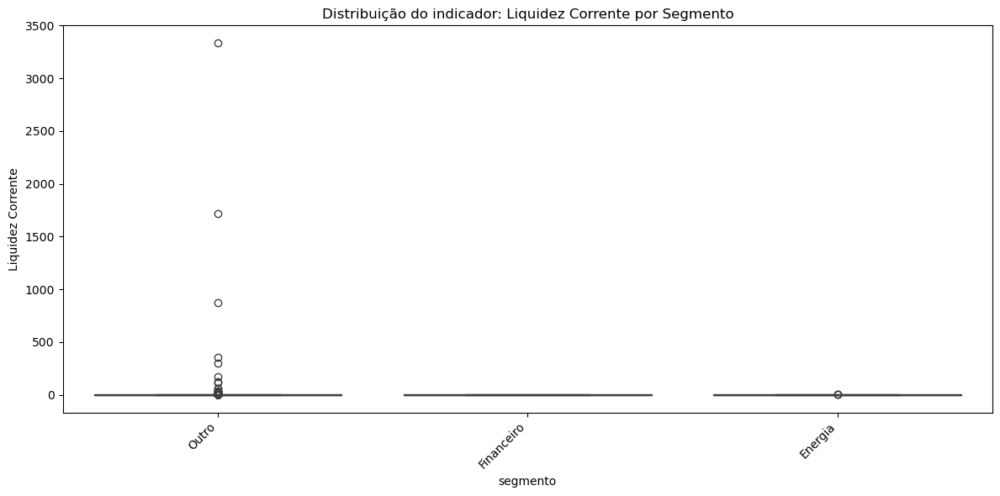

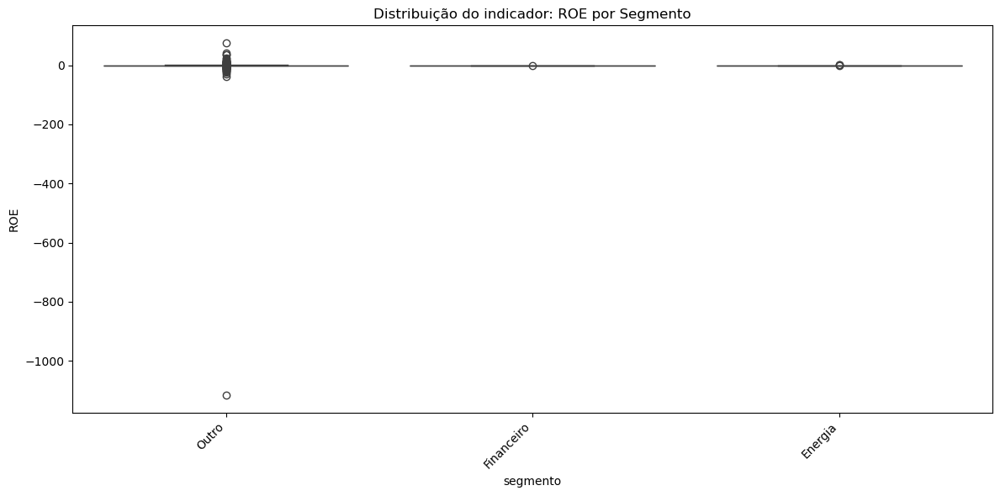

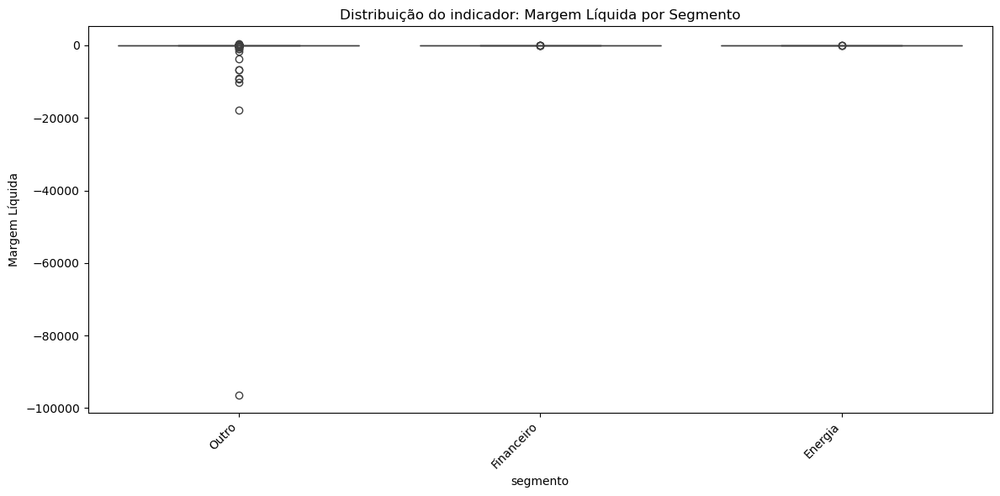

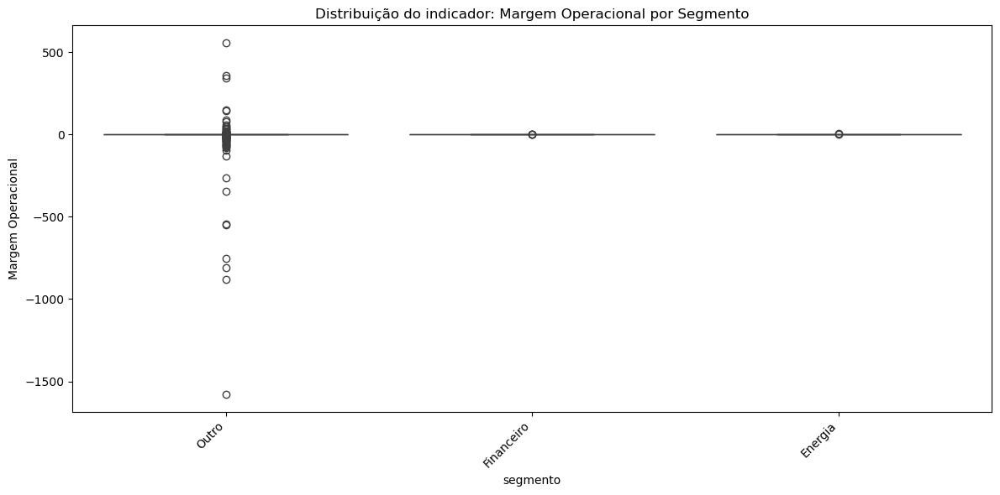

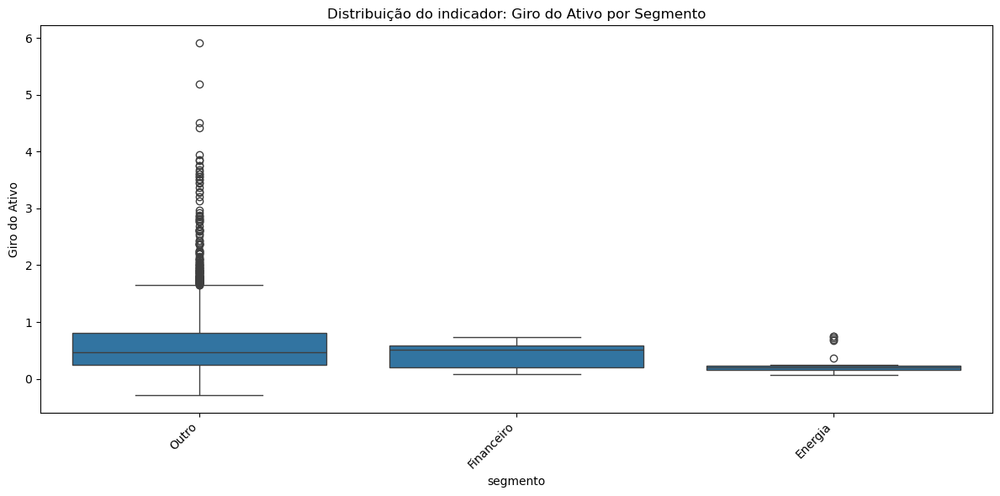

...

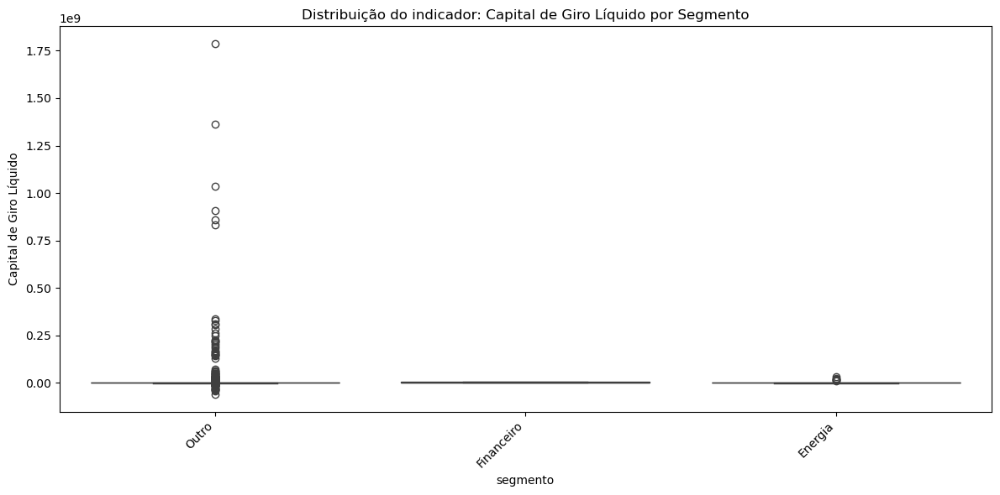

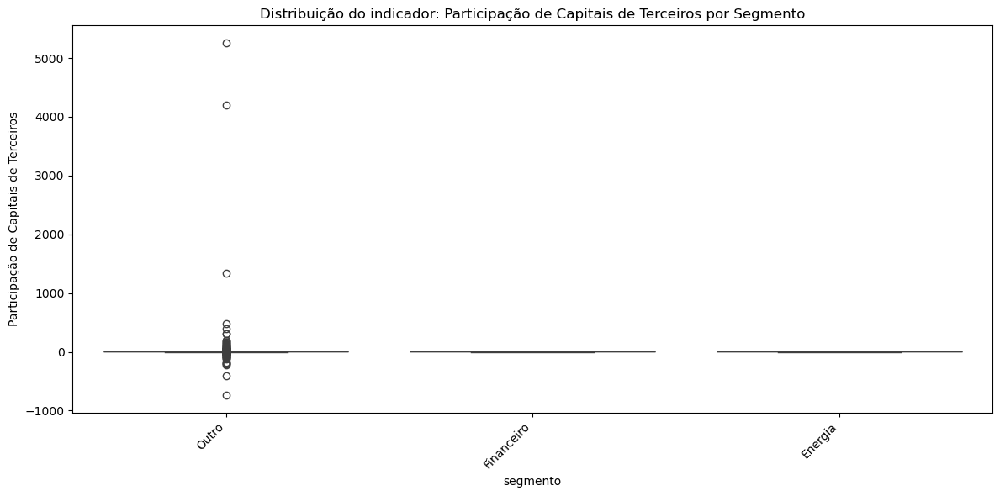

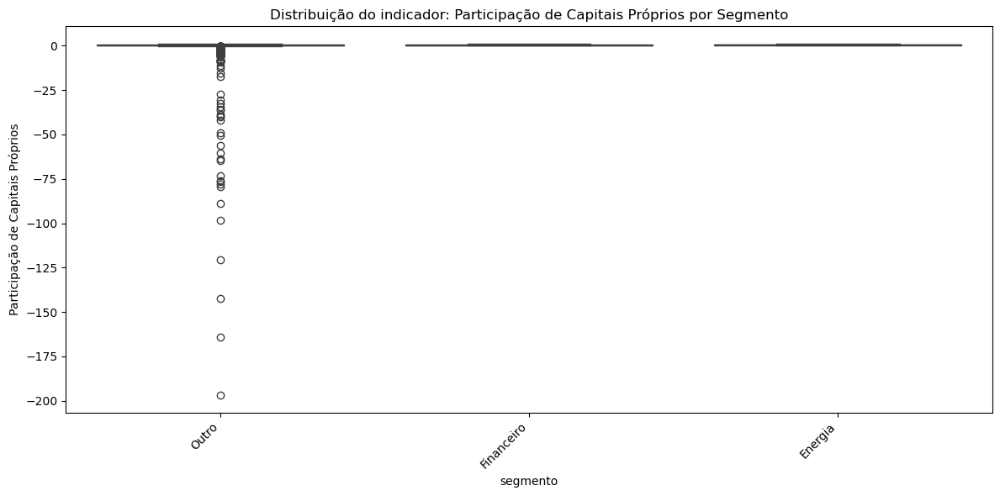

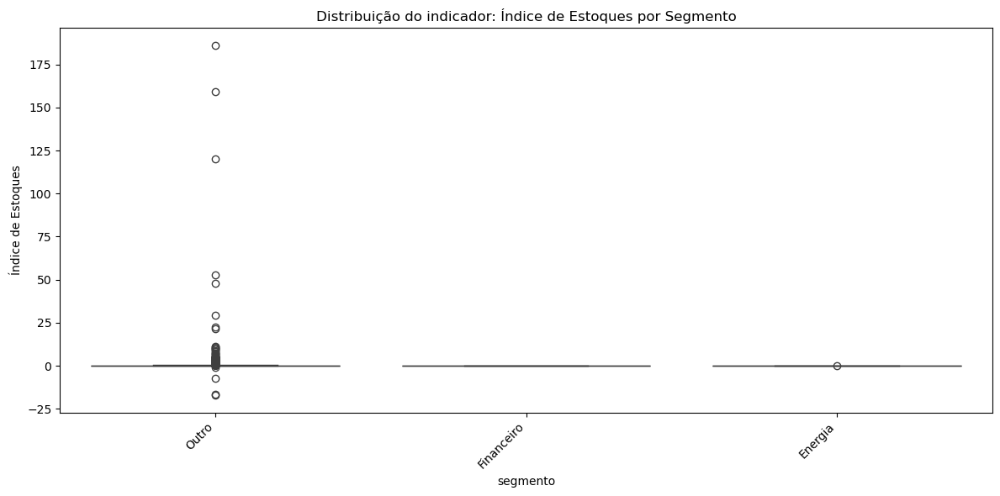

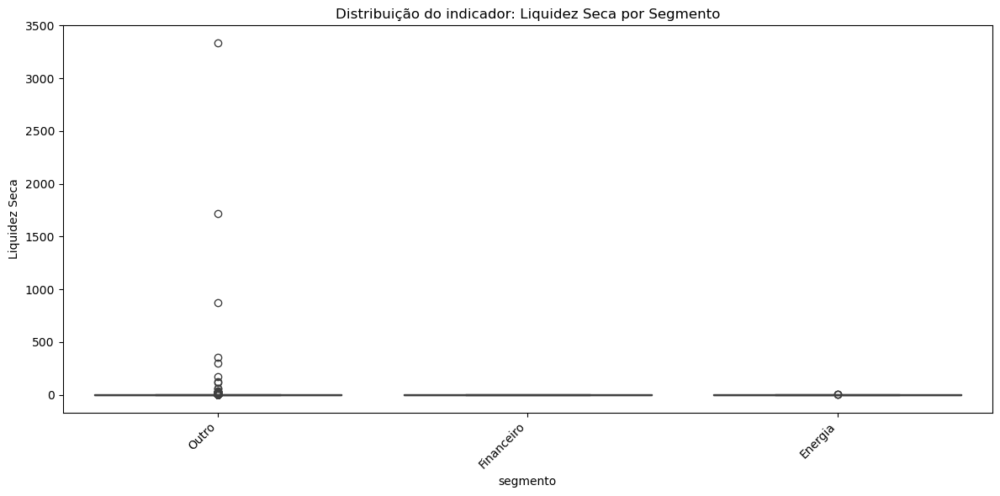


ANÁLISE: Observe quais segmentos apresentam maiores medianas/médias para cada indicador. 
Analise outliers, dispersão e diferenças entre segmentos. Use a tabela acima para justificar seus insights.


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Definição dos indicadores prontos para análise (ajuste a lista caso necessário)
indicadores_analise = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]

# Filtrar somente indicadores que estão nas colunas do DataFrame
indicadores_analise = [ind for ind in indicadores_analise if ind in df.columns]

# 2. Resumo estatístico por segmento
resumo_segmento = df.groupby('segmento')[indicadores_analise].agg(['mean', 'median', 'std', 'count'])
display(resumo_segmento)

# 3. Boxplots de cada indicador por segmento
for ind in indicadores_analise:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='segmento', y=ind, data=df)
    plt.title(f'Distribuição do indicador: {ind} por Segmento')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# 4. Comentário orientativo (modifique conforme análise)
print("\nANÁLISE: Observe quais segmentos apresentam maiores medianas/médias para cada indicador. \n"
      "Analise outliers, dispersão e diferenças entre segmentos. Use a tabela acima para justificar seus insights.")


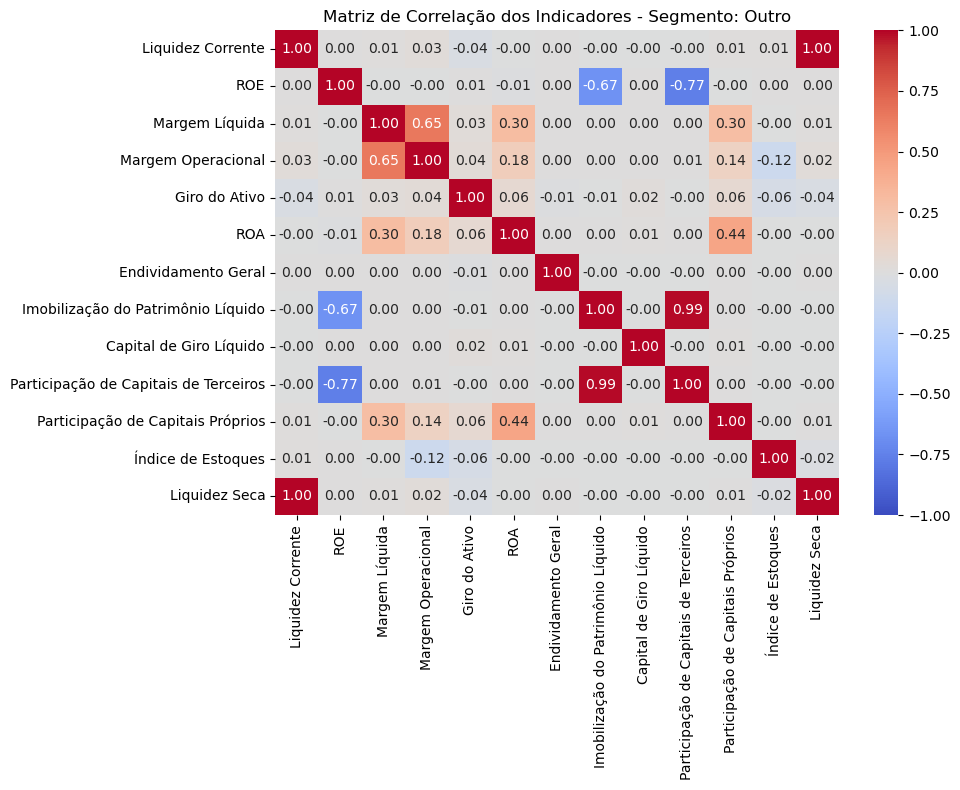

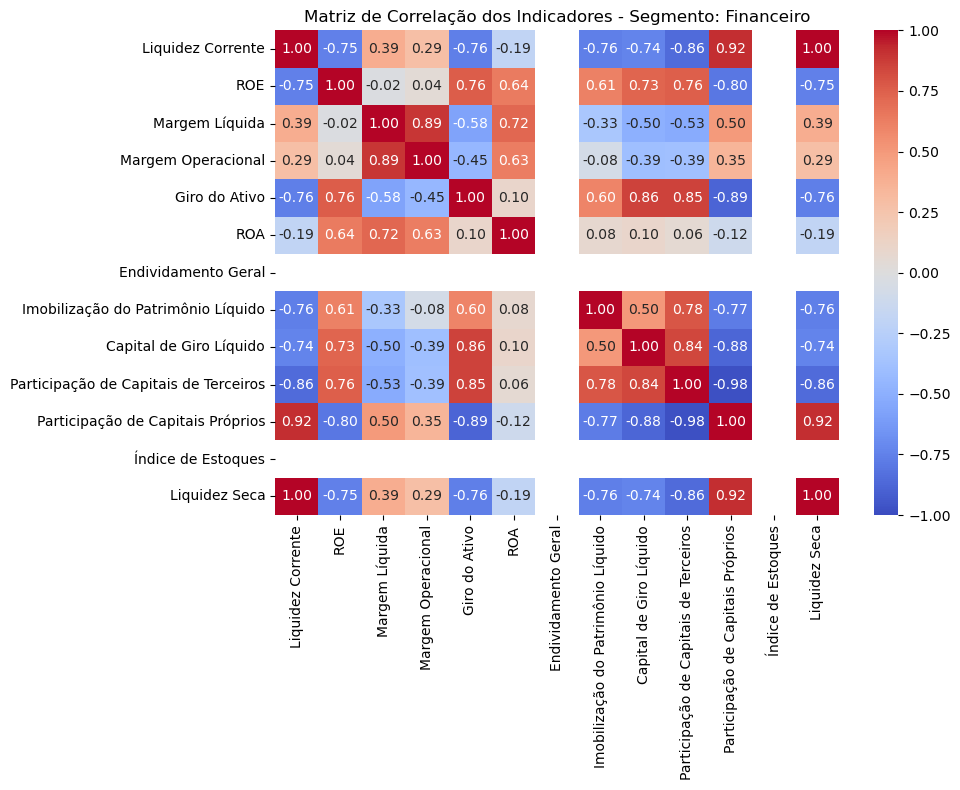

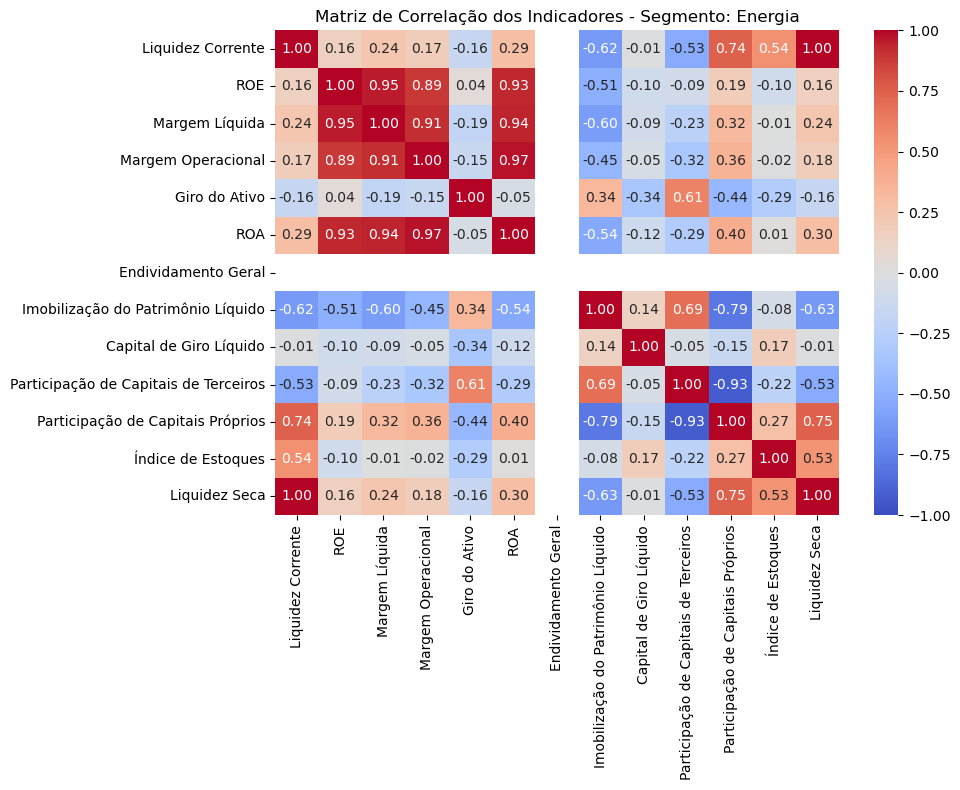

In [20]:
# Análise de Correlação dos Indicadores Financeiros por Segmento

for seg in df['segmento'].dropna().unique():
    subset = df[df['segmento'] == seg]
    if subset[indicadores_analise].dropna().shape[0] > 10:  # Só plota se houver amostras suficientes
        plt.figure(figsize=(10, 8))
        sns.heatmap(subset[indicadores_analise].corr(), annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
        plt.title(f'Matriz de Correlação dos Indicadores - Segmento: {seg}')
        plt.tight_layout()
        plt.show()


In [21]:
import pandas as pd

# 1. Escolha dos indicadores a ranquear (ajuste conforme necessário)
indicadores_ranking = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]
indicadores_ranking = [ind for ind in indicadores_ranking if ind in df.columns]

# 2. Gerar ranking dentro de cada segmento para cada indicador
ranking_resultados = pd.DataFrame()
for indicador in indicadores_ranking:
    for seg in df['segmento'].dropna().unique():
        subset = df[df['segmento'] == seg][['denom_cia', indicador]].copy()
        subset = subset.dropna(subset=[indicador])
        subset['ranking'] = subset[indicador].rank(ascending=False, method='min')
        subset['segmento'] = seg
        subset['indicador'] = indicador
        ranking_resultados = pd.concat([ranking_resultados, subset])

# 3. Exemplo: Visualizar top 5 empresas em cada segmento para ROE
indicador_exemplo = 'ROE'
top5_roe = ranking_resultados[(ranking_resultados['indicador'] == indicador_exemplo) & (ranking_resultados['ranking'] <= 5)]
print("Top 5 empresas por ROE em cada segmento:")
display(top5_roe.sort_values(['segmento', 'ranking']))

# 4. [Opcional] Exportar para Excel
# ranking_resultados.to_excel('ranking_indicadores_por_segmento.xlsx', index=False)


Top 5 empresas por ROE em cada segmento:


,denom_cia,Liquidez Corrente,ranking,segmento,indicador,ROE,Margem Líquida,Margem Operacional,Giro do Ativo,ROA,Endividamento Geral,Imobilização do Patrimônio Líquido,Capital de Giro Líquido,Participação de Capitais de Terceiros,Participação de Capitais Próprios,Índice de Estoques,Liquidez Seca
35,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,NaN,1.0,Energia,ROE,1.223192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,NaN,2.0,Energia,ROE,0.516613,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,CENTRAIS ELET BRAS S.A. - ELETROBRAS,NaN,3.0,Energia,ROE,0.238312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,NaN,4.0,Energia,ROE,0.219045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,NaN,5.0,Energia,ROE,0.212406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
168,PORTO SEGURO S.A.,NaN,1.0,Financeiro,ROE,0.190223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
164,PORTO SEGURO S.A.,NaN,2.0,Financeiro,ROE,0.188267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
167,PORTO SEGURO S.A.,NaN,3.0,Financeiro,ROE,0.185221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
162,PORTO SEGURO S.A.,NaN,4.0,Financeiro,ROE,0.171301,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,PORTO SEGURO S.A.,NaN,5.0,Financeiro,ROE,0.166765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Observações:

O ranking é feito do maior para o menor valor do indicador, para todos os indicadores.

É possível inverter a ordem para indicadores em que valores menores são melhores, se necessário (basta ajustar o parâmetro ascending).

Altere indicador_exemplo para visualizar o ranking de outro indicador.

O dataframe ranking_resultados pode ser facilmente filtrado/exportado para qualquer análise adicional ou apresentação.

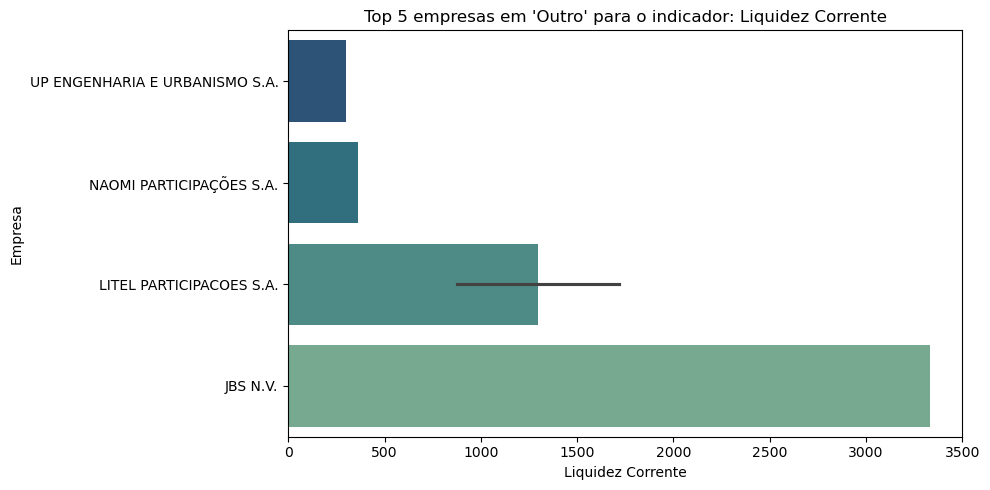

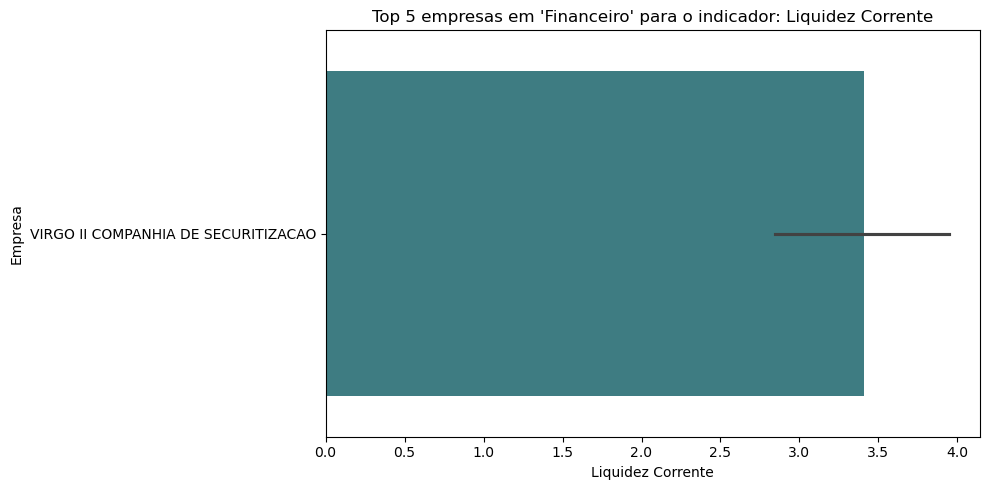

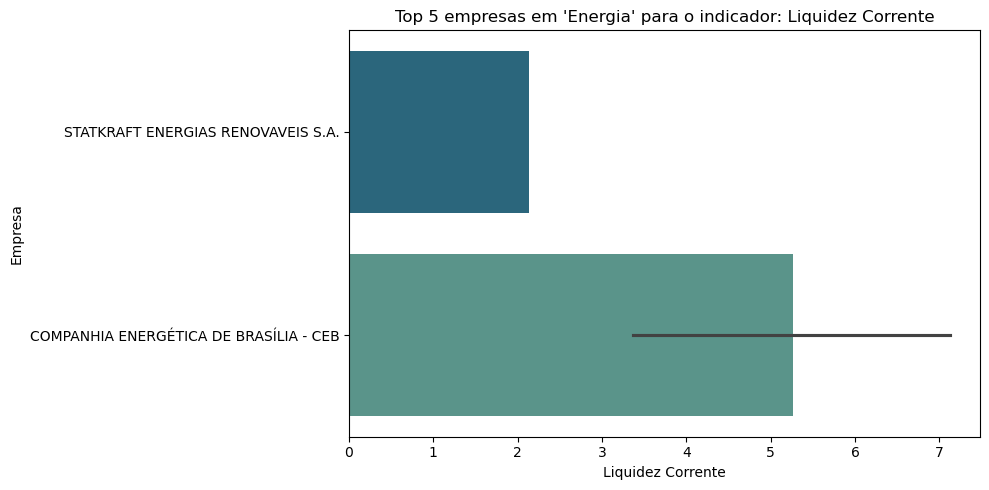

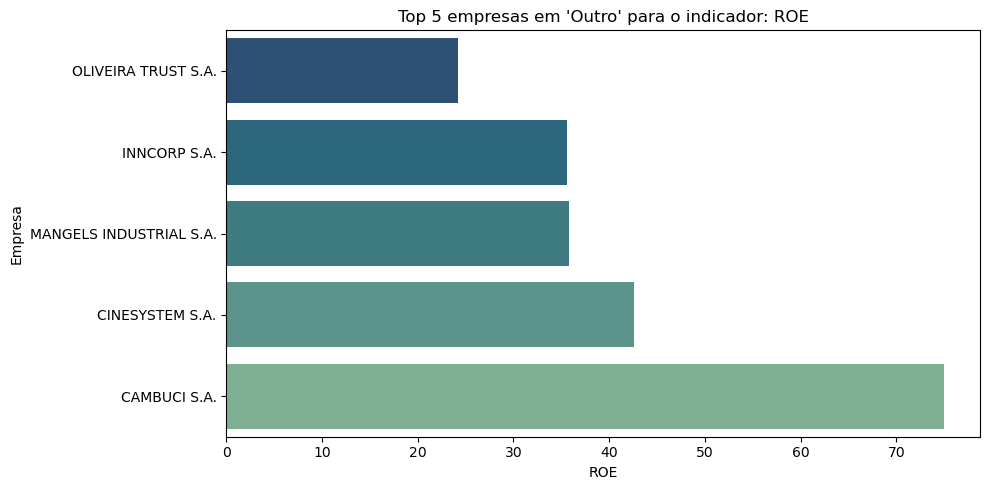

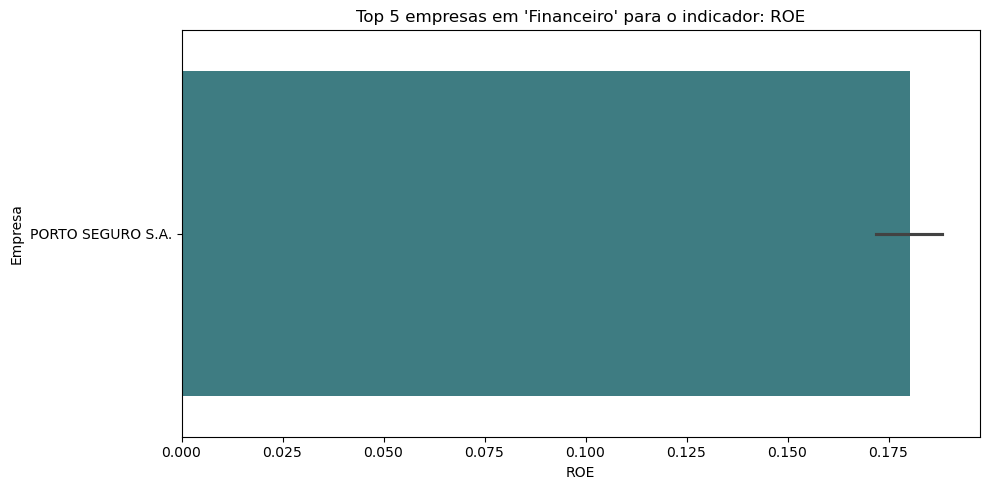

...

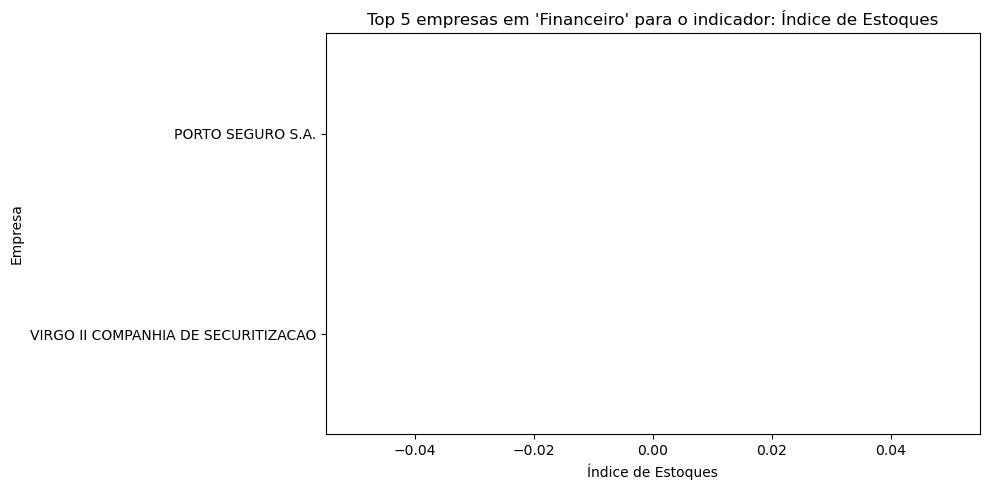

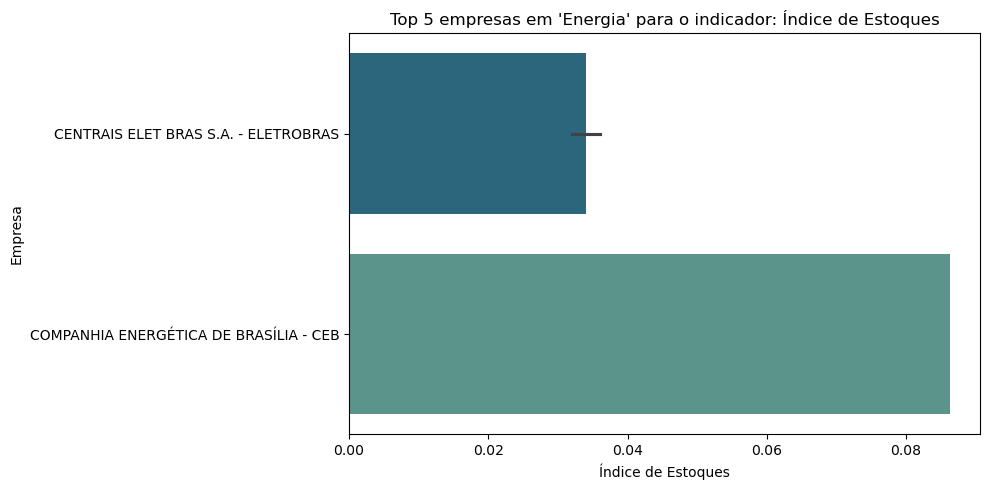

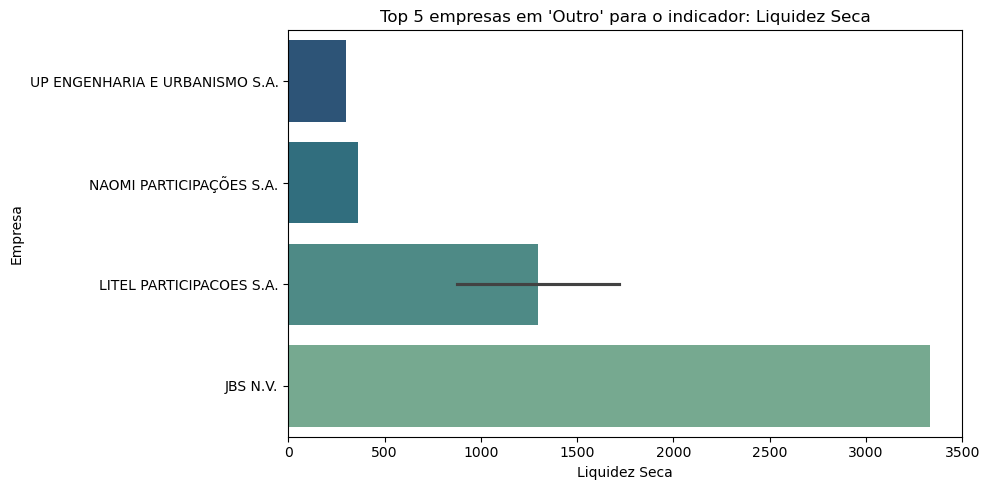

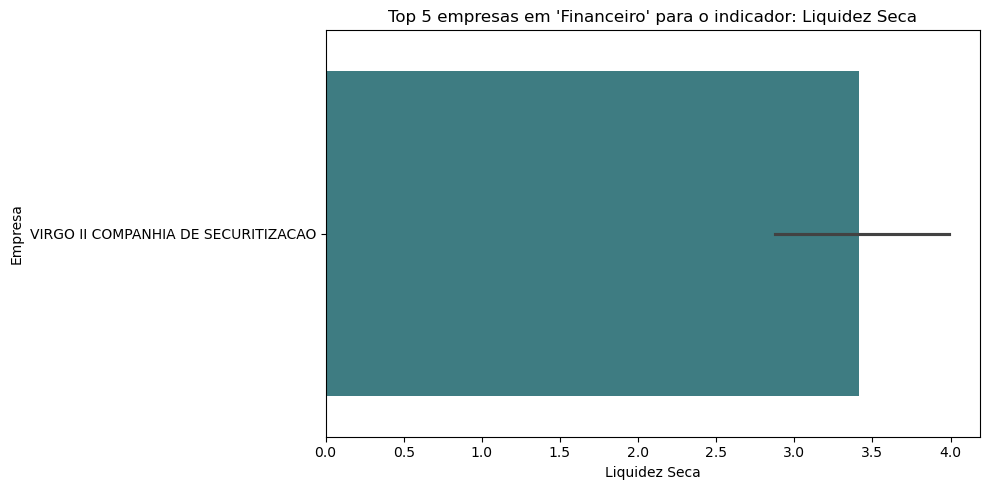

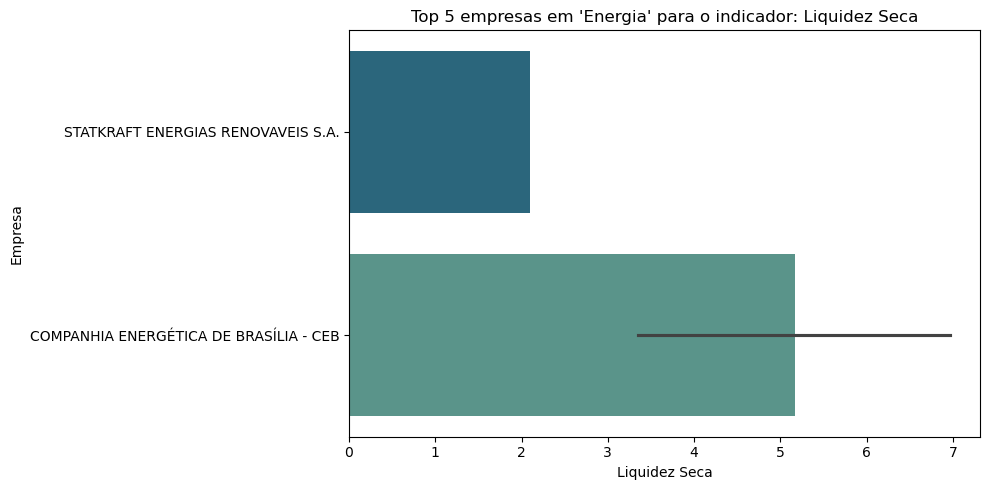

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Parâmetros ajustáveis
top_n = 5
indicadores_ranking = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]
indicadores_ranking = [ind for ind in indicadores_ranking if ind in df.columns]

for indicador in indicadores_ranking:
    for seg in df['segmento'].dropna().unique():
        subset = df[df['segmento'] == seg][['denom_cia', indicador]].copy()
        subset = subset.dropna(subset=[indicador])
        if subset.shape[0] == 0:
            continue
        subset = subset.sort_values(indicador, ascending=False)
        subset['ranking'] = range(1, len(subset)+1)
        subset_top = subset.head(top_n)

        plt.figure(figsize=(10, 5))
        sns.barplot(
            y='denom_cia', x=indicador,
            data=subset_top,
            hue='denom_cia',  # <--- Adicionado
            palette='crest',
            legend=False      # <--- Adicionado
        )
        plt.title(f"Top {top_n} empresas em '{seg}' para o indicador: {indicador}")
        plt.xlabel(indicador)
        plt.ylabel('Empresa')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show()


Detecção e Análise de Outliers
Objetivo:
Identificar empresas ou segmentos que apresentam indicadores fora do padrão (“outliers”).

Compreender o impacto desses outliers sobre médias, medianas e possíveis distorções setoriais.

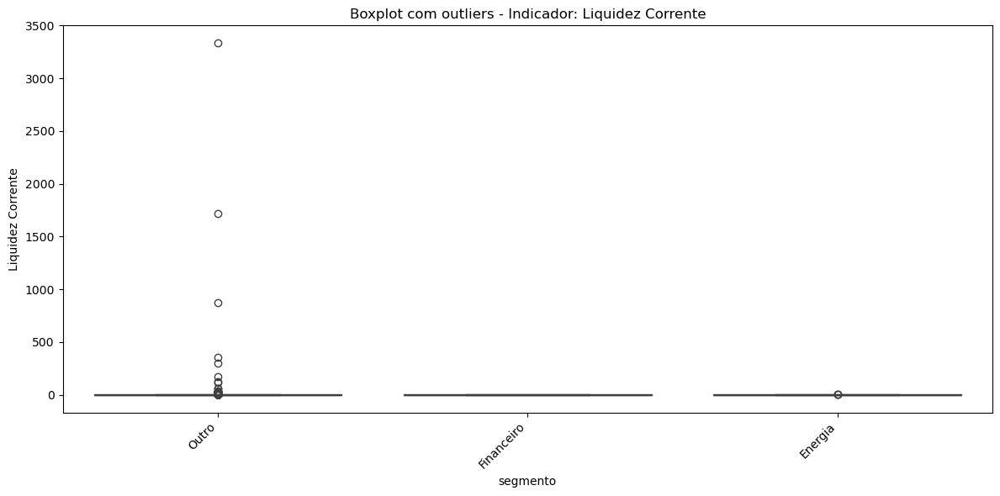


Indicador 'Liquidez Corrente' - Segmento 'Outro':
  Outliers detectados: 266


,denom_cia,Liquidez Corrente
40,TELEC BRASILEIRAS S.A. TELEBRAS,4.541143
55,LITEL PARTICIPACOES S.A.,876.697581
56,LITEL PARTICIPACOES S.A.,27.917829
58,LITEL PARTICIPACOES S.A.,1718.814706
111,BELAPART SA,169.528736
...,...,...
3979,REAG INVESTIMENTOS S.A.,17.704373
4045,JBS N.V.,3334.000000
4046,EPR INFRAESTRUTURA PR S.A.,57.370248
4057,ENGELHART CTP (BRASIL) S.A.,5.576346



Indicador 'Liquidez Corrente' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Liquidez Corrente' - Segmento 'Energia':
  Outliers detectados: 3


,denom_cia,Liquidez Corrente
36,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,4.620395
37,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,6.965676
38,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,7.281926


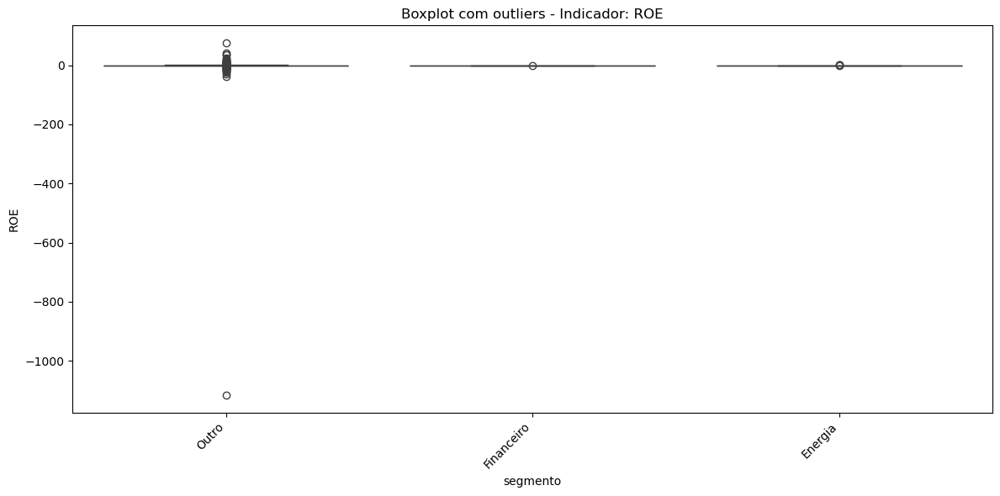


Indicador 'ROE' - Segmento 'Outro':
  Outliers detectados: 582


,denom_cia,ROE
40,TELEC BRASILEIRAS S.A. TELEBRAS,0.541654
55,LITEL PARTICIPACOES S.A.,-0.333930
69,AMERICANAS S.A.,1.666197
102,GAFISA S.A.,-0.601789
103,GAFISA S.A.,-1.119479
...,...,...
4047,EPR INFRAESTRUTURA PR S.A.,0.607359
4052,DESCARBONIZE SOLUÇÕES S.A.,-0.925937
4056,"BRAZIL TOWER, CESSÃO DE INFRA-ESTRUTURAS S.A",-0.523899
4060,TERP GLBL BRASIL I PARTICIPAÇÕES S.A.,5.532442



Indicador 'ROE' - Segmento 'Financeiro':
  Outliers detectados: 1


,denom_cia,ROE
156,VIRGO II COMPANHIA DE SECURITIZACAO,-0.048391



Indicador 'ROE' - Segmento 'Energia':
  Outliers detectados: 3


,denom_cia,ROE
19,CENTRAIS ELET BRAS S.A. - ELETROBRAS,-0.358264
34,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.516613
35,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,1.223192


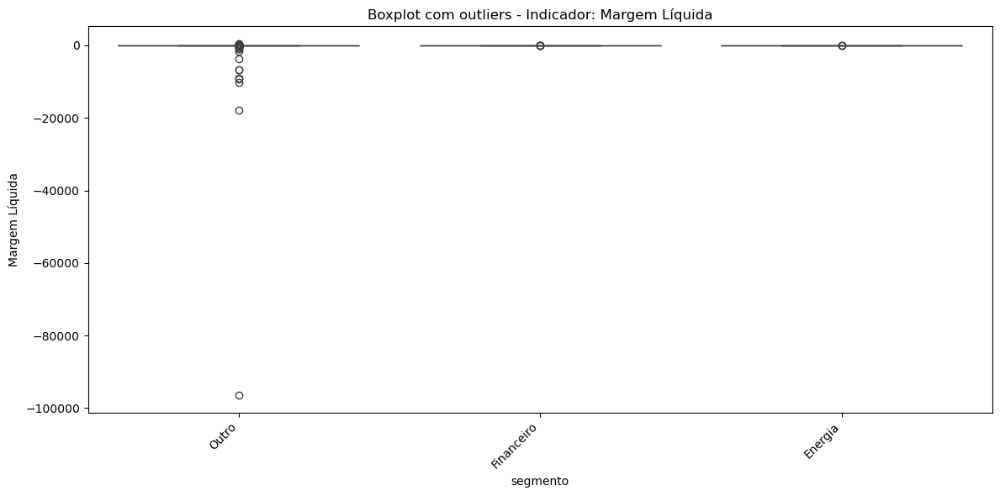


Indicador 'Margem Líquida' - Segmento 'Outro':
  Outliers detectados: 708


,denom_cia,Margem Líquida
40,TELEC BRASILEIRAS S.A. TELEBRAS,-4.832536
41,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-2.747322
43,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-1.591325
44,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-1.402043
45,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-1.824099
...,...,...
4032,HÉLIO VALGAS SOLAR PARTICIPAÇÕES S.A.,-0.295762
4033,HÉLIO VALGAS SOLAR PARTICIPAÇÕES S.A.,2.115184
4060,TERP GLBL BRASIL I PARTICIPAÇÕES S.A.,0.444694
4062,TURBI COMPARTILHAMENTO DE VEÍCULOS S.A.,-0.357816



Indicador 'Margem Líquida' - Segmento 'Financeiro':
  Outliers detectados: 5


,denom_cia,Margem Líquida
152,VIRGO II COMPANHIA DE SECURITIZACAO,0.343823
153,VIRGO II COMPANHIA DE SECURITIZACAO,0.341968
154,VIRGO II COMPANHIA DE SECURITIZACAO,0.358232
156,VIRGO II COMPANHIA DE SECURITIZACAO,-0.128301
157,VIRGO II COMPANHIA DE SECURITIZACAO,0.451226



Indicador 'Margem Líquida' - Segmento 'Energia':
  Outliers detectados: 3


,denom_cia,Margem Líquida
19,CENTRAIS ELET BRAS S.A. - ELETROBRAS,-0.458858
34,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,1.823739
35,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,3.772813


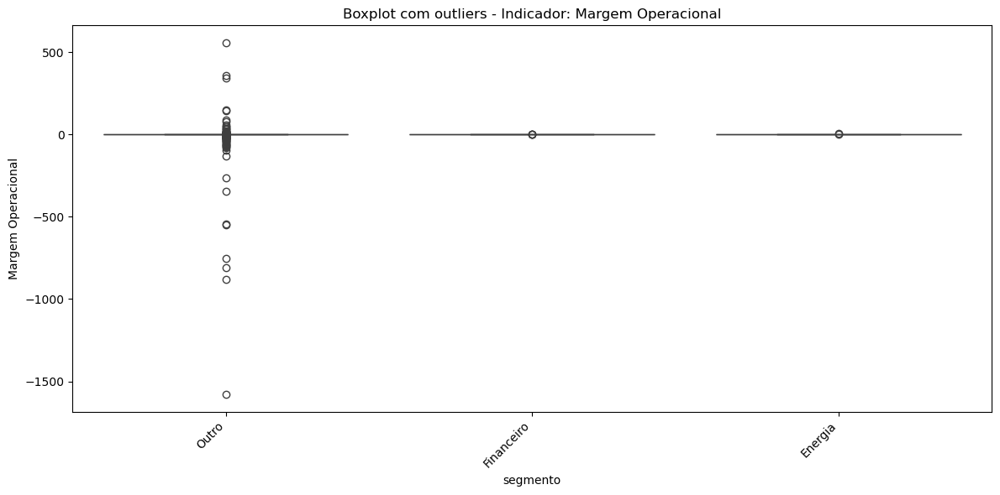


Indicador 'Margem Operacional' - Segmento 'Outro':
  Outliers detectados: 640


,denom_cia,Margem Operacional
39,TELEC BRASILEIRAS S.A. TELEBRAS,-3.713053
40,TELEC BRASILEIRAS S.A. TELEBRAS,-3.459789
41,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-2.679921
43,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-1.467073
44,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-0.970975
...,...,...
4024,CONCESSIONÁRIA DA LINHA 4 DO METRÔ DE SÃO PAUL...,0.754114
4025,CONCESSIONÁRIA DA LINHA 4 DO METRÔ DE SÃO PAUL...,0.610638
4029,BRASIL BIOFUELS S.A.,-0.345046
4056,"BRAZIL TOWER, CESSÃO DE INFRA-ESTRUTURAS S.A",0.685240



Indicador 'Margem Operacional' - Segmento 'Financeiro':
  Outliers detectados: 4


,denom_cia,Margem Operacional
153,VIRGO II COMPANHIA DE SECURITIZACAO,0.278565
154,VIRGO II COMPANHIA DE SECURITIZACAO,0.347945
156,VIRGO II COMPANHIA DE SECURITIZACAO,-0.198919
157,VIRGO II COMPANHIA DE SECURITIZACAO,0.791249



Indicador 'Margem Operacional' - Segmento 'Energia':
  Outliers detectados: 2


,denom_cia,Margem Operacional
19,CENTRAIS ELET BRAS S.A. - ELETROBRAS,-0.384933
35,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,5.477327


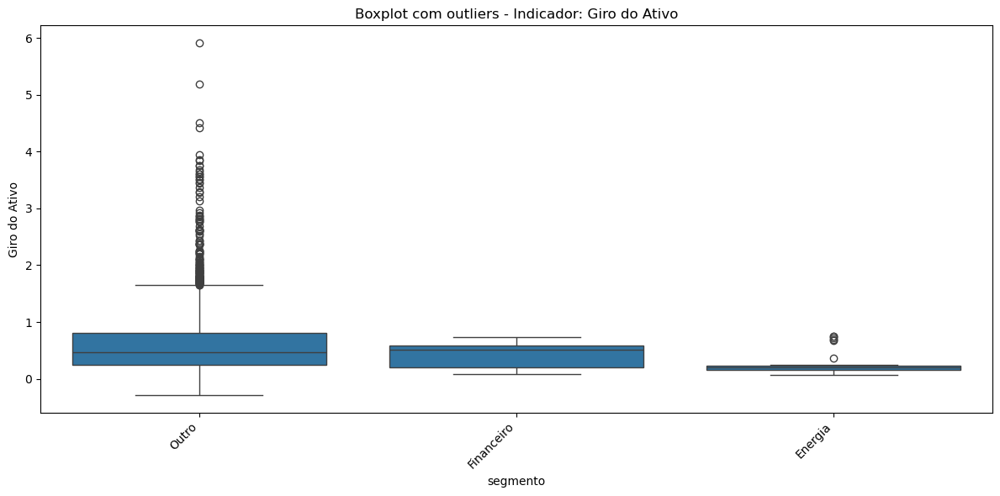


Indicador 'Giro do Ativo' - Segmento 'Outro':
  Outliers detectados: 143


,denom_cia,Giro do Ativo
199,PADTEC HOLDING S.A.,2.105251
319,JBS S.A.,1.657144
324,JBS S.A.,1.693289
325,JBS S.A.,1.801213
326,JBS S.A.,1.764968
...,...,...
3985,TECIDOS E ARMARINHOS MIGUEL BARTOLOMEU S.A.,1.716916
4002,AUTOMOB S.A.,1.865500
4042,PORTO SAÚDE PARTICIPAÇÕES S.A.,1.749667
4043,PORTO SAÚDE PARTICIPAÇÕES S.A.,1.969087



Indicador 'Giro do Ativo' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Giro do Ativo' - Segmento 'Energia':
  Outliers detectados: 6


,denom_cia,Giro do Ativo
20,CENTRAIS ELET BRAS S.A. - ELETROBRAS,0.356299
29,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.725680
30,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.669821
31,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.747985
32,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.692260
33,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.745721


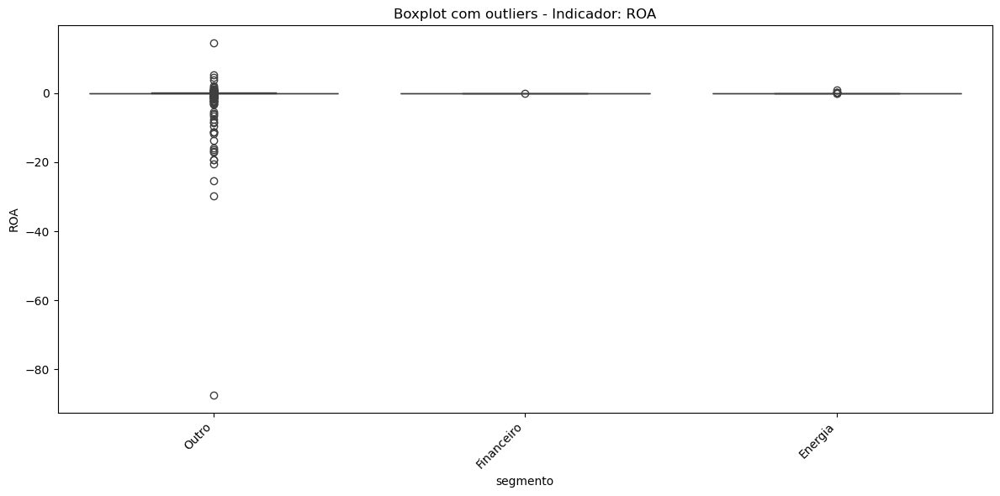


Indicador 'ROA' - Segmento 'Outro':
  Outliers detectados: 561


,denom_cia,ROA
41,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-1.231505
43,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-0.814123
44,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-0.696843
45,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-0.789250
55,LITEL PARTICIPACOES S.A.,-0.286988
...,...,...
4033,HÉLIO VALGAS SOLAR PARTICIPAÇÕES S.A.,0.183223
4045,JBS N.V.,0.204559
4047,EPR INFRAESTRUTURA PR S.A.,0.278296
4062,TURBI COMPARTILHAMENTO DE VEÍCULOS S.A.,-0.150880



Indicador 'ROA' - Segmento 'Financeiro':
  Outliers detectados: 1


,denom_cia,ROA
156,VIRGO II COMPANHIA DE SECURITIZACAO,-0.037287



Indicador 'ROA' - Segmento 'Energia':
  Outliers detectados: 7


,denom_cia,ROA
19,CENTRAIS ELET BRAS S.A. - ELETROBRAS,-0.099927
34,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.121388
35,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.854740
36,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.187050
37,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.165993
38,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.151907
46,STATKRAFT ENERGIAS RENOVAVEIS S.A.,-0.042028


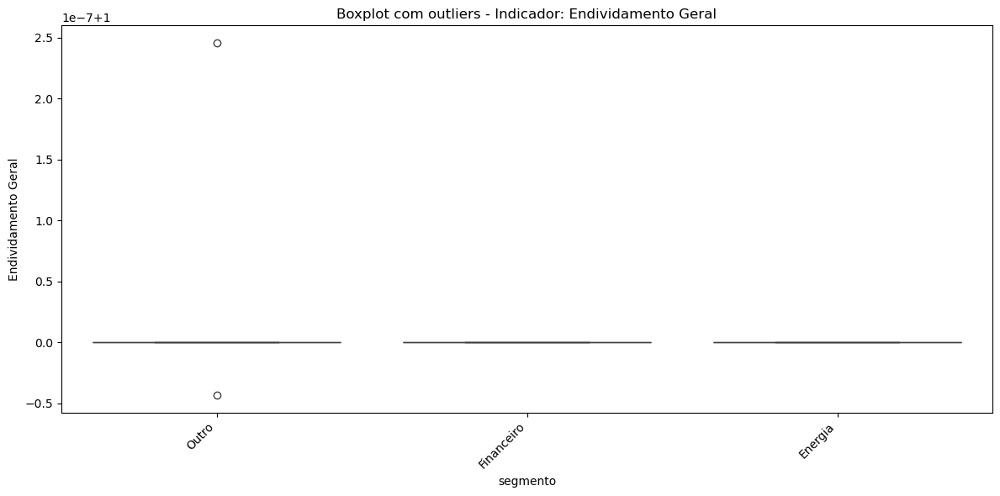


Indicador 'Endividamento Geral' - Segmento 'Outro':
  Outliers detectados: 2


,denom_cia,Endividamento Geral
913,SYN PROP & TECH S.A.,1.0
3701,BANCO MODAL S.A.,1.0



Indicador 'Endividamento Geral' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Endividamento Geral' - Segmento 'Energia':
  Outliers detectados: 0


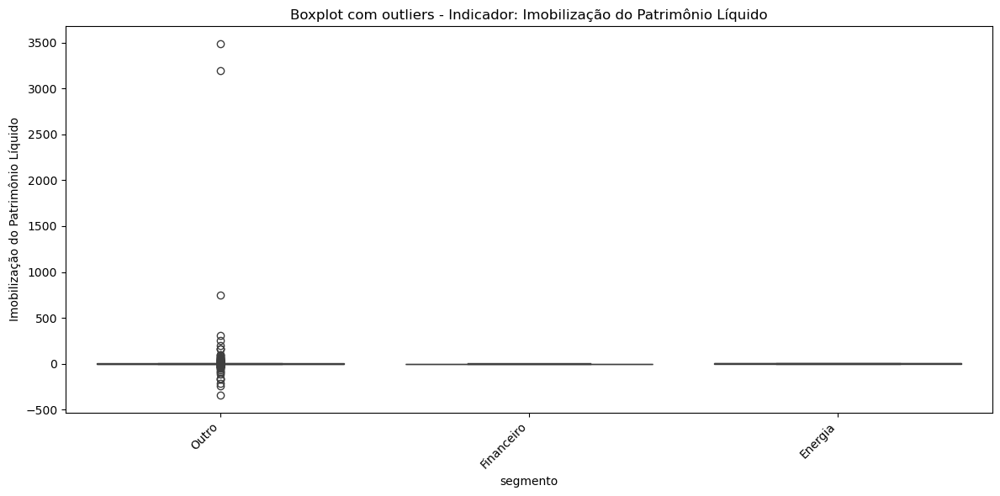


Indicador 'Imobilização do Patrimônio Líquido' - Segmento 'Outro':
  Outliers detectados: 428


,denom_cia,Imobilização do Patrimônio Líquido
39,TELEC BRASILEIRAS S.A. TELEBRAS,-9.649288
40,TELEC BRASILEIRAS S.A. TELEBRAS,-5.233346
126,LIGHT ENERGIA S.A.,5.297658
127,LIGHT ENERGIA S.A.,6.060410
128,LIGHT ENERGIA S.A.,5.454768
...,...,...
4037,BRASIL TECNOLOGIA E PARTICIPAÇÕES S.A.,5.104944
4052,DESCARBONIZE SOLUÇÕES S.A.,8.702422
4056,"BRAZIL TOWER, CESSÃO DE INFRA-ESTRUTURAS S.A",21.176348
4060,TERP GLBL BRASIL I PARTICIPAÇÕES S.A.,30.704540



Indicador 'Imobilização do Patrimônio Líquido' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Imobilização do Patrimônio Líquido' - Segmento 'Energia':
  Outliers detectados: 0


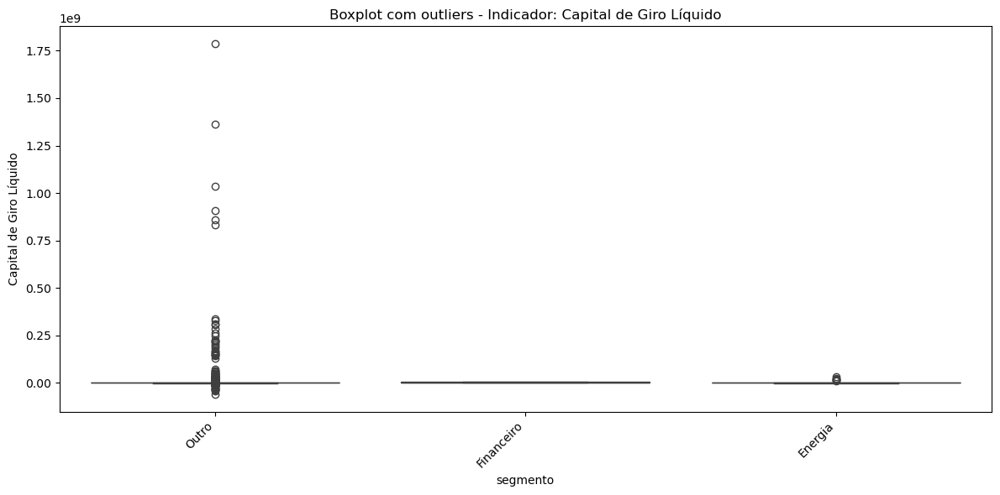


Indicador 'Capital de Giro Líquido' - Segmento 'Outro':
  Outliers detectados: 611


,denom_cia,Capital de Giro Líquido
41,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-7031194.0
42,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-6948636.0
43,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-6954727.0
44,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-7020841.0
45,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-7027763.0
...,...,...
4013,CENTRAIS ELÉTRICAS DO NORTE DO BRASIL S.A.,4305247.0
4030,EQUIPAV SANEAMENTO S.A.,3726298.0
4031,EQUIPAV SANEAMENTO S.A.,4958975.0
4054,BTG PACTUAL COMMODITIES SERTRADING S.A.,4336007.0



Indicador 'Capital de Giro Líquido' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Capital de Giro Líquido' - Segmento 'Energia':
  Outliers detectados: 7


,denom_cia,Capital de Giro Líquido
22,CENTRAIS ELET BRAS S.A. - ELETROBRAS,10321442.0
23,CENTRAIS ELET BRAS S.A. - ELETROBRAS,15080406.0
24,CENTRAIS ELET BRAS S.A. - ELETROBRAS,18791671.0
25,CENTRAIS ELET BRAS S.A. - ELETROBRAS,15861624.0
26,CENTRAIS ELET BRAS S.A. - ELETROBRAS,23182251.0
27,CENTRAIS ELET BRAS S.A. - ELETROBRAS,20737340.0
28,CENTRAIS ELET BRAS S.A. - ELETROBRAS,32820732.0


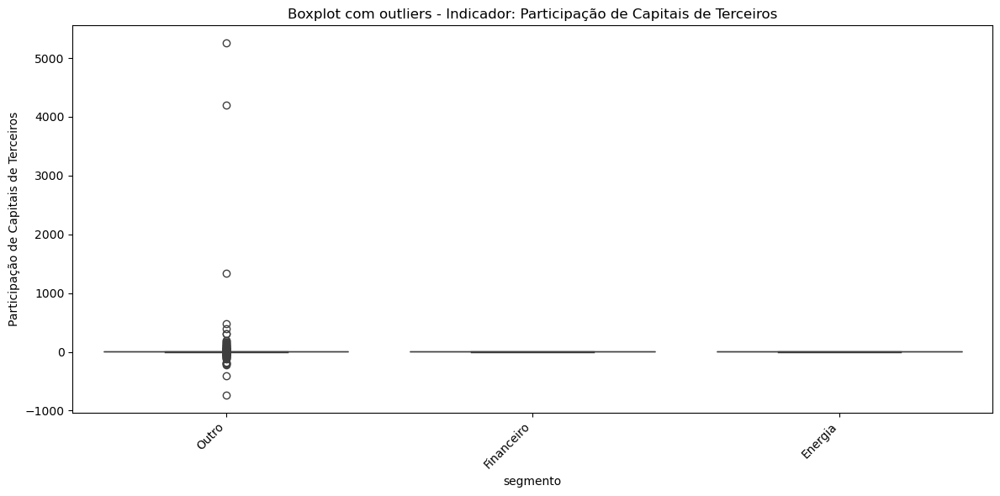


Indicador 'Participação de Capitais de Terceiros' - Segmento 'Outro':
  Outliers detectados: 534


,denom_cia,Participação de Capitais de Terceiros
39,TELEC BRASILEIRAS S.A. TELEBRAS,-11.677420
40,TELEC BRASILEIRAS S.A. TELEBRAS,-6.118596
87,CIELO S.A. - INSTITUIÇÃO DE PAGAMENTO,7.601714
88,CIELO S.A. - INSTITUIÇÃO DE PAGAMENTO,7.945765
89,CIELO S.A. - INSTITUIÇÃO DE PAGAMENTO,7.192744
...,...,...
3984,TECIDOS E ARMARINHOS MIGUEL BARTOLOMEU S.A.,9.609119
4052,DESCARBONIZE SOLUÇÕES S.A.,11.485255
4056,"BRAZIL TOWER, CESSÃO DE INFRA-ESTRUTURAS S.A",22.540080
4060,TERP GLBL BRASIL I PARTICIPAÇÕES S.A.,34.808310



Indicador 'Participação de Capitais de Terceiros' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Participação de Capitais de Terceiros' - Segmento 'Energia':
  Outliers detectados: 0


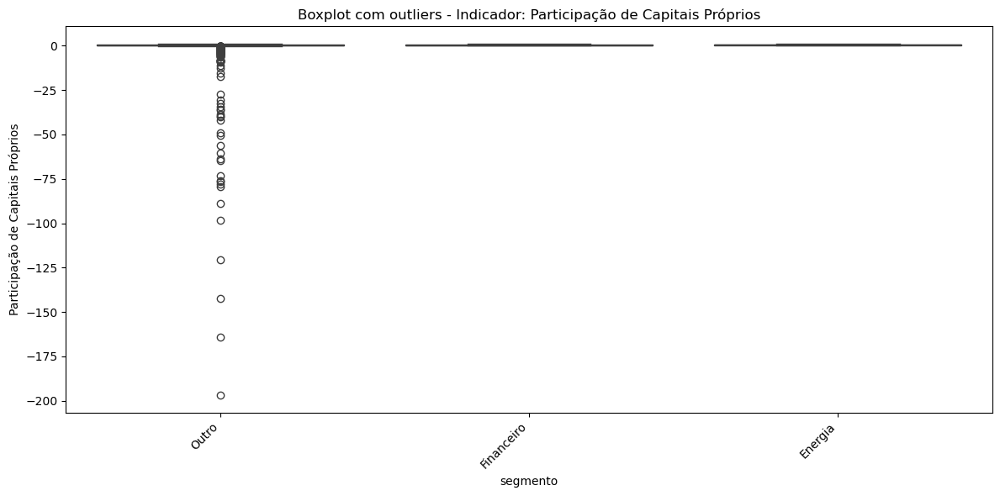


Indicador 'Participação de Capitais Próprios' - Segmento 'Outro':
  Outliers detectados: 312


,denom_cia,Participação de Capitais Próprios
41,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-63.631351
42,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-73.353364
43,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-76.745854
44,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-77.942123
45,KOSMOS COMÉRCIO DE VESTUÁRIO S/A,-76.188327
...,...,...
3376,AGROGALAXY PARTICIPAÇÕES S.A.,-0.479734
3377,COMPASS GÁS E ENERGIA S.A.,-1.610778
3545,UNIGEL PARTICIPAÇÕES S.A.,-0.630784
3734,RIO ALTO ENERGIAS RENOVÁVEIS S.A.,-0.361640



Indicador 'Participação de Capitais Próprios' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Participação de Capitais Próprios' - Segmento 'Energia':
  Outliers detectados: 0


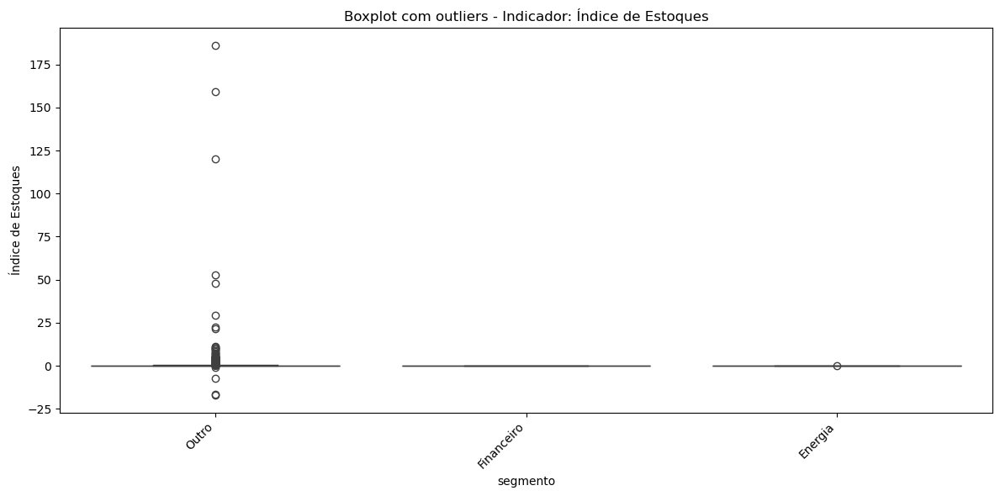


Indicador 'Índice de Estoques' - Segmento 'Outro':
  Outliers detectados: 321


,denom_cia,Índice de Estoques
101,GAFISA S.A.,0.819580
102,GAFISA S.A.,1.226085
103,GAFISA S.A.,1.449007
104,GAFISA S.A.,0.926702
105,GAFISA S.A.,1.964366
...,...,...
3896,HMOBI PARTICIPAÇÕES S.A.,0.528487
3938,CONSERVAS ODERICH S.A.,0.494494
3940,CONSERVAS ODERICH S.A.,0.493396
3941,CONSERVAS ODERICH S.A.,0.539846



Indicador 'Índice de Estoques' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Índice de Estoques' - Segmento 'Energia':
  Outliers detectados: 1


,denom_cia,Índice de Estoques
38,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,0.086295


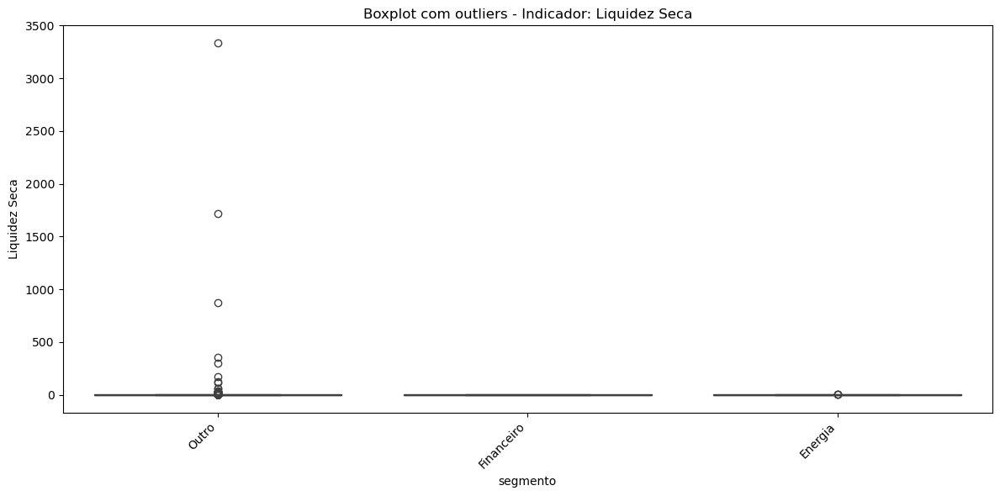


Indicador 'Liquidez Seca' - Segmento 'Outro':
  Outliers detectados: 272


,denom_cia,Liquidez Seca
40,TELEC BRASILEIRAS S.A. TELEBRAS,4.541143
55,LITEL PARTICIPACOES S.A.,876.697581
56,LITEL PARTICIPACOES S.A.,27.917829
58,LITEL PARTICIPACOES S.A.,1718.814706
111,BELAPART SA,169.528736
...,...,...
3979,REAG INVESTIMENTOS S.A.,17.704373
4045,JBS N.V.,3334.000000
4046,EPR INFRAESTRUTURA PR S.A.,57.370248
4057,ENGELHART CTP (BRASIL) S.A.,5.132846



Indicador 'Liquidez Seca' - Segmento 'Financeiro':
  Outliers detectados: 0

Indicador 'Liquidez Seca' - Segmento 'Energia':
  Outliers detectados: 3


,denom_cia,Liquidez Seca
36,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,4.604532
37,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,6.910325
38,COMPANHIA ENERGÉTICA DE BRASÍLIA - CEB,7.019745


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Você pode ajustar este bloco para cada indicador de interesse
for indicador in indicadores_analise:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='segmento', y=indicador, data=df, showfliers=True)
    plt.title(f"Boxplot com outliers - Indicador: {indicador}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Identificação programática de outliers (Tukey/IQR)
    for seg in df['segmento'].dropna().unique():
        valores = df.loc[df['segmento'] == seg, indicador].dropna()
        if len(valores) < 5:
            continue
        Q1 = valores.quantile(0.25)
        Q3 = valores.quantile(0.75)
        IQR = Q3 - Q1
        lim_inf = Q1 - 1.5 * IQR
        lim_sup = Q3 + 1.5 * IQR
        outliers = df[(df['segmento'] == seg) & ((df[indicador] < lim_inf) | (df[indicador] > lim_sup))]
        print(f"\nIndicador '{indicador}' - Segmento '{seg}':")
        print(f"  Outliers detectados: {outliers.shape[0]}")
        if not outliers.empty:
            display(outliers[['denom_cia', indicador]])


In [26]:
print("Colunas do DataFrame:", df.columns.tolist())
print("\nExemplo dos valores na coluna 'dt_refer':")
print(df['dt_refer'].head())

# Conferindo tipo de dado
print("\nTipo da coluna 'dt_refer':", df['dt_refer'].dtype)

# Se não for datetime, converter:
df['dt_refer'] = pd.to_datetime(df['dt_refer'], errors='coerce')

# Ano e trimestre (opcional)
df['ano'] = df['dt_refer'].dt.year
df['trimestre'] = df['dt_refer'].dt.quarter

print("\nAmostra das novas colunas de ano e trimestre:")
print(df[['dt_refer', 'ano', 'trimestre']].head())


Colunas do DataFrame: ['unnamed:_0', 'unnamed:_1', 'dt_refer', 'denom_cia', 'cd_cvm', 'recuperacao', '1::ativo_total', '2::passivo_total', '6.01::caixa_líquido_atividades_operacionais', '6.01.01::caixa_gerado_nas_operações', '6.01.02::variações_nos_ativos_e_passivos', '6.01.03::outros', '6.02::caixa_líquido_atividades_de_investimento', '6.03::caixa_líquido_atividades_de_financiamento', '6.04::variação_cambial_s/_caixa_e_equivalentes', '6.05::aumento_(redução)_de_caixa_e_equivalentes', '6.05.01::saldo_inicial_de_caixa_e_equivalentes', '6.05.02::saldo_final_de_caixa_e_equivalentes', '5.01::saldos_iniciais', '5.02::ajustes_de_exercícios_anteriores', '5.03::saldos_iniciais_ajustados', '5.04::transações_de_capital_com_os_sócios', '5.04.01::aumentos_de_capital', '5.04.02::gastos_com_emissão_de_ações', '5.04.03::opções_outorgadas_reconhecidas', '5.04.04::ações_em_tesouraria_adquiridas', '5.04.05::ações_em_tesouraria_vendidas', '5.04.06::dividendos', '5.04.07::juros_sobre_capital_próprio', '5.

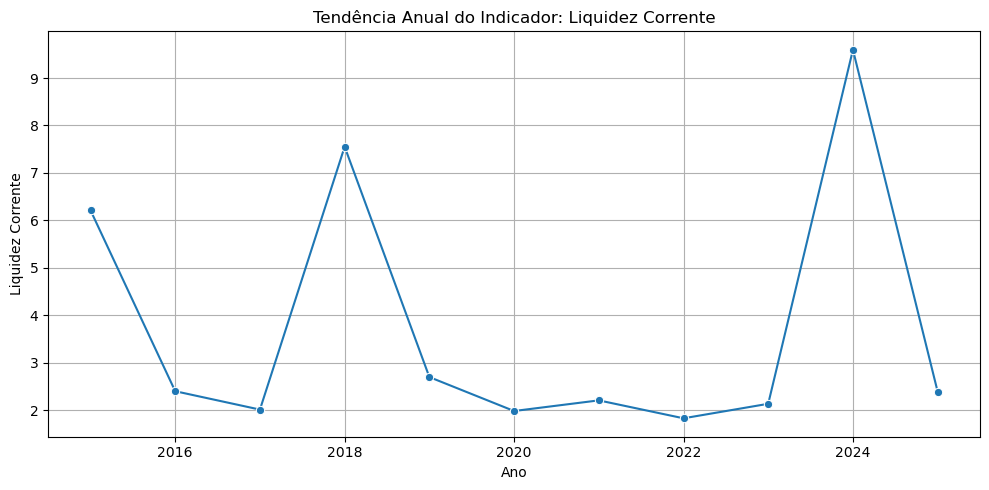

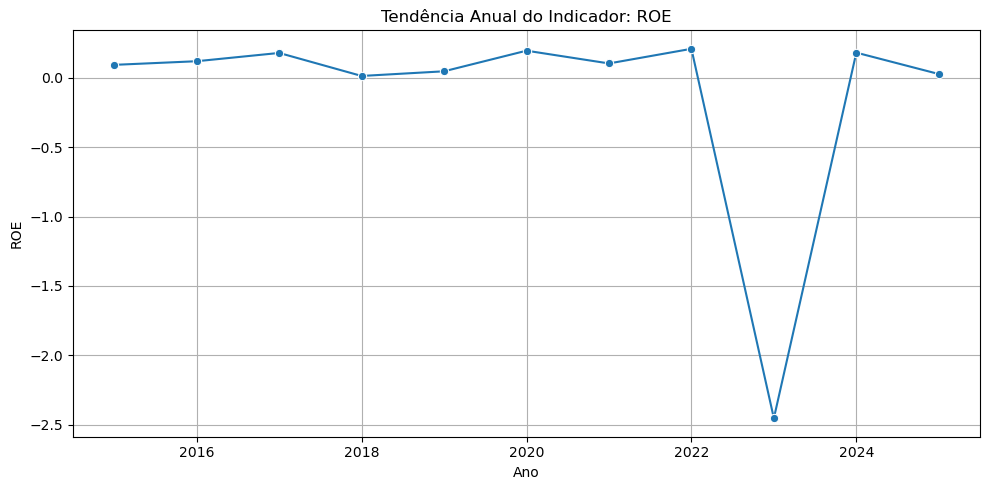

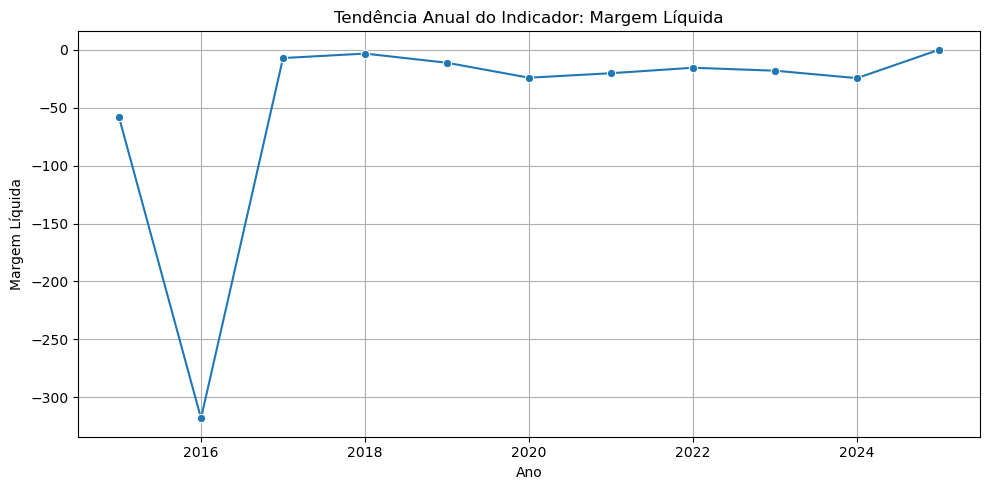

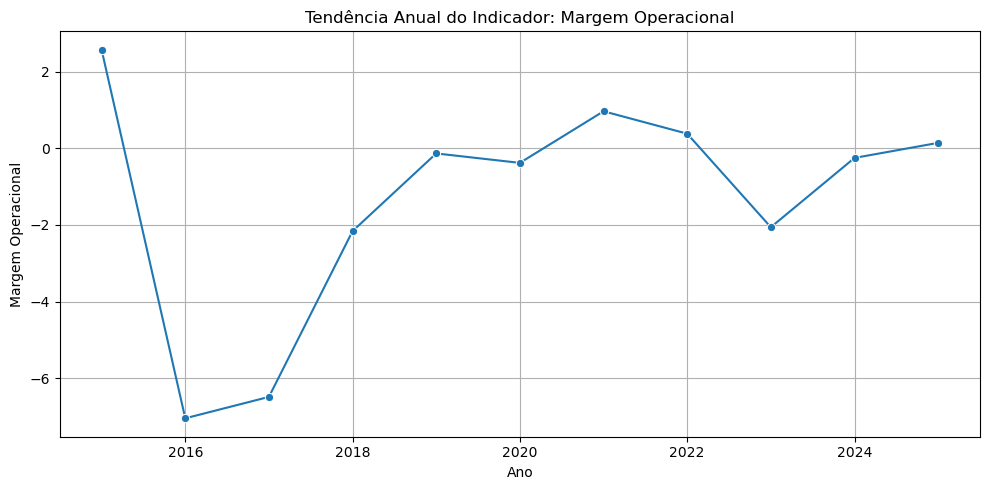

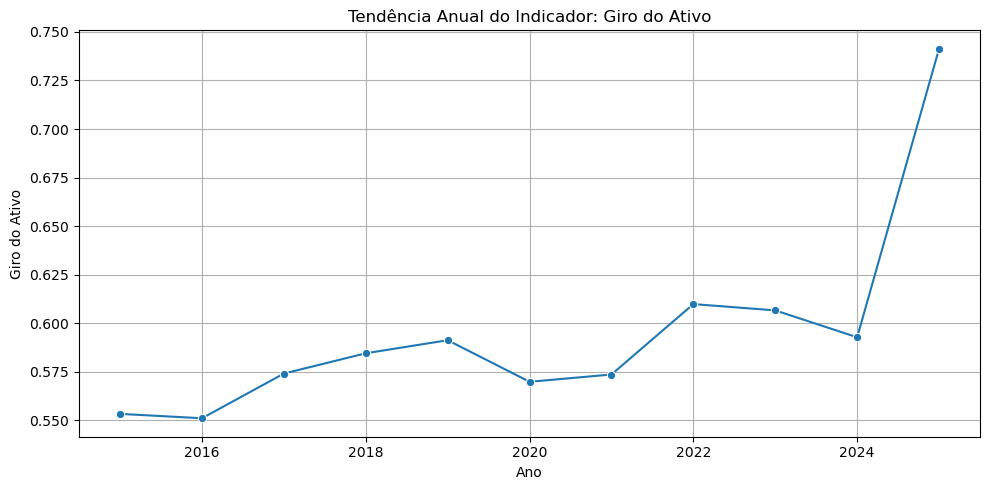

...

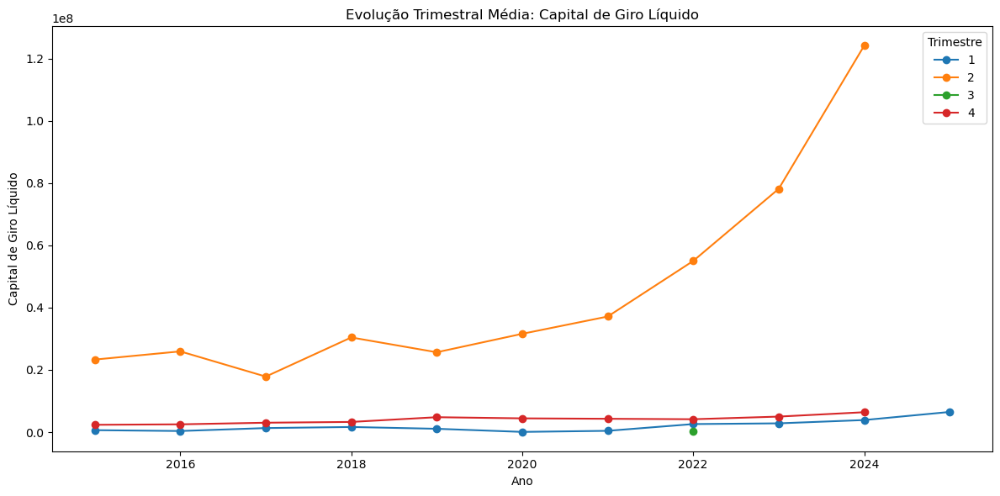

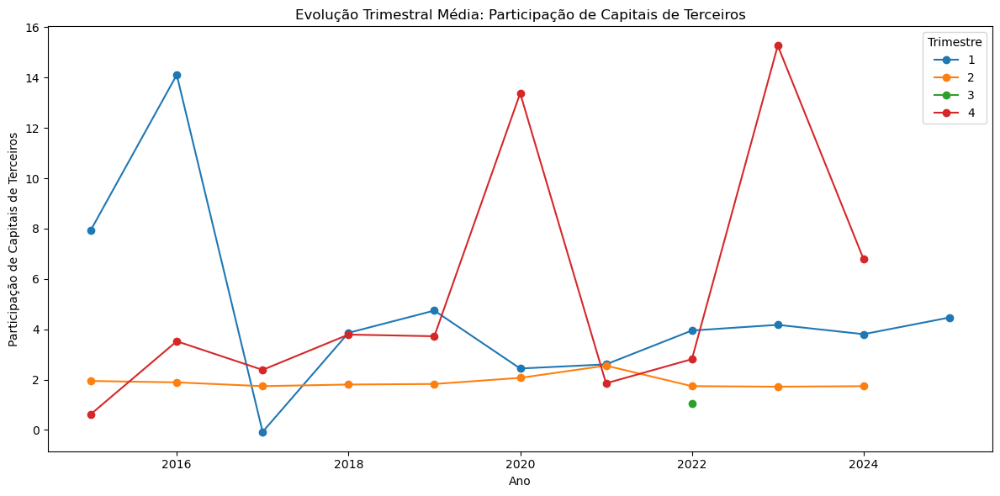

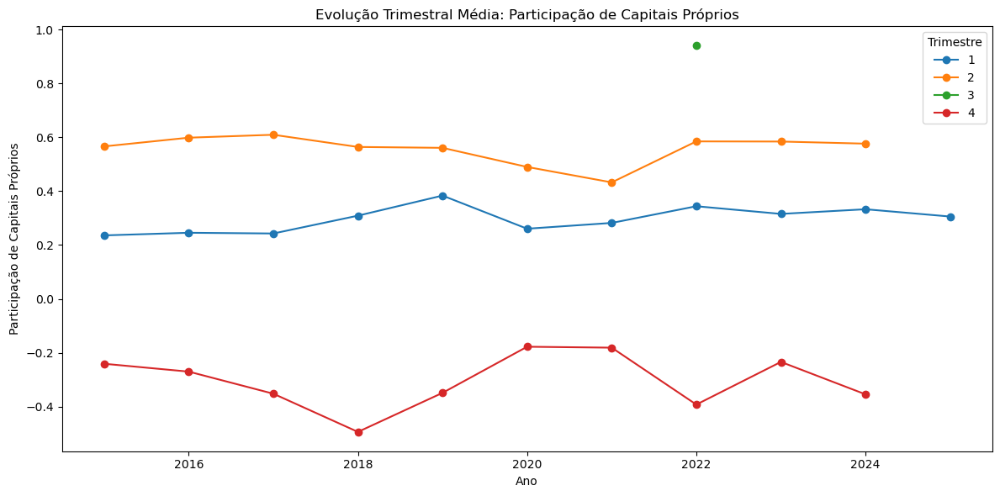

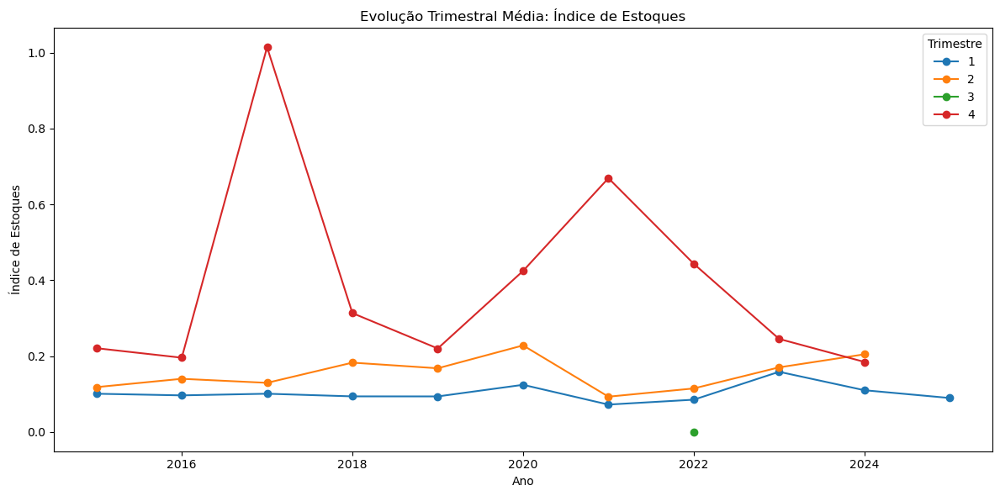

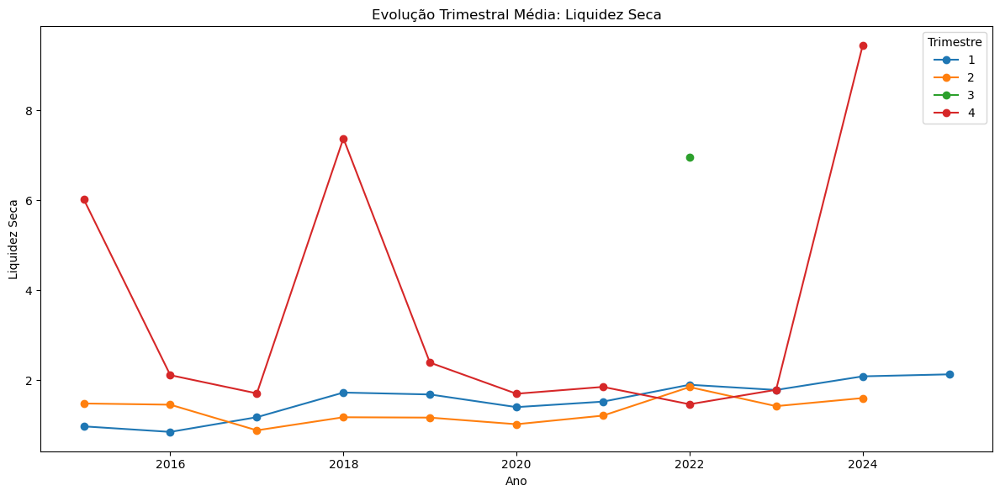

In [27]:
# ===================== ANÁLISE TEMPORAL DOS INDICADORES FINANCEIROS =====================
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Conferência e preparação das colunas de data, ano e trimestre
if 'dt_refer' in df.columns:
    df['dt_refer'] = pd.to_datetime(df['dt_refer'], errors='coerce')
    df['ano'] = df['dt_refer'].dt.year
    df['trimestre'] = df['dt_refer'].dt.quarter

# 2. Seleção dos indicadores (ajuste se necessário)
indicadores_temporais = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]
indicadores_temporais = [ind for ind in indicadores_temporais if ind in df.columns]

# 3. Tendência Anual dos Indicadores (média por ano, para todo o universo)
for ind in indicadores_temporais:
    plt.figure(figsize=(10, 5))
    dados = df.groupby('ano')[ind].mean()
    sns.lineplot(x=dados.index, y=dados.values, marker='o')
    plt.title(f'Tendência Anual do Indicador: {ind}')
    plt.xlabel('Ano')
    plt.ylabel(ind)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 4. Tendência por Segmento e Ano (opcional: use apenas para principais indicadores ou segmentos)
for ind in indicadores_temporais:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x='ano', y=ind, hue='segmento', marker='o')
    plt.title(f'Tendência Anual por Segmento: {ind}')
    plt.xlabel('Ano')
    plt.ylabel(ind)
    plt.legend(title='Segmento', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# 5. Tendência por Trimestre (opcional, para datasets trimestrais)
for ind in indicadores_temporais:
    plt.figure(figsize=(12, 6))
    dados_tri = df.groupby(['ano', 'trimestre'])[ind].mean().unstack()
    dados_tri.plot(ax=plt.gca(), marker='o')
    plt.title(f'Evolução Trimestral Média: {ind}')
    plt.xlabel('Ano')
    plt.ylabel(ind)
    plt.legend(title='Trimestre')
    plt.tight_layout()
    plt.show()


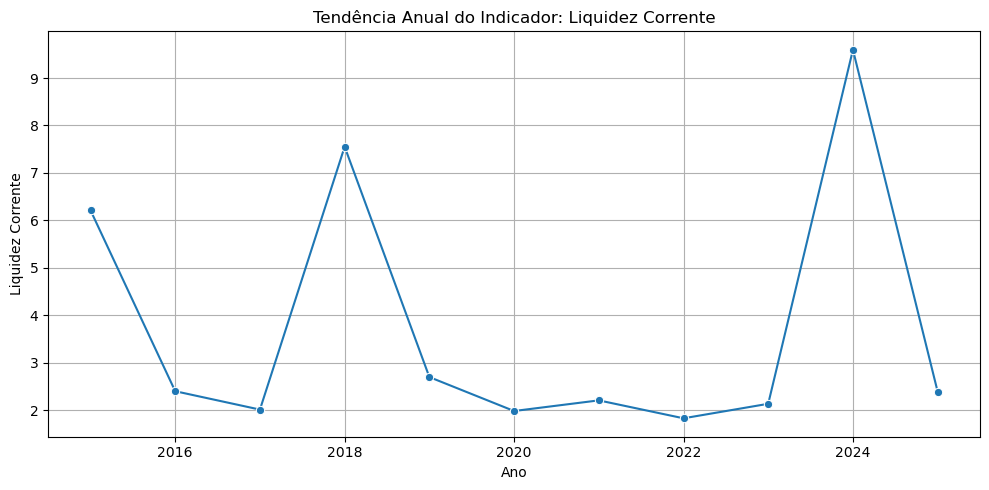

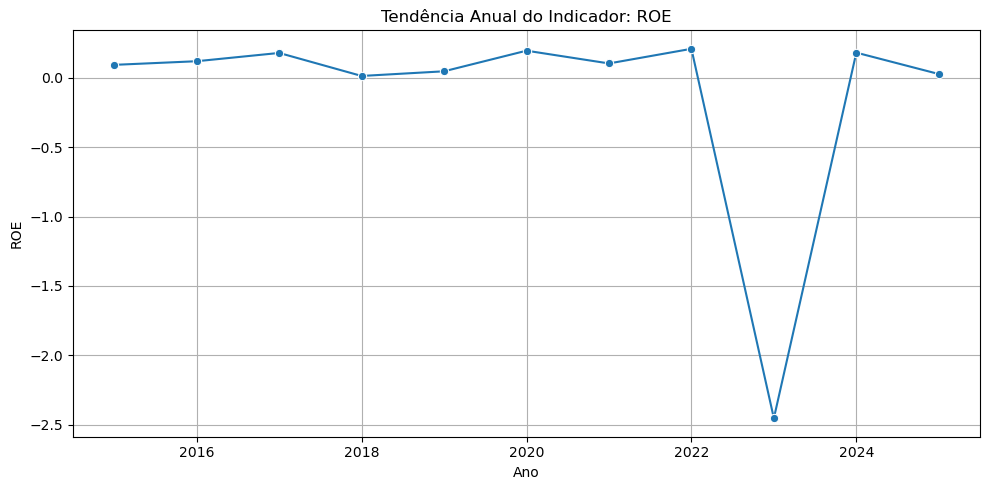

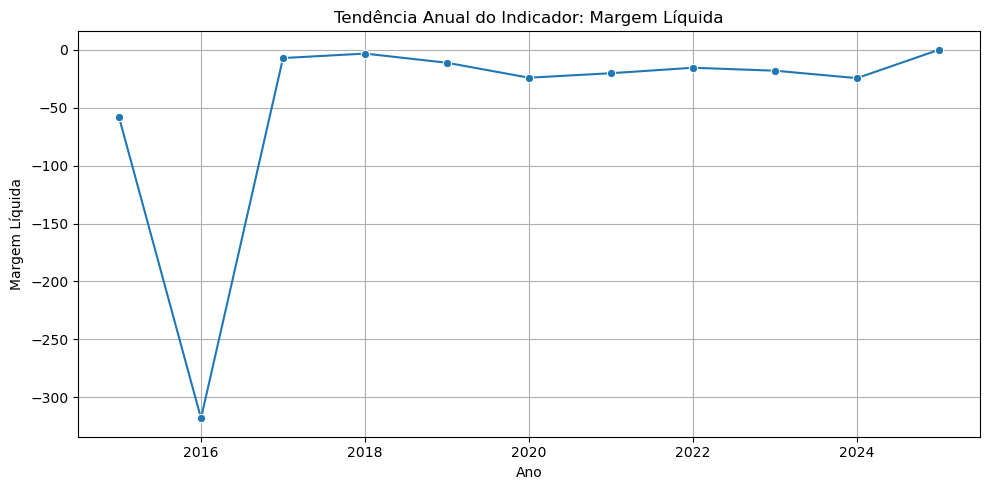

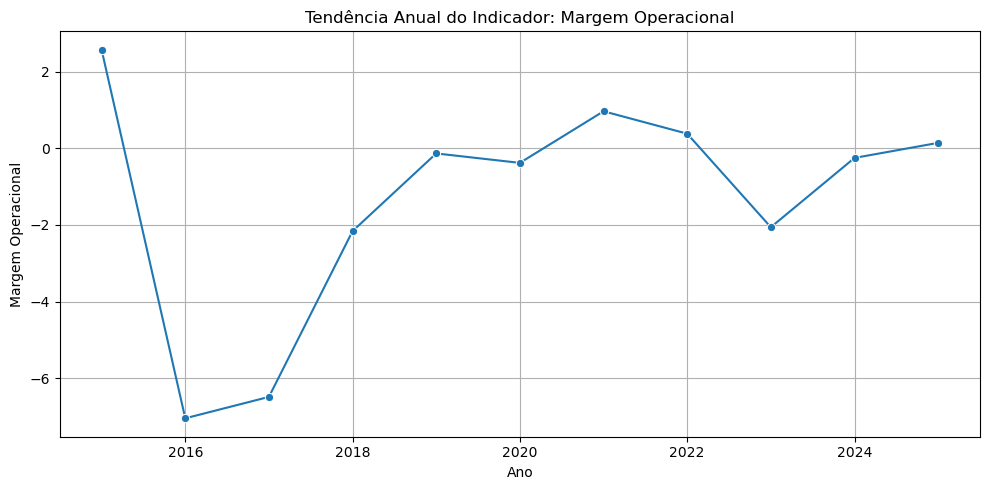

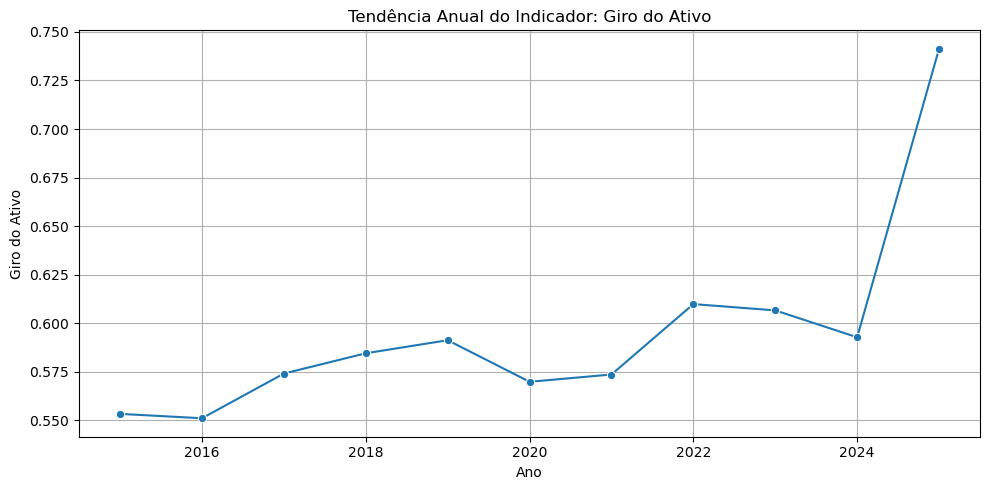

...

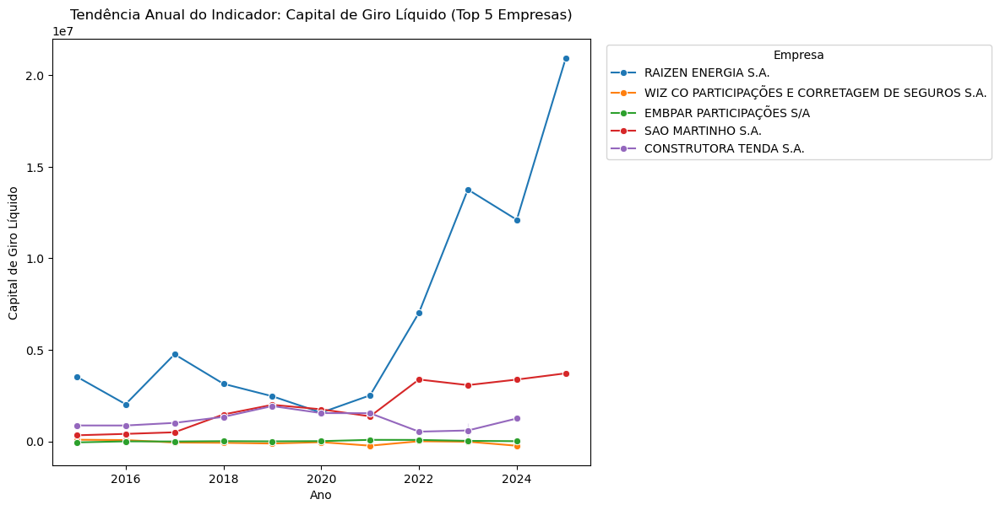

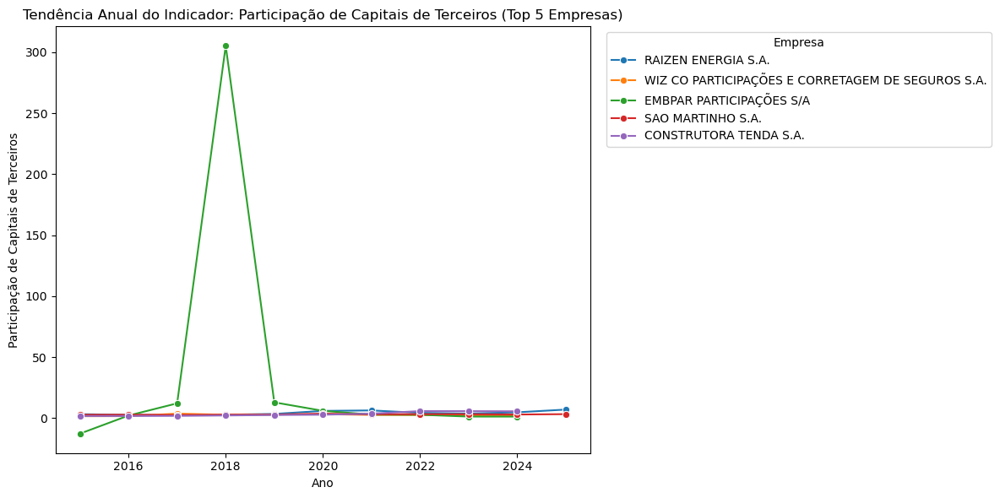

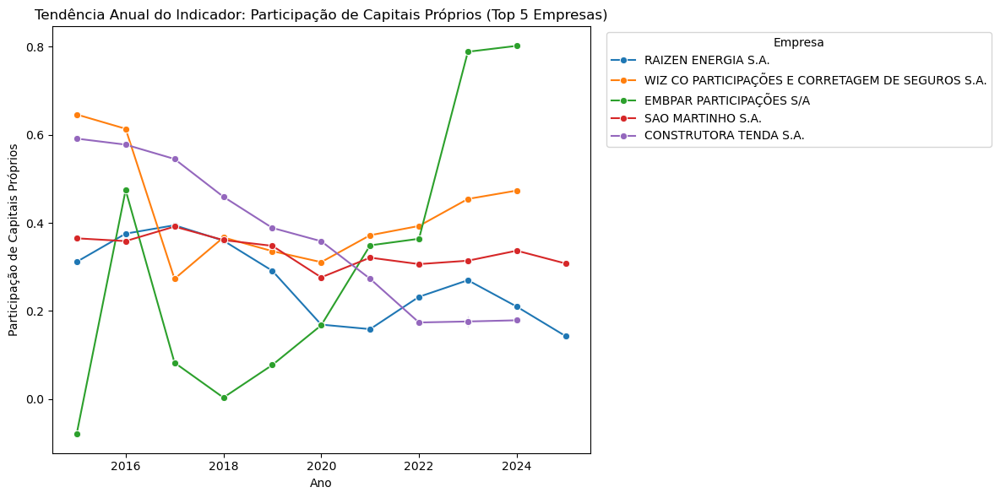

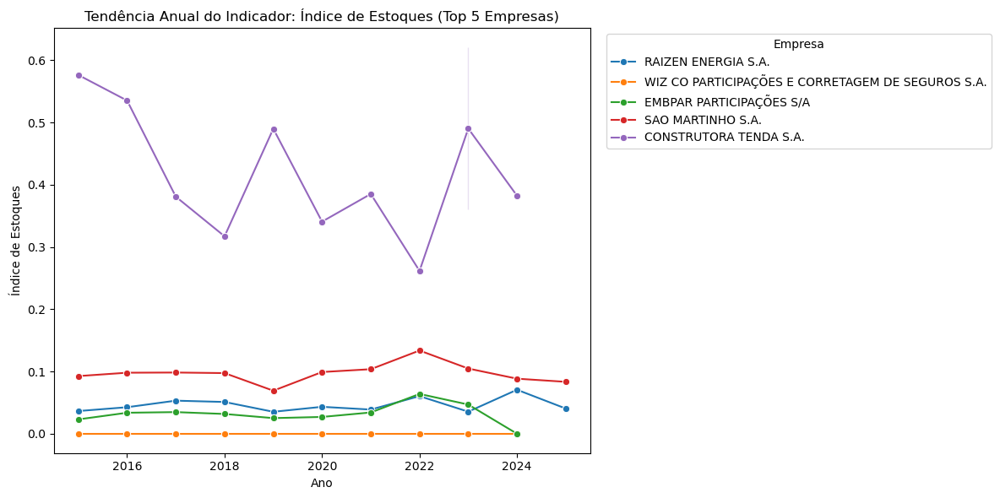

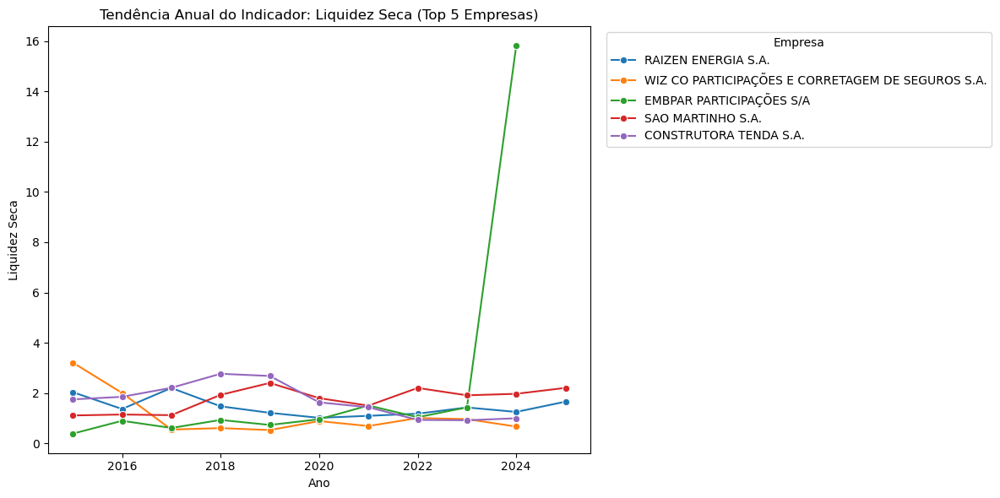

In [28]:
#1. Tendência Geral Anual dos Indicadores
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de indicadores presentes na base
indicadores_temporais = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]
indicadores_temporais = [ind for ind in indicadores_temporais if ind in df.columns]

# Tendência Anual Geral (média por ano)
for ind in indicadores_temporais:
    plt.figure(figsize=(10, 5))
    dados = df.groupby('ano')[ind].mean()
    sns.lineplot(x=dados.index, y=dados.values, marker='o')
    plt.title(f'Tendência Anual do Indicador: {ind}')
    plt.xlabel('Ano')
    plt.ylabel(ind)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Identifica as 5 empresas mais frequentes
top_empresas = df['denom_cia'].value_counts().head(5).index.tolist()

for ind in indicadores_temporais:
    plt.figure(figsize=(12, 6))
    dados = df[df['denom_cia'].isin(top_empresas)]
    sns.lineplot(data=dados, x='ano', y=ind, hue='denom_cia', marker='o')
    plt.title(f'Tendência Anual do Indicador: {ind} (Top 5 Empresas)')
    plt.xlabel('Ano')
    plt.ylabel(ind)
    plt.legend(title='Empresa', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


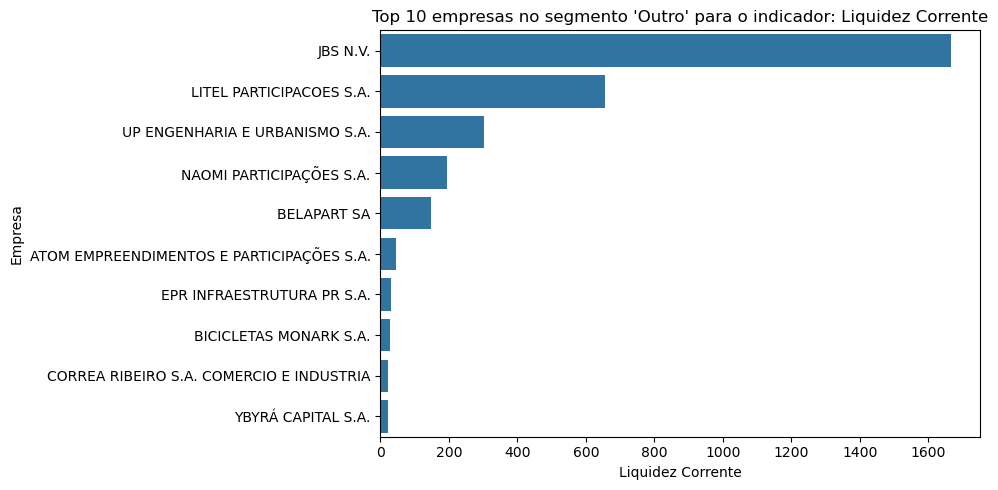

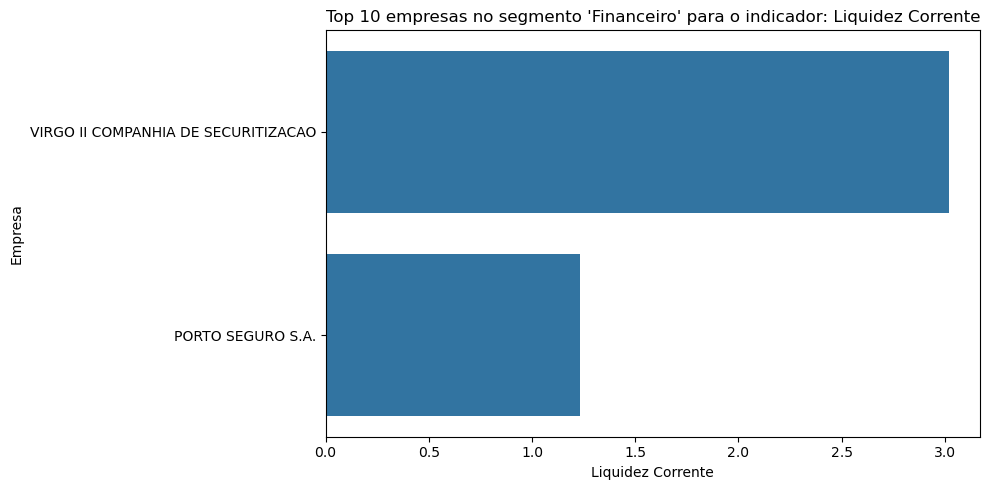

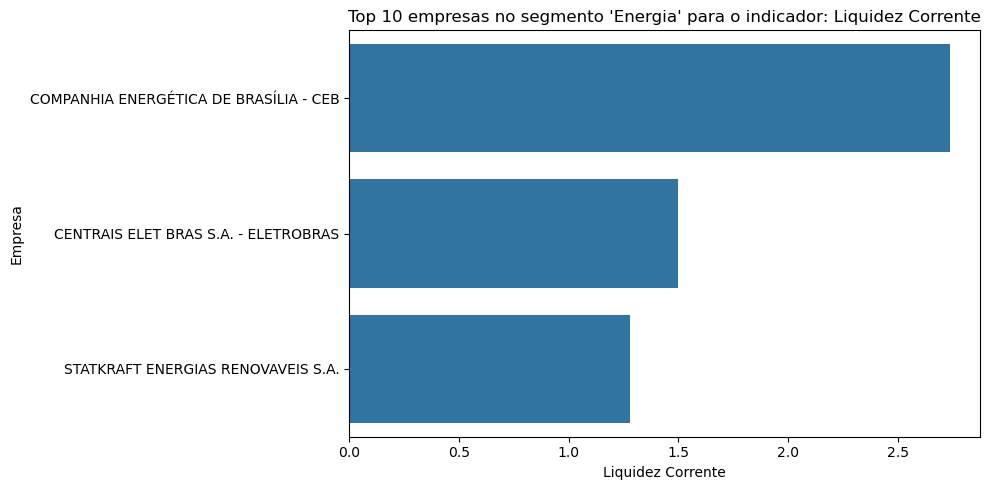

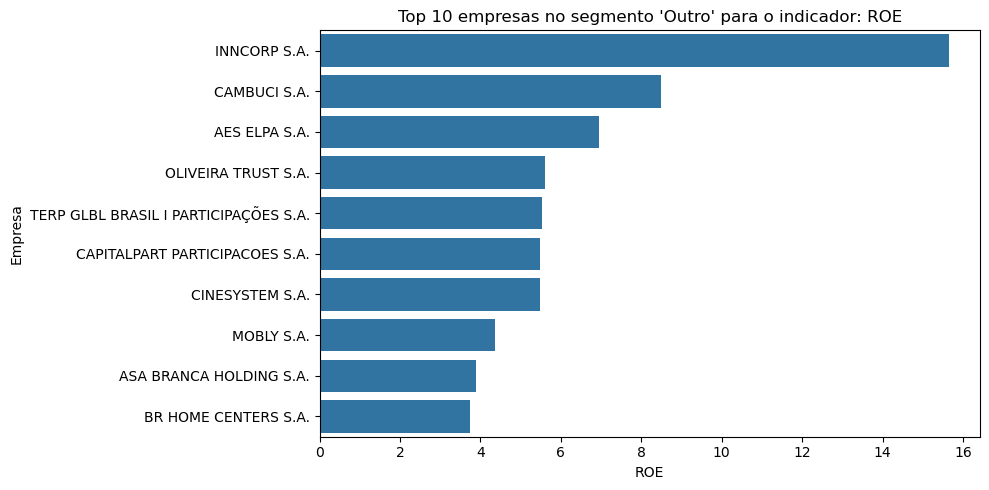

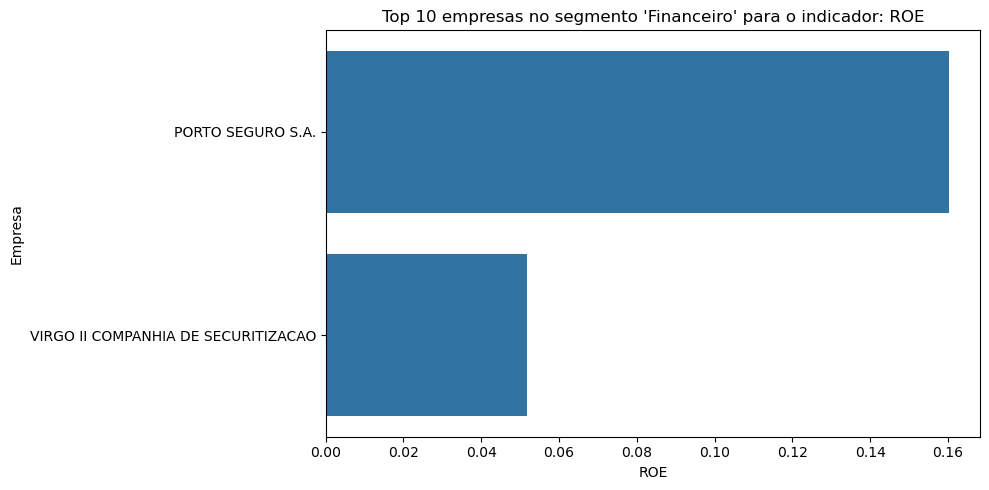

...

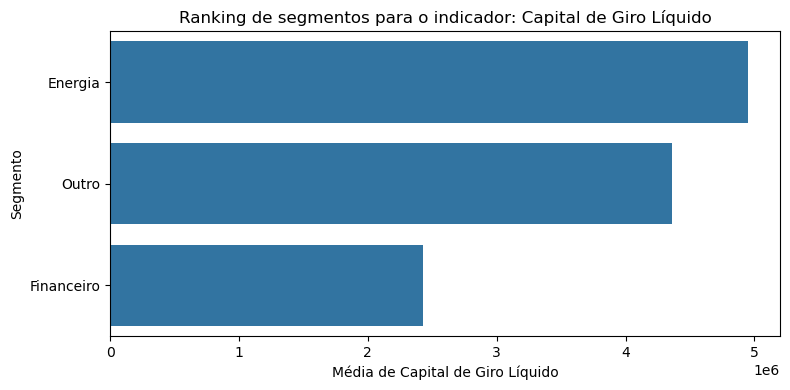

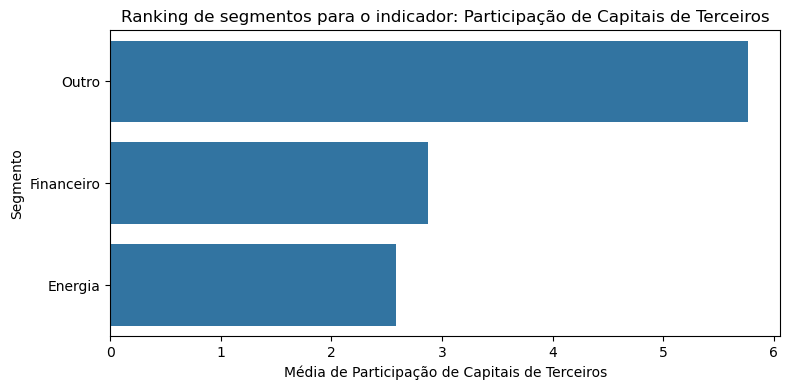

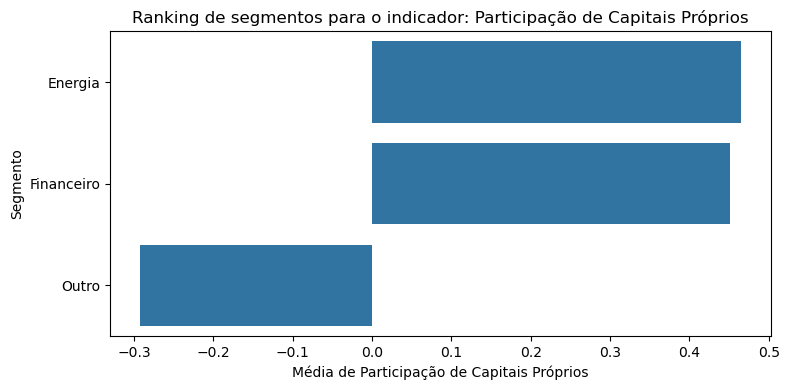

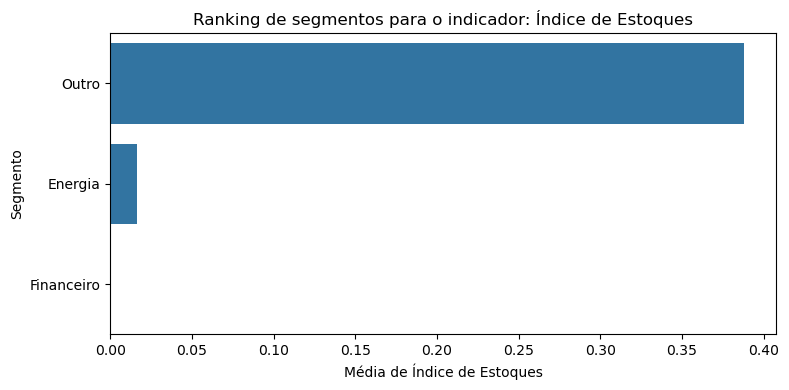

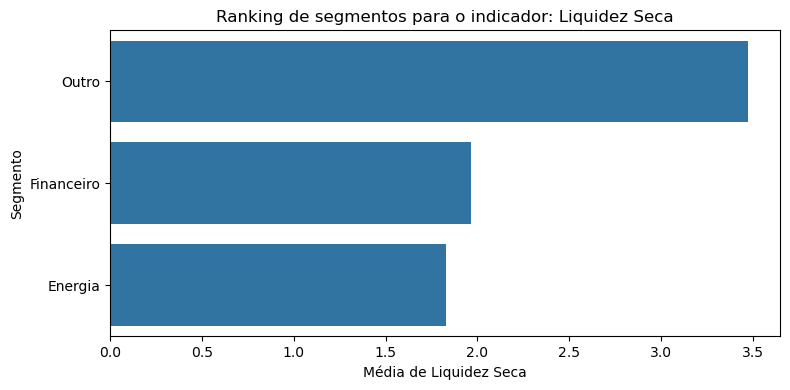

Bloco de benchmark/ranking executado. Analise quais empresas e segmentos mais se destacam em cada indicador. 
Considere justificar possíveis outliers e variações extremas nos próximos comentários ou relatórios.


In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Parâmetros configuráveis
top_n = 10  # Quantidade de empresas/segmentos no ranking
indicadores_analise = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]
# Filtra apenas os indicadores presentes no dataframe
indicadores_analise = [ind for ind in indicadores_analise if ind in df.columns]

# 1. Benchmark por empresa (TOP N empresas de cada segmento)
for ind in indicadores_analise:
    for seg in df['segmento'].unique():
        df_seg = df[df['segmento'] == seg]
        ranking_emp = df_seg[['denom_cia', ind]].dropna().groupby('denom_cia')[ind].mean().sort_values(ascending=False).head(top_n)
        plt.figure(figsize=(10, 5))
        sns.barplot(y=ranking_emp.index, x=ranking_emp.values, orient='h')
        plt.title(f"Top {top_n} empresas no segmento '{seg}' para o indicador: {ind}")
        plt.xlabel(ind)
        plt.ylabel("Empresa")
        plt.tight_layout()
        plt.show()

# 2. Benchmark por segmento (média de cada segmento para cada indicador)
for ind in indicadores_analise:
    ranking_seg = df.groupby('segmento')[ind].mean().sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(8, 4))
    sns.barplot(y=ranking_seg.index, x=ranking_seg.values, orient='h')
    plt.title(f"Ranking de segmentos para o indicador: {ind}")
    plt.xlabel(f"Média de {ind}")
    plt.ylabel("Segmento")
    plt.tight_layout()
    plt.show()

print("Bloco de benchmark/ranking executado. Analise quais empresas e segmentos mais se destacam em cada indicador. \nConsidere justificar possíveis outliers e variações extremas nos próximos comentários ou relatórios.")


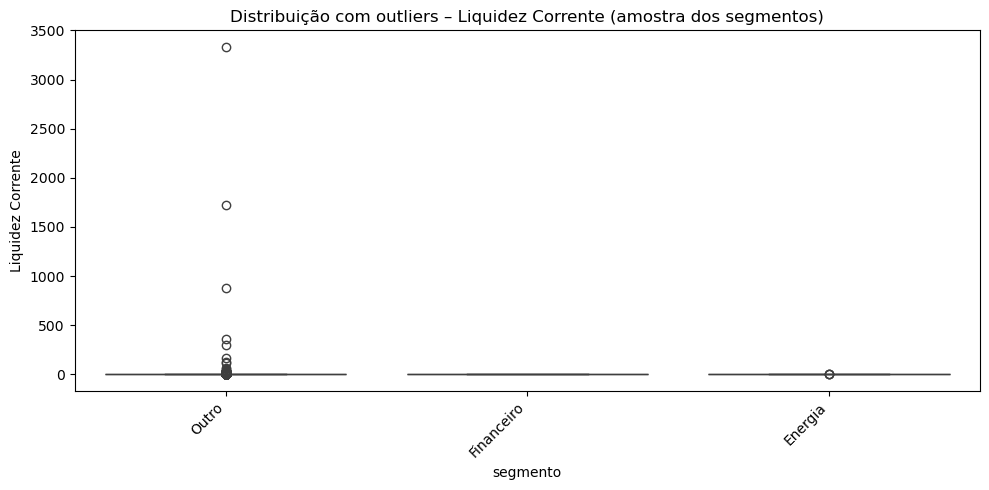

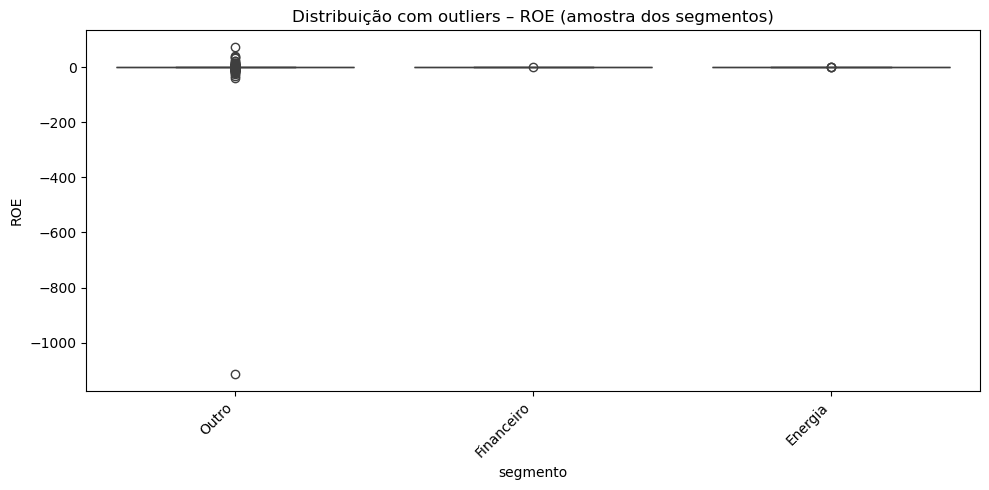

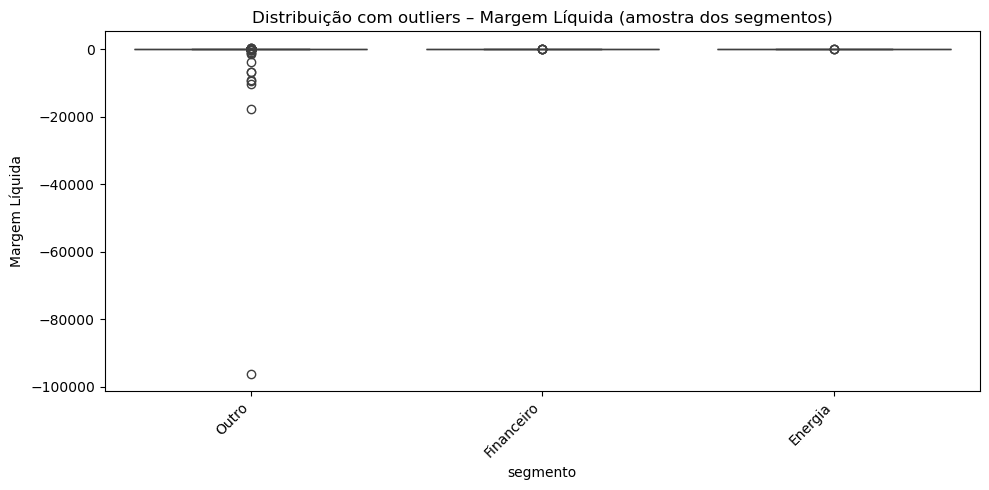

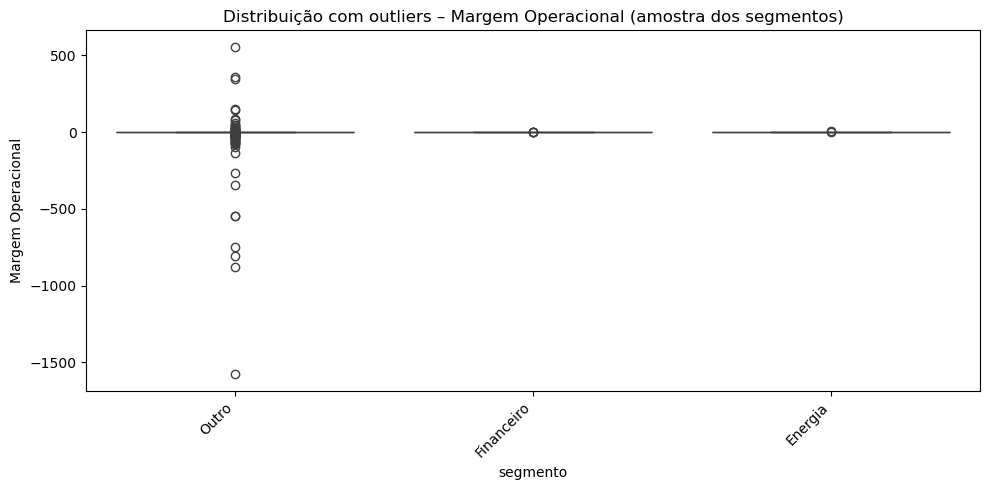

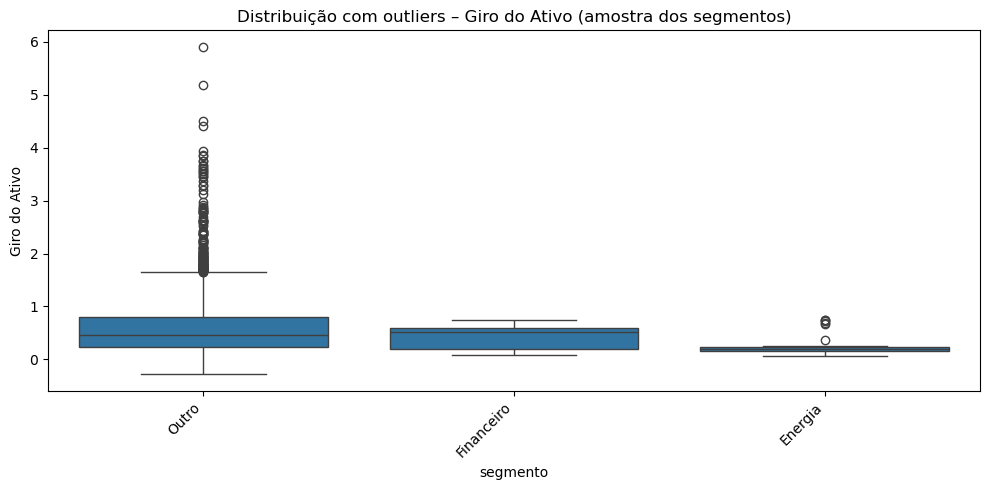

Resumo de outliers (baseado em IQR):
Liquidez Corrente: 269 outliers detectados nos segmentos analisados.
ROE: 586 outliers detectados nos segmentos analisados.
Margem Líquida: 716 outliers detectados nos segmentos analisados.
Margem Operacional: 646 outliers detectados nos segmentos analisados.
Giro do Ativo: 149 outliers detectados nos segmentos analisados.
ROA: 569 outliers detectados nos segmentos analisados.
Endividamento Geral: 2 outliers detectados nos segmentos analisados.
Imobilização do Patrimônio Líquido: 428 outliers detectados nos segmentos analisados.
Capital de Giro Líquido: 618 outliers detectados nos segmentos analisados.
Participação de Capitais de Terceiros: 534 outliers detectados nos segmentos analisados.
Participação de Capitais Próprios: 312 outliers detectados nos segmentos analisados.
Índice de Estoques: 322 outliers detectados nos segmentos analisados.
Liquidez Seca: 275 outliers detectados nos segmentos analisados.

DICA: Para análise detalhada de outliers em

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Limite: quantidade máxima de segmentos/indicadores para análise visual
max_segmentos = 5
max_indicadores = 5

# 1. Visualização: Apenas os primeiros indicadores e segmentos
indicadores_plot = indicadores_analise[:max_indicadores]
segmentos_plot = df['segmento'].unique()[:max_segmentos]

for ind in indicadores_plot:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='segmento', y=ind, data=df[df['segmento'].isin(segmentos_plot)], showfliers=True)
    plt.title(f'Distribuição com outliers – {ind} (amostra dos segmentos)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# 2. Relatório leve de outliers (sem registrar todas as ocorrências)
print("Resumo de outliers (baseado em IQR):")
for ind in indicadores_analise:
    outlier_count = 0
    for seg in segmentos_plot:
        serie = df[df['segmento'] == seg][ind].dropna()
        if len(serie) < 10:
            continue  # pula segmentos com poucos dados
        Q1 = serie.quantile(0.25)
        Q3 = serie.quantile(0.75)
        IQR = Q3 - Q1
        lim_inf = Q1 - 1.5 * IQR
        lim_sup = Q3 + 1.5 * IQR
        n_out = ((serie < lim_inf) | (serie > lim_sup)).sum()
        outlier_count += n_out
    print(f"{ind}: {outlier_count} outliers detectados nos segmentos analisados.")

print("\nDICA: Para análise detalhada de outliers em todos os segmentos/indicadores, utilize filtros ou exporte os resultados para análise externa.")


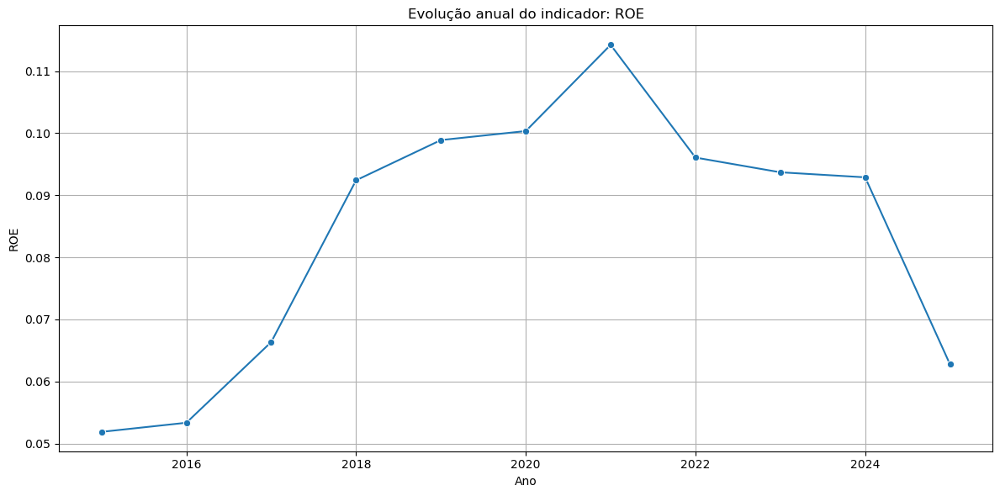

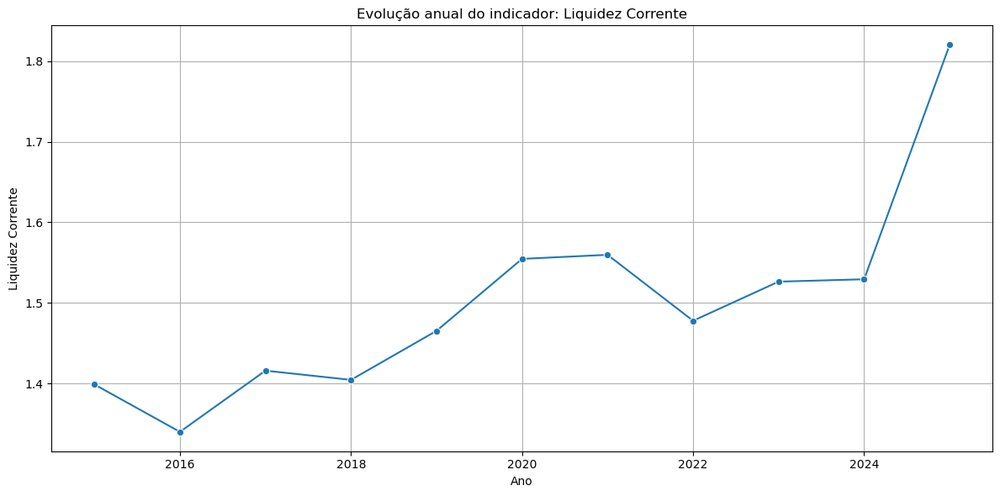

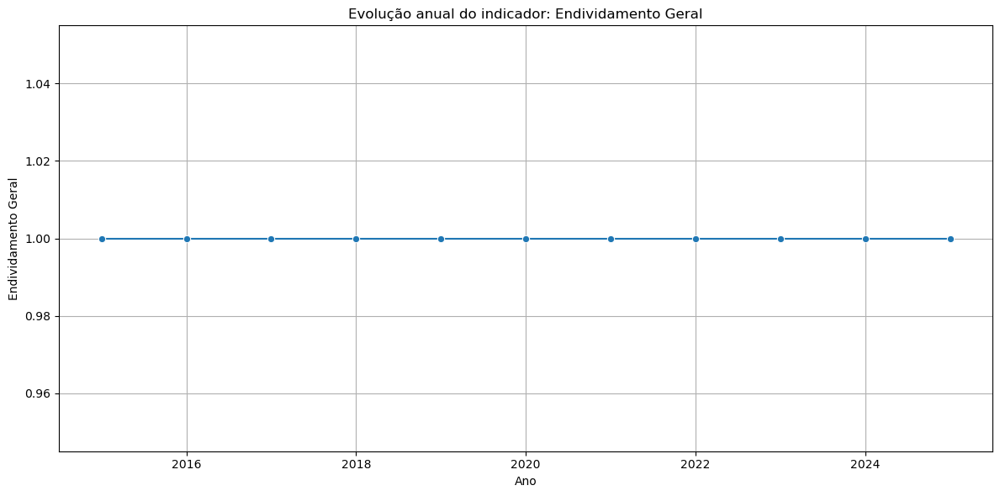

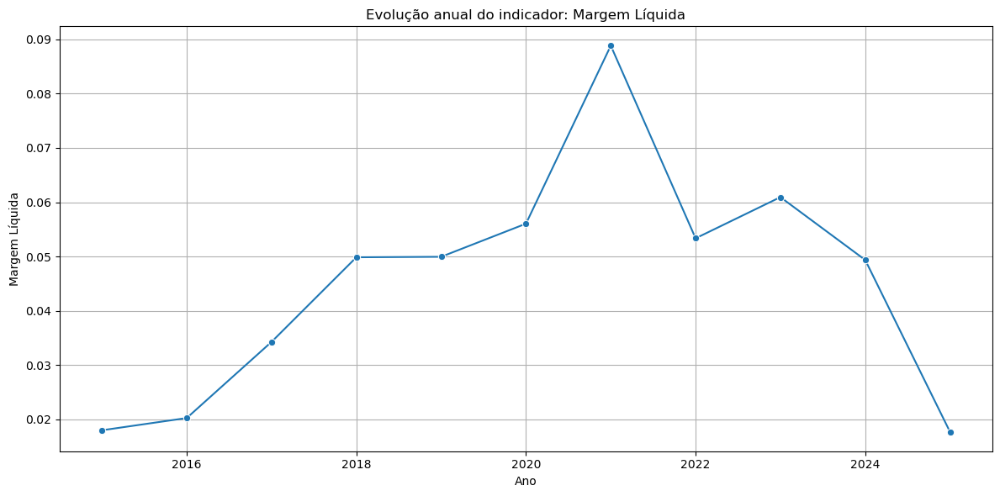

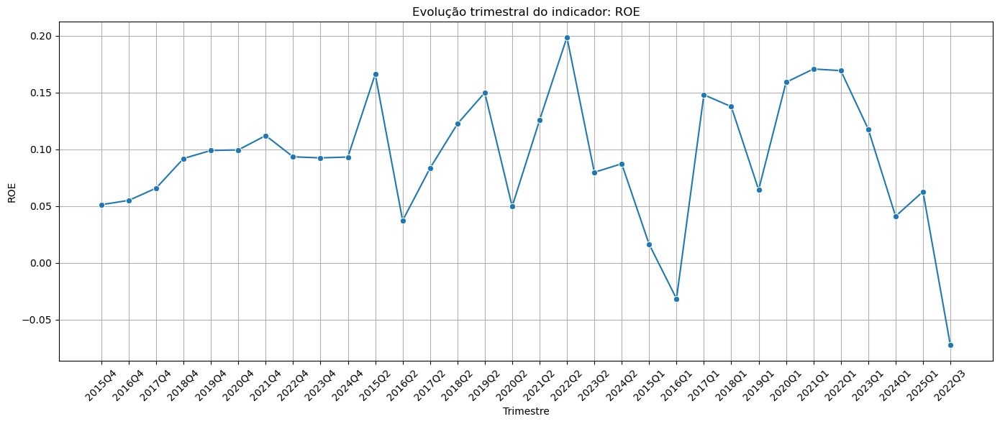

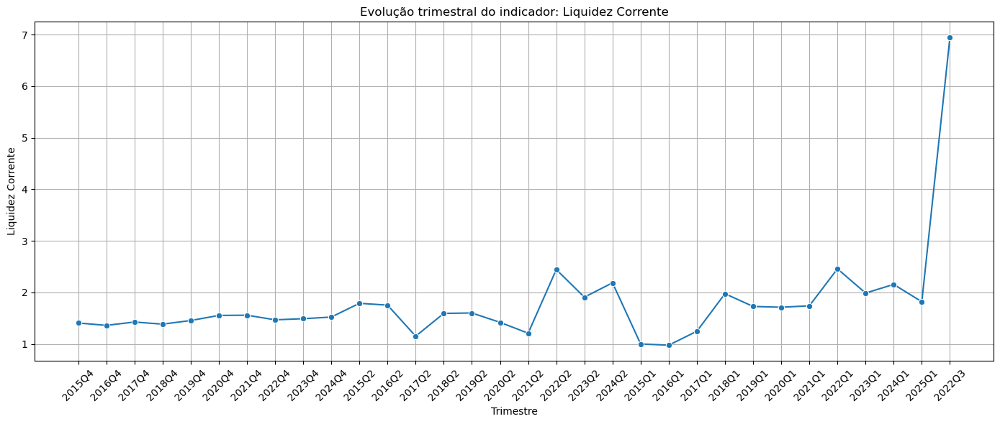

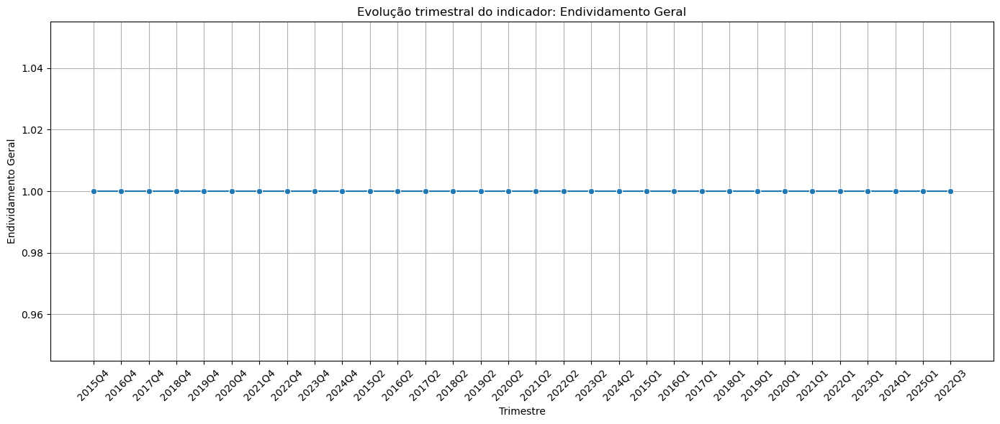

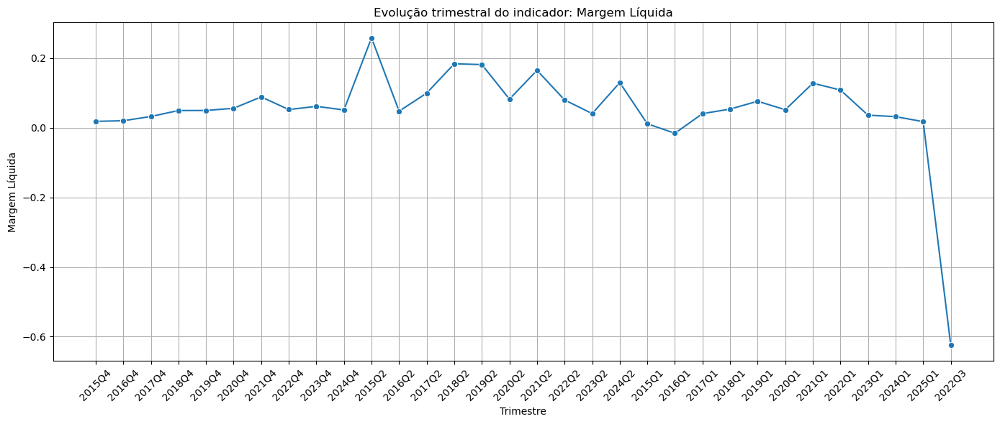

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Garante o formato de data para dt_refer e cria colunas de ano e trimestre
df['dt_refer'] = pd.to_datetime(df['dt_refer'], errors='coerce')
df['ano'] = df['dt_refer'].dt.year
df['trimestre'] = df['dt_refer'].dt.to_period('Q').astype(str)

# 2. Escolhe alguns indicadores principais para análise temporal (ajuste conforme o projeto)
indicadores_temporais = ['ROE', 'Liquidez Corrente', 'Endividamento Geral', 'Margem Líquida']
indicadores_temporais = [ind for ind in indicadores_temporais if ind in df.columns]

# 3. Gráficos de evolução anual
for ind in indicadores_temporais:
    plt.figure(figsize=(12, 6))
    sns.lineplot(x='ano', y=ind, data=df, estimator='median', errorbar=None, marker='o')
    plt.title(f'Evolução anual do indicador: {ind}')
    plt.ylabel(ind)
    plt.xlabel('Ano')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 4. Gráficos de evolução trimestral
for ind in indicadores_temporais:
    plt.figure(figsize=(14, 6))
    # Ordena trimestres corretamente
    ordem_trimestres = sorted(df['trimestre'].dropna().unique())
    sns.lineplot(x='trimestre', y=ind, data=df, estimator='median', errorbar=None, marker='o')
    plt.title(f'Evolução trimestral do indicador: {ind}')
    plt.ylabel(ind)
    plt.xlabel('Trimestre')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


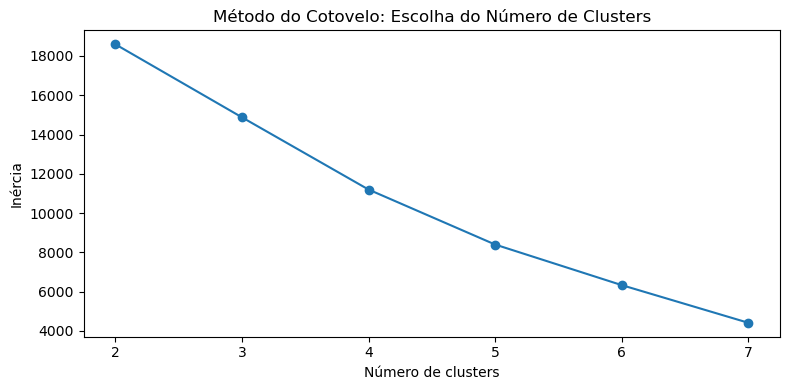

,Liquidez Corrente,ROE,Endividamento Geral,Margem Líquida,Giro do Ativo,ROA
cluster,,,,,,
0,1.983076,-0.191295,1.0,-0.840653,0.602441,0.010816
1,4.835898,-0.012794,1.0,-0.069418,0.116439,-0.008083
2,0.612699,0.170084,1.0,-17910.919162,0.003170,-15.958693


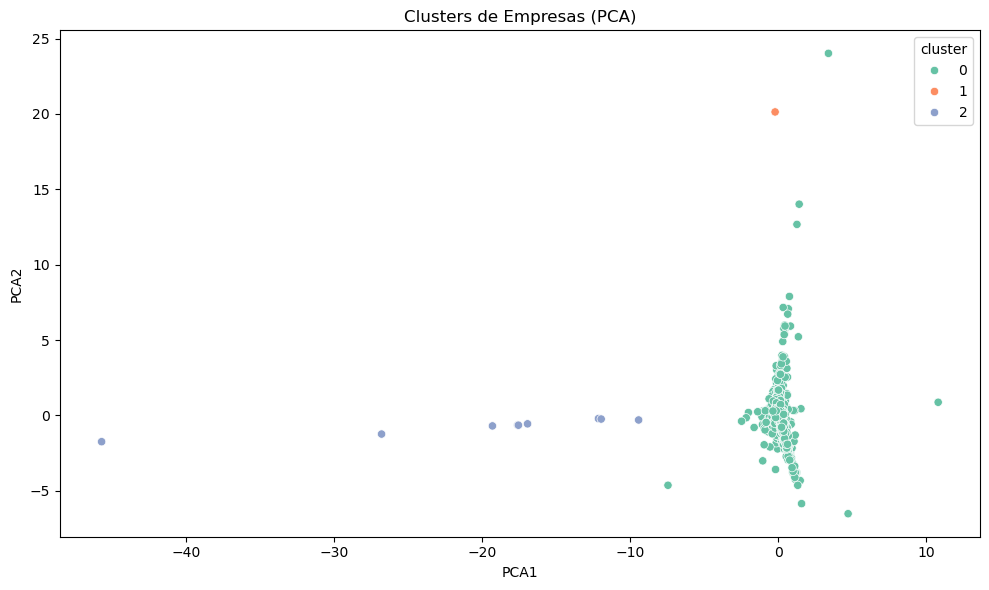

In [59]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Seleção dos indicadores para clusterização (ajuste conforme o projeto)
indicadores_cluster = [
    'Liquidez Corrente', 'ROE', 'Endividamento Geral', 'Margem Líquida', 'Giro do Ativo', 'ROA'
]
indicadores_cluster = [ind for ind in indicadores_cluster if ind in df.columns]

# 2. Pré-processamento: remove linhas com dados ausentes
df_cluster = df[indicadores_cluster].dropna()

# 3. Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cluster)

# 4. Encontrando o número ideal de clusters (opcional: método do cotovelo)
inertia = []
K_range = range(2, 8)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(K_range, inertia, marker='o')
plt.title('Método do Cotovelo: Escolha do Número de Clusters')
plt.xlabel('Número de clusters')
plt.ylabel('Inércia')
plt.tight_layout()
plt.show()

# 5. Definindo o número de clusters (exemplo: 3, ajuste conforme o gráfico acima)
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df_cluster['cluster'] = kmeans.fit_predict(X_scaled)

# 6. Estatísticas por cluster
resumo_cluster = df_cluster.groupby('cluster')[indicadores_cluster].mean()
display(resumo_cluster)

# 7. Visualização em 2D (PCA para facilitar a plotagem, opcional)
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
df_cluster['PCA1'] = components[:,0]
df_cluster['PCA2'] = components[:,1]

plt.figure(figsize=(10,6))
sns.scatterplot(x='PCA1', y='PCA2', hue='cluster', data=df_cluster, palette='Set2')
plt.title('Clusters de Empresas (PCA)')
plt.tight_layout()
plt.show()


Explicação Formal dos Passos
Seleção e limpeza dos dados: Usa apenas indicadores financeiros escolhidos e remove linhas com valores ausentes para evitar viés.

Normalização: Essencial para que todos os indicadores tenham peso semelhante na clusterização.

Definição do número de clusters: Utiliza o método do cotovelo para sugerir um valor, mas pode ser ajustado conforme a sua análise.

Clusterização e análise: Após rodar o KMeans, o perfil médio de cada grupo é exibido e visualizado em duas dimensões via PCA.

Customização: Você pode analisar a composição de cada cluster, verificar quais empresas ficaram em cada grupo e relacionar ao segmento ou desempenho.

In [69]:
# Diagnóstico da distribuição das classes
print("Distribuição das classes de risco:")
print(y.value_counts())

# Remove classes com menos de 2 observações
counts = y.value_counts()
classes_validas = counts[counts >= 2].index
mask = y.isin(classes_validas)

X_filtrado = X[mask]
y_filtrado = y[mask]

# Split correto: use X_filtrado e y_filtrado
X_train, X_test, y_train, y_test = train_test_split(
    X_filtrado, y_filtrado, stratify=y_filtrado, test_size=0.3, random_state=42
)


Distribuição das classes de risco:
risco
0    3711
2       9
1       1
Name: count, dtype: int64


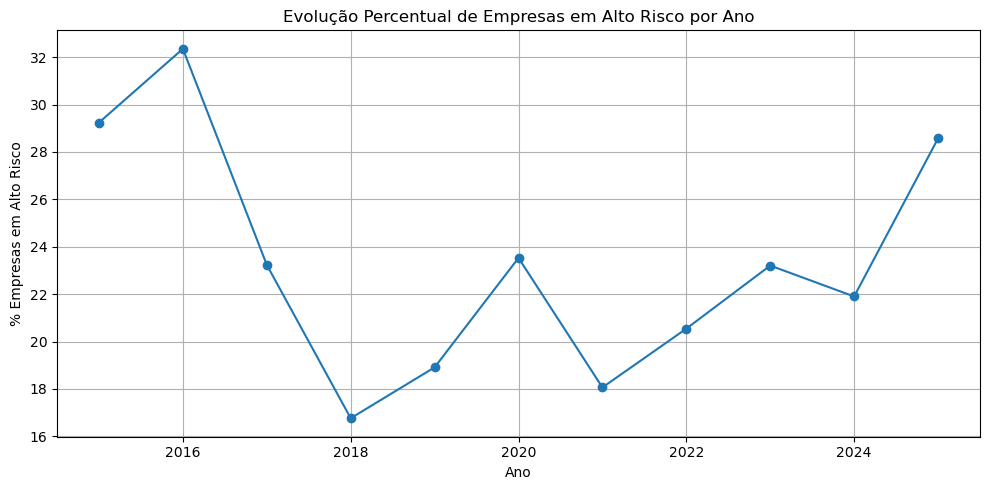

INSIGHT: Observe se há tendências de aumento/diminuição de risco agregado ao longo dos anos, podendo associar a eventos macroeconômicos.


In [77]:
# 3. Evolução do percentual de empresas de alto risco ao longo do tempo (por ano)
df_group = df.groupby('ano')['risco'].mean() * 100

plt.figure(figsize=(10,5))
plt.plot(df_group.index, df_group.values, marker='o', label='Percentual Alto Risco')
plt.ylabel('% Empresas em Alto Risco')
plt.xlabel('Ano')
plt.title('Evolução Percentual de Empresas em Alto Risco por Ano')
plt.grid(True)
plt.tight_layout()
plt.show()

print("INSIGHT: Observe se há tendências de aumento/diminuição de risco agregado ao longo dos anos, podendo associar a eventos macroeconômicos.")


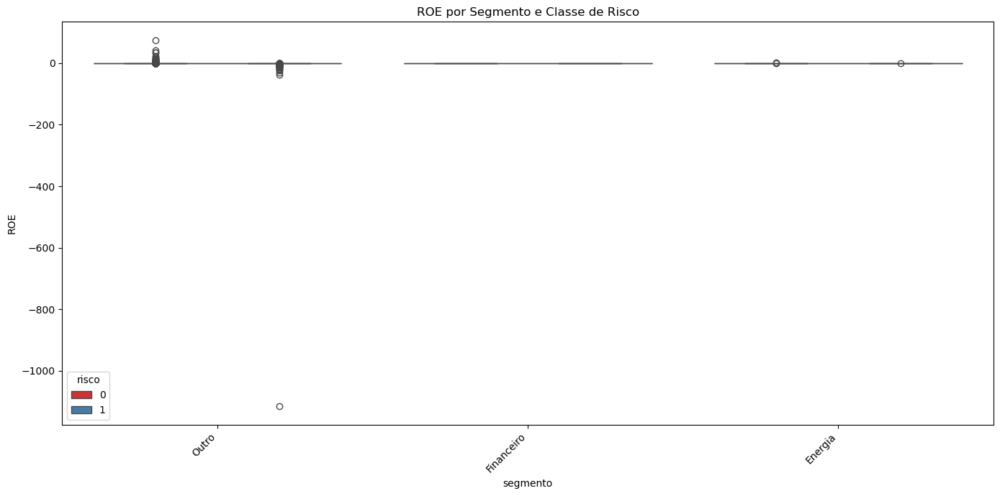

INSIGHT: Identifique segmentos onde o risco está mais concentrado e se há diferenças de performance nos indicadores-chave.


In [79]:
# 4. Comparativo dos principais indicadores por risco E segmento (exemplo com ROE)
if 'segmento' in df.columns and 'ROE' in df.columns:
    plt.figure(figsize=(14, 7))
    sns.boxplot(x='segmento', y='ROE', hue='risco', data=df, palette='Set1')
    plt.title('ROE por Segmento e Classe de Risco')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

print("INSIGHT: Identifique segmentos onde o risco está mais concentrado e se há diferenças de performance nos indicadores-chave.")


11. Interpretação dos Resultados
11.1 Principais Fatores de Risco
Com base nos resultados das análises comparativas e preditivas, foi possível identificar os principais fatores que diferenciam empresas classificadas como alto risco em relação às demais:

Liquidez Corrente: Empresas de alto risco apresentaram, em média, valores de liquidez corrente significativamente inferiores, indicando maior dificuldade em honrar compromissos de curto prazo.

Endividamento Geral: Observou-se maior endividamento entre empresas de alto risco, apontando para uma maior dependência de capital de terceiros e potencial fragilidade diante de oscilações no custo do crédito.

Margem Líquida e Operacional: Baixas margens, ou margens negativas, são mais recorrentes em empresas de alto risco, sugerindo baixa eficiência operacional e maiores desafios de rentabilidade.

ROE e ROA: Os retornos sobre patrimônio líquido e ativos tendem a ser menores (ou negativos) nessas empresas, evidenciando dificuldades de geração de valor aos acionistas e menor retorno dos investimentos realizados.

Os gráficos de distribuição dos indicadores por classe de risco reforçam essas conclusões, demonstrando visualmente as diferenças estatísticas entre os grupos.

11.2 Discussão dos Impactos Macroeconômicos
Ao avaliar a evolução temporal dos indicadores de risco, constata-se que períodos de aumento do percentual de empresas classificadas como alto risco coincidem, em grande parte, com contextos macroeconômicos adversos. Exemplos incluem:

Recessão Econômica (2015-2016): A crise econômica impactou fortemente setores industriais e de serviços, elevando o risco de inadimplência e reduzindo a liquidez das empresas.

Pandemia de COVID-19 (2020): A brusca queda de receitas e as restrições operacionais elevaram a proporção de empresas de alto risco, especialmente em segmentos mais sensíveis à atividade econômica.

Ciclos de Juros Elevados: Momentos de aumento da taxa Selic ampliaram o custo do endividamento, penalizando empresas já alavancadas.

Essas evidências reforçam a necessidade de acompanhamento constante dos fatores macroeconômicos na avaliação de risco corporativo.

11.3 Recomendações
Gestão Ativa de Capital de Giro: Empresas devem monitorar e otimizar sua liquidez, especialmente em contextos econômicos voláteis.

Redução do Endividamento Excessivo: Recomenda-se limitar a dependência de capital de terceiros, buscando equilíbrio financeiro e maior resiliência.

Monitoramento de Margens Operacionais: Investir em eficiência e controle de custos para mitigar riscos de rentabilidade baixa.

Acompanhamento do Ambiente Macroeconômico: Adotar cenários de stress e planejar alternativas para períodos de crise.

11.4 Limitações e Sugestões para Trabalhos Futuros
Cobertura de Dados: A análise depende da disponibilidade e qualidade das informações financeiras reportadas. Empresas com dados incompletos podem ter sido excluídas de parte das análises.

Fatores Não Observados: Aspectos qualitativos, como governança, inovação e gestão de riscos, não foram considerados e podem influenciar o risco real.

Modelos Preditivos: O desempenho da modelagem pode ser ampliado com maior equilíbrio entre classes ou coleta de mais exemplos de empresas de alto risco.

Expansão Temporal: Futuras análises podem ampliar o período ou a granularidade da avaliação (ex.: análise mensal, simulação de choques econômicos).

In [83]:
# Supondo que seu DataFrame principal é df
# 1. Certifique-se de que existe a coluna 'risco' binária
# Classe 0 = baixo risco, Classe 1 = alto risco

if 'risco' in df.columns:
    y_bin = (df['risco'] != 0).astype(int)  # Ajuste: 0 = baixo, 1 = alto risco
else:
    raise Exception("Coluna 'risco' não encontrada. Certifique-se de criá-la corretamente.")

# 2. Defina X apenas com os indicadores numéricos relevantes
indicadores_analise = [
    'Liquidez Corrente', 'ROE', 'Margem Líquida', 'Margem Operacional',
    'Giro do Ativo', 'ROA', 'Endividamento Geral', 'Imobilização do Patrimônio Líquido',
    'Capital de Giro Líquido', 'Participação de Capitais de Terceiros',
    'Participação de Capitais Próprios', 'Índice de Estoques', 'Liquidez Seca'
]
# Apenas colunas realmente presentes
indicadores_analise = [ind for ind in indicadores_analise if ind in df.columns]
X = df[indicadores_analise].fillna(0)  # Ajuste o fillna conforme sua estratégia



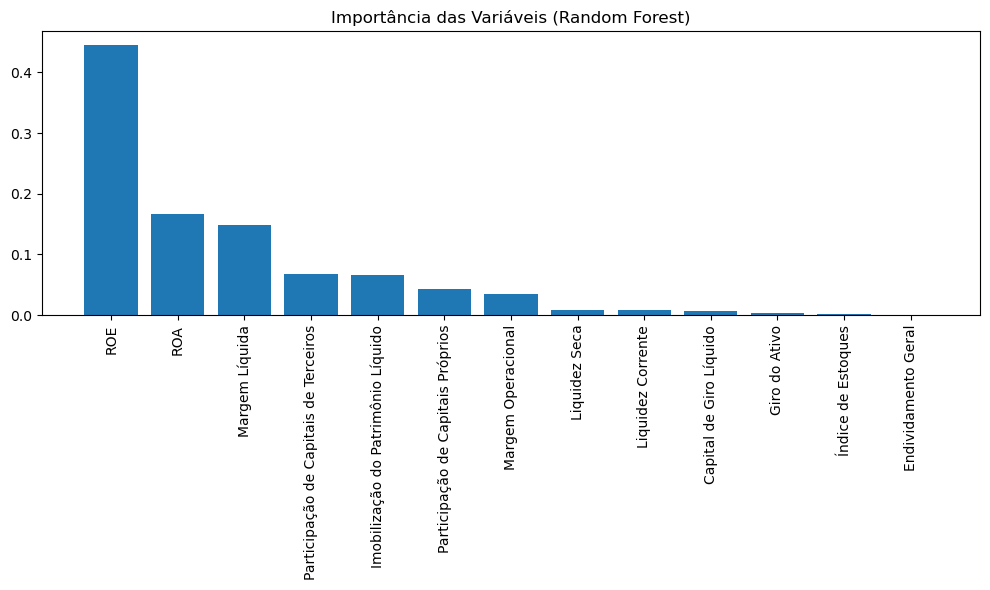

,Feature,Importance
0,ROE,0.445538
1,ROA,0.166266
2,Margem Líquida,0.147867
3,Participação de Capitais de Terceiros,0.068204
4,Imobilização do Patrimônio Líquido,0.066266
5,Participação de Capitais Próprios,0.042283
6,Margem Operacional,0.035435
7,Liquidez Seca,0.009020
8,Liquidez Corrente,0.008843
9,Capital de Giro Líquido,0.006477


In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Certifique-se de que df_model, X, y_bin já estejam definidos conforme pipeline anterior

# 1. Separação treino/teste (ajuste as variáveis conforme seu contexto)
X_train, X_test, y_train, y_test = train_test_split(
    X, y_bin, stratify=y_bin, test_size=0.3, random_state=42
)

# 2. Treinamento do modelo Random Forest
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# 3. Importância das variáveis
importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]
features = X.columns

# 4. Plotagem do ranking de importância das variáveis
plt.figure(figsize=(10, 6))
plt.title('Importância das Variáveis (Random Forest)')
plt.bar(range(len(features)), importances[indices], align='center')
plt.xticks(range(len(features)), features[indices], rotation=90)
plt.tight_layout()
plt.show()

# 5. Exibição tabular
fi_df = pd.DataFrame({'Feature': features[indices], 'Importance': importances[indices]})
display(fi_df.head(15))  # Top 15 variáveis mais importantes


shap_summary.shape: (1220, 13, 2)
X_test.shape: (1220, 13)


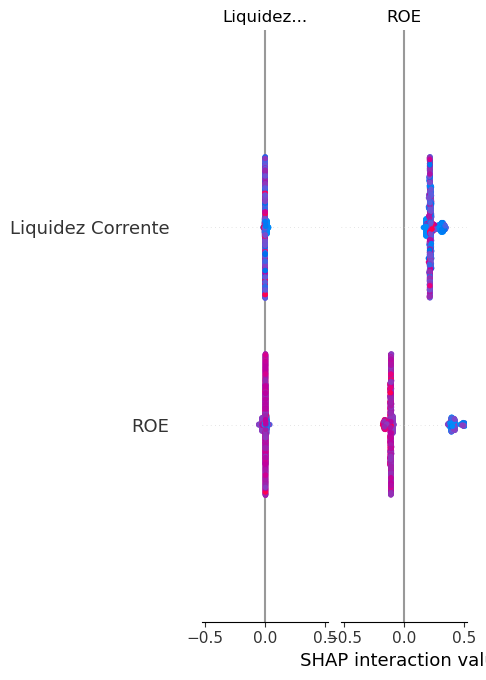

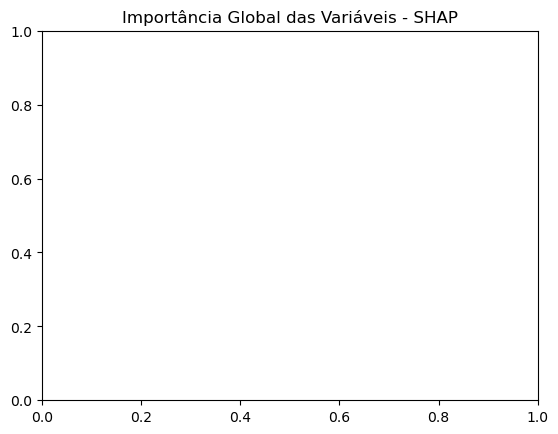

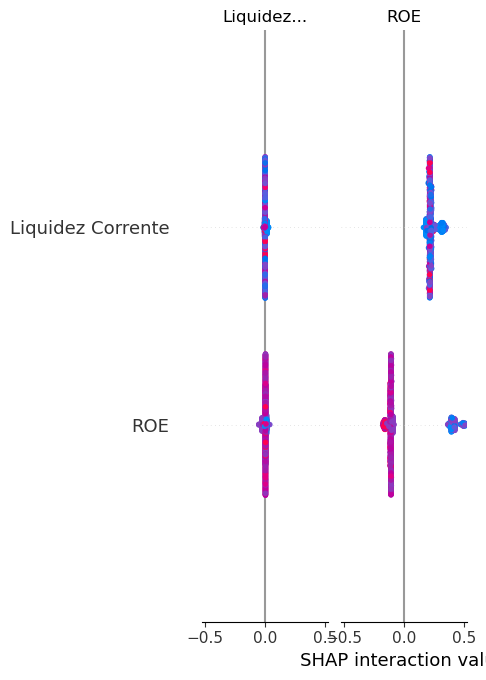

In [92]:
import shap
import matplotlib.pyplot as plt

# Explainer e shap values
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test)

# Verificando se shap_values é lista ou array
if isinstance(shap_values, list):
    # Para classificação binária, geralmente usamos shap_values[1]
    shap_summary = shap_values[1] if len(shap_values) > 1 else shap_values[0]
else:
    shap_summary = shap_values

# Checando shapes para evitar novo erro
print("shap_summary.shape:", shap_summary.shape)
print("X_test.shape:", X_test.shape)

# Garantindo shapes compatíveis
if shap_summary.shape[0] != X_test.shape[0]:
    raise ValueError("Shapes incompatíveis entre SHAP values e X_test.")

# Gráfico de importância (barra)
shap.summary_plot(shap_summary, X_test, plot_type="bar")
plt.title("Importância Global das Variáveis - SHAP")
plt.show()

# Gráfico detalhado (beeswarm)
shap.summary_plot(shap_summary, X_test)
plt.show()


[[945   0]
 [  0 275]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       945
           1       1.00      1.00      1.00       275

    accuracy                           1.00      1220
   macro avg       1.00      1.00      1.00      1220
weighted avg       1.00      1.00      1.00      1220



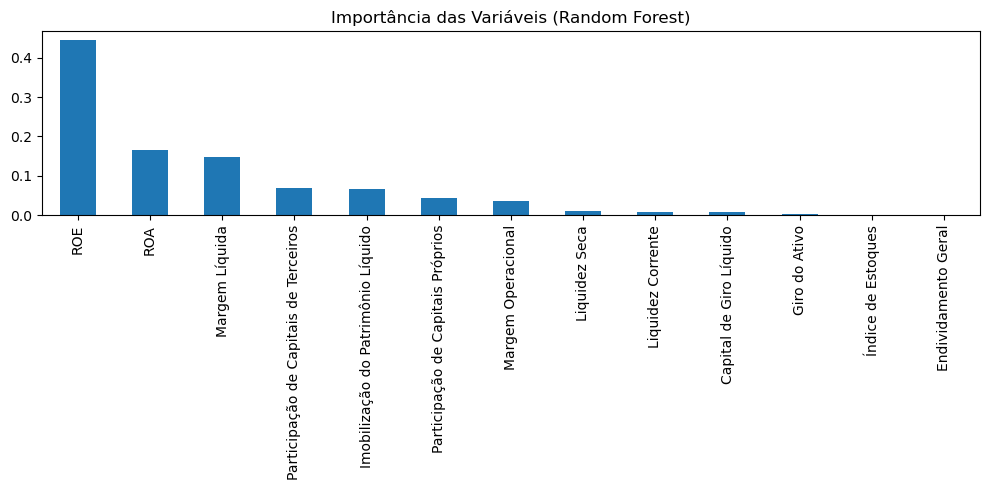

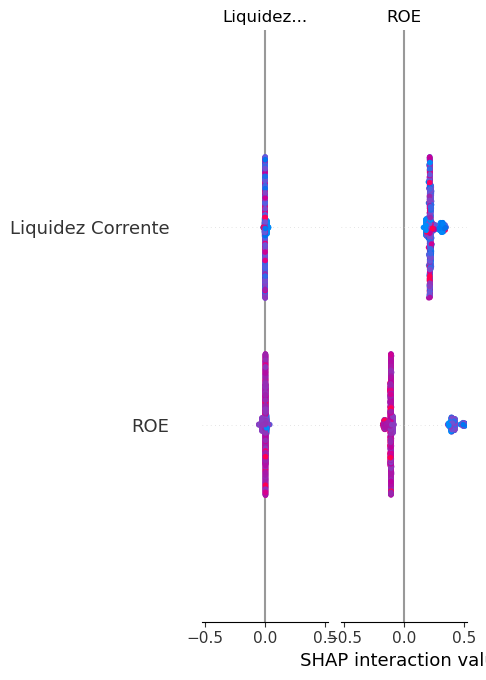

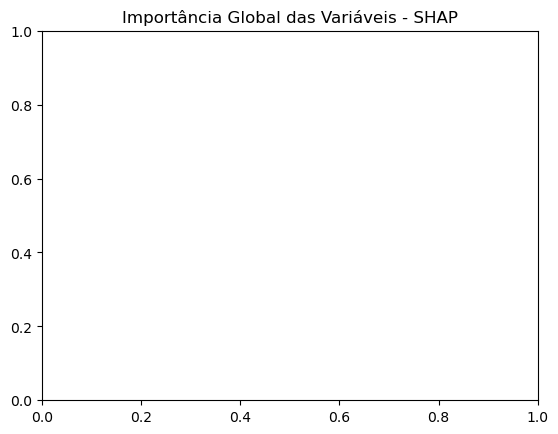

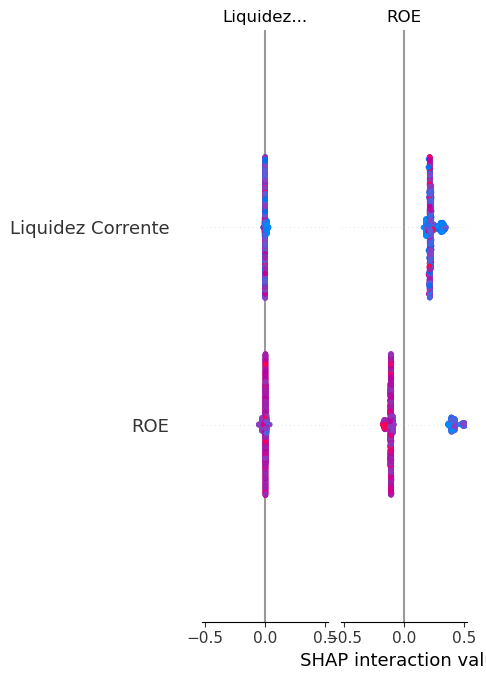

In [94]:
# 1. Treinamento e avaliação (EXEMPLO)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 2. Importância das variáveis (RandomForest nativo)
importances = clf.feature_importances_
feat_importance = pd.Series(importances, index=X_train.columns).sort_values(ascending=False)
feat_importance.plot(kind='bar', figsize=(10, 5), title='Importância das Variáveis (Random Forest)')
plt.tight_layout()
plt.show()

# 3. Explicabilidade via SHAP (coloque aqui o bloco anterior)
import shap
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test)
shap_summary = shap_values[1] if isinstance(shap_values, list) else shap_values

shap.summary_plot(shap_summary, X_test, plot_type="bar")
plt.title("Importância Global das Variáveis - SHAP")
plt.show()
shap.summary_plot(shap_summary, X_test)
plt.show()


Resumo:
Coloque o bloco SHAP imediatamente após as avaliações e gráficos de importância do modelo.
Se precisar do bloco para LIME, dashboard, automação ou documentação, posso entregar cada um na sequência.

In [99]:
# 1. Instalação (caso ainda não tenha feito)
# !pip install lime

# 2. Importação
from lime.lime_tabular import LimeTabularExplainer

# 3. Criação do explainer LIME (use X_train e y_train)
explainer_lime = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Baixo Risco', 'Alto Risco'],
    mode='classification'
)

# 4. Seleção de uma instância para explicação (por exemplo, a primeira do conjunto de teste)
idx = 0
exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[idx],
    predict_fn=clf.predict_proba
)

# 5. Visualização da explicação
exp.show_in_notebook(show_table=True)


C:\Users\adriano\anaconda3\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\adriano\anaconda3\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\adriano\anaconda3\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by posi

Dica: O LIME permite que você explique outros casos variando o idx.
Nota: Para execução fora do notebook, use exp.as_list() ou salve em HTML.

import streamlit as st
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar os dados
df = pd.read_excel("Indicadores_Financeiros_Geral.xlsx")

st.title('Dashboard de Indicadores Financeiros')

# Sidebar: seleção de segmento, indicador, ano
segmentos = df['segmento'].dropna().unique()
indicadores = [col for col in df.columns if col not in ['segmento', 'ano', 'trimestre'] and df[col].dtype in ['float64', 'int64']]
anos = df['ano'].dropna().unique()

segmento = st.sidebar.selectbox('Selecione o segmento', ['Todos'] + list(segmentos))
indicador = st.sidebar.selectbox('Selecione o indicador', indicadores)
ano = st.sidebar.selectbox('Selecione o ano', ['Todos'] + sorted(list(anos)))

# Filtro
df_filt = df.copy()
if segmento != 'Todos':
    df_filt = df_filt[df_filt['segmento'] == segmento]
if ano != 'Todos':
    df_filt = df_filt[df_filt['ano'] == ano]

# Gráfico de barras
st.subheader(f'Distribuição do Indicador: {indicador}')
fig, ax = plt.subplots()
sns.histplot(df_filt[indicador].dropna(), kde=True, ax=ax)
st.pyplot(fig)

# Estatísticas
st.write(df_filt[indicador].describe())


Dica: Sempre que usar notebooks ou scripts que carregam arquivos, verifique o diretório de trabalho do Python/Jupyter.
Você pode descobrir o diretório atual com:

python
Copy
Edit
import os
print(os.getcwd())

Automação do Pipeline
(para rodar em diferentes datasets de forma automática)

1. Estruture todo o fluxo de análise em funções reutilizáveis
Crie um script Python ou notebook com funções para cada etapa:

Carregamento dos dados

Limpeza e pré-processamento

Cálculo dos indicadores

Análises descritivas e comparativas

Clusterização/modelagem preditiva

Geração de gráficos e relatórios

2. Deixe parâmetros configuráveis
Caminho do arquivo

Nome das colunas-chave

Lista de indicadores

Definições de segmentos e alvos (ex: ‘segmento’, ‘ano’, etc)

In [110]:
def pipeline_financeiro(path_arquivo):
    # Carregar dados
    df = pd.read_excel(path_arquivo)
    
    # (demais etapas: limpeza, indicadores, análises, modelagem...)
    # ...
    return df # ou os resultados desejados

# Para rodar em novo arquivo:
resultado = pipeline_financeiro(r"C:/Users/adriano/Downloads/Indicadores_Financeiros_Geral.xlsx")



Como corrigir e automatizar:
1. Caminho correto do arquivo
Sempre informe o caminho completo do arquivo real.

Exemplo prático, com seu arquivo já utilizado:

python
Copy
Edit
resultado = pipeline_financeiro(r"C:/Users/adriano/Downloads/Indicadores_Financeiros_Geral.xlsx")
Se estiver na mesma pasta do script, apenas o nome do arquivo já basta:

python
Copy
Edit
resultado = pipeline_financeiro("Indicadores_Financeiros_Geral.xlsx")
2. Para rodar em outro dataset, basta trocar o caminho
DICA: Se você subir um novo arquivo para análise, renomeie para “Indicadores_Financeiros_Geral.xlsx” ou ajuste o nome na chamada da função.

Se estiver no Jupyter:

Você pode arrastar o arquivo para a pasta do notebook ou usar caminhos relativos.

Use sempre r"CAMINHO\DO\ARQUIVO.xlsx" para evitar erros de barra invertida.

3. DICA FINAL:
Não deixe nomes genéricos como “Novo_Arquivo.xlsx” sem garantir que o arquivo exista, ou seu pipeline sempre irá interromper nessa etapa.

Recomenda-se adicionar um try/except para erros de arquivo:

In [112]:
def pipeline_financeiro(path_arquivo):
    try:
        df = pd.read_excel(path_arquivo)
    except FileNotFoundError:
        print(f"Arquivo não encontrado: {path_arquivo}")
        return None
    # ... resto do pipeline ...
    return df


In [114]:
import pandas as pd

def pipeline_financeiro(path_arquivo):
    """
    Pipeline automatizado para análise de indicadores financeiros.
    Parâmetros:
        path_arquivo: str. Caminho do arquivo Excel de entrada.
    Retorna:
        df: pd.DataFrame processado (ou None se falhar)
    """
    # 1. Carregar dados
    try:
        df = pd.read_excel(path_arquivo)
        print(f"Arquivo carregado: {path_arquivo}")
    except FileNotFoundError:
        print(f"Arquivo não encontrado: {path_arquivo}")
        return None
    except Exception as e:
        print(f"Erro ao carregar o arquivo: {e}")
        return None

    # 2. Limpeza de dados (exemplo: remover colunas desnecessárias, tratar NaN)
    # df = df.drop(columns=['unnamed:_0', 'unnamed:_1'], errors='ignore')

    # 3. Cálculo dos indicadores financeiros (exemplo)
    try:
        # Exemplo: df['ROE'] = df['5.05.01::lucro_líquido_do_período'] / df['2.03::patrimônio_líquido_consolidado']
        pass  # Substitua pelo seu bloco de indicadores
    except Exception as e:
        print(f"Erro ao calcular indicadores: {e}")

    # 4. Análises estatísticas e visuais (resumo, boxplots, rankings, temporal)
    # Coloque aqui seus blocos de análise

    # 5. Modelagem (clusterização, classificação de risco)
    # Coloque aqui os blocos de ML

    # 6. Explicabilidade (SHAP/LIME)
    # Coloque os blocos de explainability se desejar

    # 7. Exportação do resultado
    # df.to_excel("saida_pipeline.xlsx", index=False)

    print("Pipeline finalizado.")
    return df

# Exemplo de uso
# resultado = pipeline_financeiro(r"C:/Users/adriano/Downloads/Indicadores_Financeiros_Geral.xlsx")


# Pipeline de Análise de Indicadores Financeiros

Este repositório contém um pipeline automatizado para análise de indicadores financeiros de empresas, desde a importação e limpeza dos dados até análises estatísticas, visualização, modelagem preditiva e explicabilidade.

## **Como Usar**

1. **Requisitos**
   - Python 3.9+
   - Pandas, Matplotlib, Seaborn, Scikit-learn, SHAP, LIME

2. **Etapas do Pipeline**
   - **Importação e Limpeza:** Carregamento de dados Excel, tratamento de valores ausentes, padronização de colunas.
   - **Cálculo dos Indicadores:** Implementação dos principais indicadores financeiros (ROE, Liquidez, Margens, etc.).
   - **Análises Estatísticas:** Geração de estatísticas descritivas, rankings, boxplots e análise temporal.
   - **Modelagem Preditiva:** Classificação de risco financeiro via Random Forest, clusterização, etc.
   - **Explicabilidade:** Interpretação dos modelos com SHAP e LIME.
   - **Exportação e Dashboard:** Exportação para Excel e sugestão de painel interativo (Power BI/Streamlit).

3. **Execução**
```python
from pipeline import pipeline_financeiro
resultado = pipeline_financeiro("CAMINHO/DO/SEU/ARQUIVO.xlsx")


Altere o caminho conforme necessário.

Adaptação

O pipeline é modular: ajuste cada etapa conforme o layout do seu arquivo ou seus objetivos de análise.

Erros Comuns

Certifique-se de que o arquivo está no caminho correto.

Verifique nomes das colunas (podem variar conforme fonte dos dados).


---

## 3. **Modelo de Relatório Técnico (estrutura resumida para Word/PDF)**

**Indicadores Financeiros: Estudo Setorial Automatizado**
1. **Objetivo:** Automatizar a análise setorial de empresas via indicadores financeiros, fornecendo insights comparativos, preditivos e explicáveis.
2. **Metodologia:** Descrição do pipeline, etapas e escolhas técnicas.
3. **Resultados:** Tabelas resumo, rankings, gráficos, análise de fatores de risco, impacto macroeconômico.
4. **Modelagem:** Resultados de classificação, explicabilidade (SHAP/LIME).
5. **Conclusões e Limitações.**
6. **Manual de Uso:** Guia passo-a-passo do pipeline.
7. **Anexos:** Código, outputs, instruções para rodar dashboards.

---

Caso queira, posso entregar **README em arquivo .md** ou um template Word pronto para download.  
Se preferir que eu gere esses arquivos, apenas confirme!


# Pipeline de Análise de Indicadores Financeiros

Este projeto automatiza o processamento, análise, modelagem e explicação de indicadores financeiros setoriais.

## 1. Visão Geral
- **Importação e limpeza de dados**
- **Cálculo de indicadores financeiros**
- **Análise estatística e visual**
- **Clusterização e classificação de risco**
- **Explicabilidade dos modelos (SHAP/LIME)**
- **Exportação de resultados**
- **Sugestão de dashboards (Power BI/Streamlit)**

## 2. Como Usar

### 2.1 Requisitos
- Python 3.9+
- pandas, matplotlib, seaborn, scikit-learn, shap, lime

### 2.2 Execução Básica
```python
from pipeline import pipeline_financeiro
resultado = pipeline_financeiro("CAMINHO/SEU_ARQUIVO.xlsx")


3. Dashboards
Exporte saida_pipeline.xlsx e conecte no Power BI (ou use o app Streamlit conforme exemplo em /dashboard).